# Seasonal meterological analysis

# Set the figure size to fit an A4 portrait width
plt.figure(figsize=(8.27, 6))  # 8.27 inches wide, adjust height as needed

# Set the figure size to fit an A4 landscape width
plt.figure(figsize=(11.7, 6))  # 11.7 inches wide, adjust height as needed

Typical Margin Considerations
Standard Document Margins: Often, documents have margins of about 1 inch (2.54 cm) on all sides. This means you have less usable width on the page.
Portrait A4 Page: Usable width ≈ 6.27 inches (8.27 inches - 2 inches for margins)
Landscape A4 Page: Usable width ≈ 9.7 inches (11.7 inches - 2 inches for margins)
Adjusting figsize for Standard Margins

In [1]:
import pandas as pd
import os
from glob import glob
from statistics import mean
import seaborn as sns

# Import libraries
import matplotlib.pyplot as plt
import numpy as np

import matplotlib as mpl
mpl.rcParams['axes.titlesize'] = 15
mpl.rcParams['axes.labelsize'] = 10
mpl.rcParams['xtick.labelsize'] = 9
mpl.rcParams['ytick.labelsize'] = 9
mpl.rcParams['legend.fontsize'] = 9

%matplotlib inline

In [2]:
def mk_dir_fn(path_):
    
    if not os.path.isdir(path_):
        os.mkdir(path_)
 

In [3]:
# type of data
d_type = "daily_rain"
#d_type = "et_morton_actual"
# d_type = "max_temp"
#d_type = "min_temp"
#d_type = "rh_tmax"
#d_type = "rh_tmin"
# d_type = "vp"


if d_type == "daily_rain":
    str_type = "rainfall"
    y_lim = [-5, 30]
    unit = "mm"
    
elif d_type == "et_morton_actual":
    str_type = "Morton's evapotranspiration"
    y_lim = [0, 10]
    unit = "mm"

elif d_type == "max_temp":
    str_type = "maximum temperature"
    y_lim = [20, 45]
    unit = "\u2103"

elif d_type == "min_temp":
    str_type = "minimum temperature"
    y_lim = [0, 40]
    unit = "\u2103"

elif d_type == "rh_tmax":
    str_type = "relative humidity at maximum temperature"
    y_lim = [3200, 3400]
    unit = "%"
    
elif d_type == "rh_tmin":
    str_type = "relative humidity at minimum temperature"
    y_lim = [3200, 3400]
    unit = "%"

elif d_type == "vp":
    str_type = "vapour pressure"
    
else:
    pass

# met data
#dir_ = r"X:\PGB\RSU\biomass\raw_zonal_stats\met\collation\slats_tern\{0}".format(d_type)
#dir_ = r"C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\{0}\cor".format(d_type)
dir_ = r"C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\{0}\mth_msum".format(d_type)

# plot directories
export_dir = r"C:\Users\robot\projects\biomass\plots\{0}".format(d_type)
mk_dir_fn(export_dir)

export_box = os.path.join(export_dir, "box_plots")
mk_dir_fn(export_box)
export_box = os.path.join(export_dir, "box_plots", "total")
mk_dir_fn(export_box)


export_line = os.path.join(export_dir, "timeseries")
mk_dir_fn(export_line)
export_line = os.path.join(export_dir, "timeseries", "total")
mk_dir_fn(export_line)



# csv_export = r"C:\Users\robot\projects\biomass\met_zonal_stats_per_site\{0}".format(d_type)
# mk_dir_fn(csv_export)

# box_dir = os.path.join(csv_export, d_type)
# mk_dir_fn(box_dir)

# time_dir = os.path.join(export_line, d_type)
# mk_dir_fn(time_dir)


In [4]:
dir_

'C:\\Users\\robot\\projects\\biomass\\zonal_stats_raw\\met_clean\\daily_rain\\mth_msum'

In [5]:
#dir_ = r"C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum"

# Box Plot

In [6]:
# import pandas as pd
# import matplotlib.pyplot as plt
# import seaborn as sns
# import os
# from glob import glob

# # Function to change the day of the date
# def change_day(date, new_day):
#     return date + pd.DateOffset(day=new_day)

# # Directory containing the CSV files (make sure this is defined)
# # dir_ = "path_to_your_csv_files"
# # export_box = "path_to_export_box"

# for f in glob(os.path.join(dir_, "*.csv")):
#     csv_file = f
#     print("-" * 100)
#     print("Working for: ", f)
    
#     df = pd.read_csv(csv_file)
#     df.dropna(inplace=True)
    
#     # Extract name and site year
#     _, f = os.path.split(csv_file)
#     flist = f.split("_")
#     print("flist: ", flist)
#     site_name, field_year = flist[0].split(".")
#     print(site_name, field_year)

#     # Convert date and add a new day
#     df['date'] = pd.to_datetime(df['im_date'], format='%Y%m')
#     df['day'] = 15
    
#     # Apply the function to the DataFrame
#     df['new_date'] = df.apply(lambda row: change_day(row['date'], row['day']), axis=1)
#     df['month'] = df['new_date'].dt.month
#     df['year'] = df['new_date'].dt.year
    
#     # Filter data to include at most 30 years
#     start_year = df['year'].min()
#     df = df[df['year'] <= start_year + 30]
    
#     # Mapping month numbers to month names
#     month_map = {
#         1: 'Jan', 2: 'Feb', 3: 'Mar', 4: 'Apr', 5: 'May', 6: 'Jun',
#         7: 'Jul', 8: 'Aug', 9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Dec'
#     }
#     df['month_name'] = df['month'].map(month_map)
    
#     # Capitalize site name and str_type
#     cap_site_name = site_name.upper()
#     capitalized_str_type = str_type.capitalize()
    
#     # Count the number of unique years
#     unique_years = df['year'].nunique()

#     # Plotting
#     plt.figure(figsize=(10, 6))
#     plt.figure(figsize=(7, 3.5))
#     ax = sns.boxplot(x='month_name', y='mean', data=df, order=list(month_map.values()), palette='gray')
#     plt.xlabel('Month')
#     plt.ylabel(f'{capitalized_str_type} {unit}')
    
#     # Customize the plot to remove fill color
#     for patch in ax.artists:
#         patch.set_facecolor('none')  # Remove fill color
    
#     box_out = os.path.join(export_box, f"{site_name}_{field_year}_{d_type}_total_box.jpg")
#     plt.savefig(box_out, bbox_inches='tight', dpi=300)
    
#     plt.show()
#     print(f"Exported to: {box_out}")

----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\agb02.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['agb02.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
agb02 2012


<Figure size 720x432 with 0 Axes>

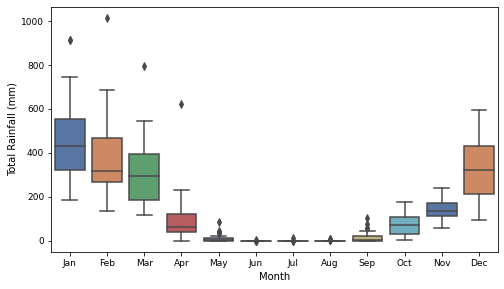

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\agb02_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\amg01.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['amg01.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
amg01 2012


<Figure size 720x432 with 0 Axes>

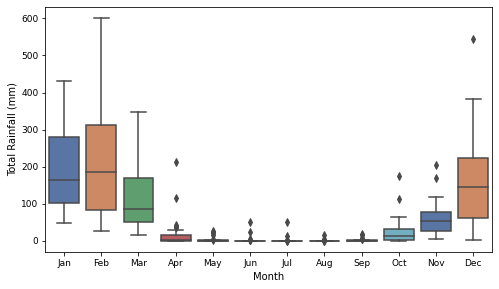

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\amg01_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\amg03.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['amg03.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
amg03 2012


<Figure size 720x432 with 0 Axes>

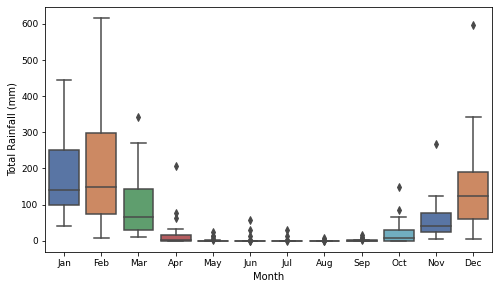

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\amg03_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\amg05.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['amg05.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
amg05 2012


<Figure size 720x432 with 0 Axes>

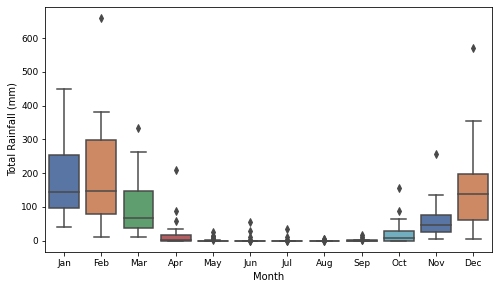

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\amg05_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\amg06.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['amg06.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
amg06 2012


<Figure size 720x432 with 0 Axes>

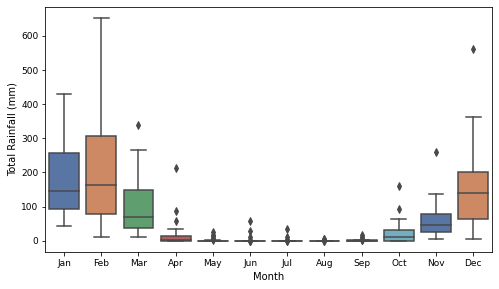

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\amg06_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\amg08.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['amg08.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
amg08 2012


<Figure size 720x432 with 0 Axes>

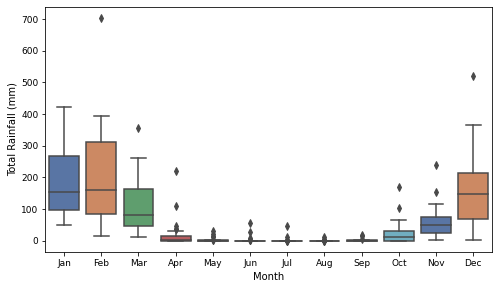

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\amg08_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\amg10.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['amg10.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
amg10 2012


<Figure size 720x432 with 0 Axes>

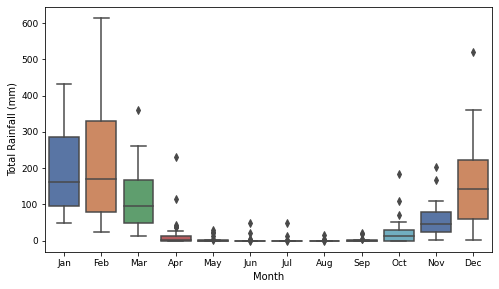

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\amg10_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ant01.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ant01.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ant01 2012


<Figure size 720x432 with 0 Axes>

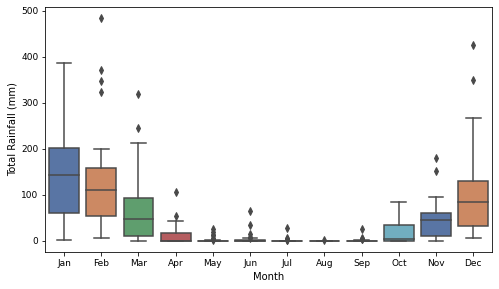

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ant01_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ant02.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ant02.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ant02 2012


<Figure size 720x432 with 0 Axes>

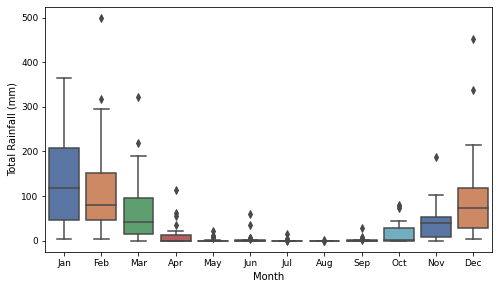

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ant02_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ant03.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ant03.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ant03 2012


<Figure size 720x432 with 0 Axes>

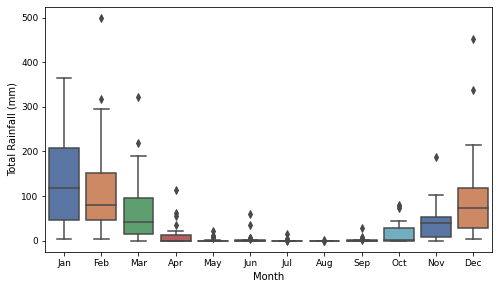

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ant03_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ant04.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ant04.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ant04 2012


<Figure size 720x432 with 0 Axes>

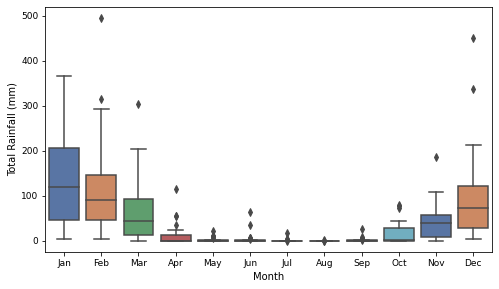

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ant04_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ant06.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ant06.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ant06 2012


<Figure size 720x432 with 0 Axes>

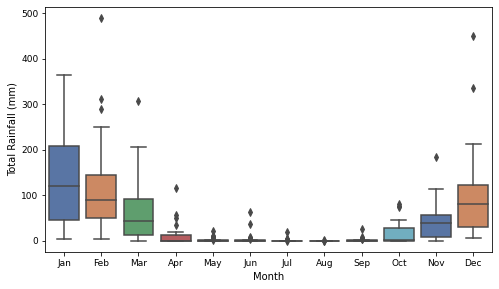

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ant06_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ant07.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ant07.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ant07 2012


<Figure size 720x432 with 0 Axes>

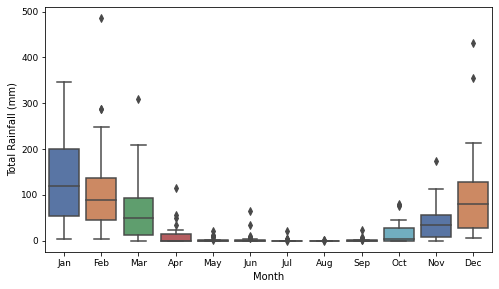

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ant07_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ant09.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ant09.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ant09 2012


<Figure size 720x432 with 0 Axes>

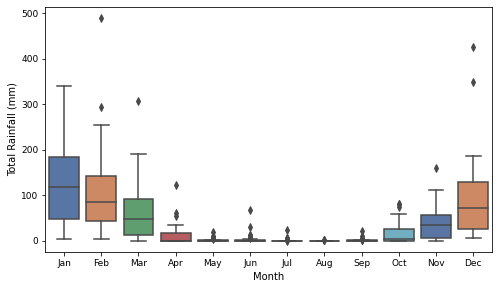

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ant09_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\antgr01.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['antgr01.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
antgr01 2012


<Figure size 720x432 with 0 Axes>

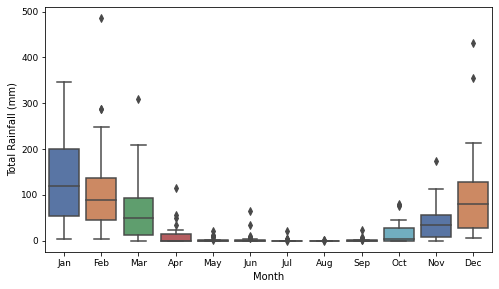

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\antgr01_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\auv01.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['auv01.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
auv01 2012


<Figure size 720x432 with 0 Axes>

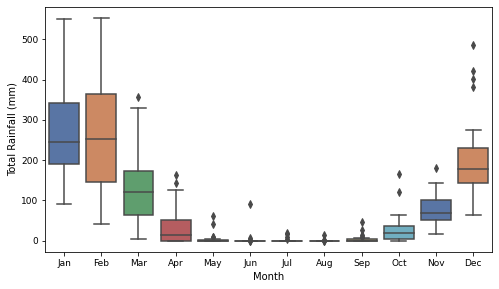

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\auv01_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\auv02.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['auv02.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
auv02 2012


<Figure size 720x432 with 0 Axes>

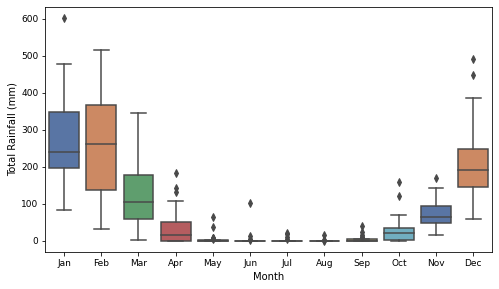

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\auv02_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\auv03.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['auv03.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
auv03 2012


<Figure size 720x432 with 0 Axes>

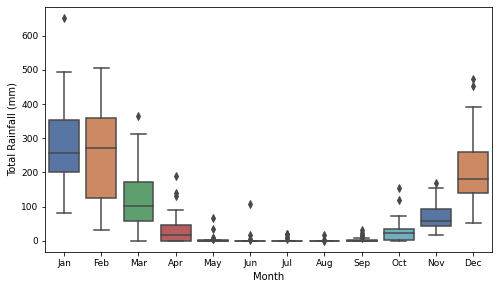

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\auv03_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\auv05.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['auv05.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
auv05 2012


<Figure size 720x432 with 0 Axes>

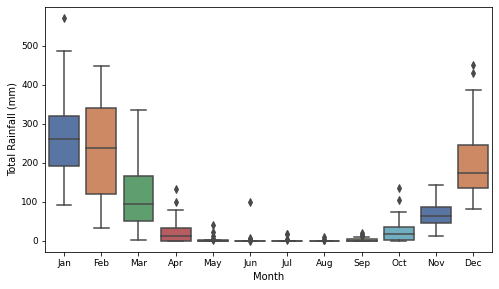

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\auv05_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\auv06.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['auv06.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
auv06 2012


<Figure size 720x432 with 0 Axes>

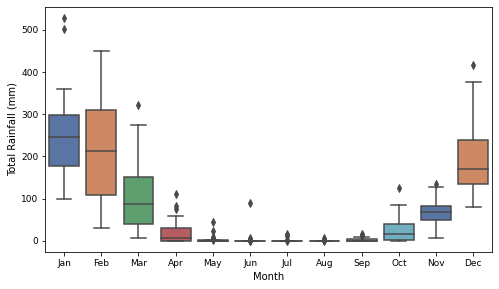

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\auv06_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\auv07.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['auv07.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
auv07 2012


<Figure size 720x432 with 0 Axes>

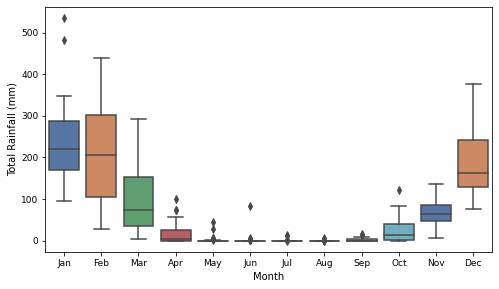

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\auv07_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\auv08.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['auv08.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
auv08 2012


<Figure size 720x432 with 0 Axes>

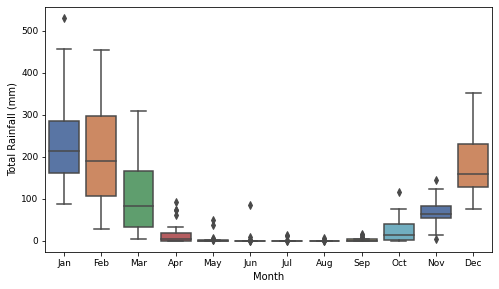

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\auv08_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\auv09.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['auv09.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
auv09 2012


<Figure size 720x432 with 0 Axes>

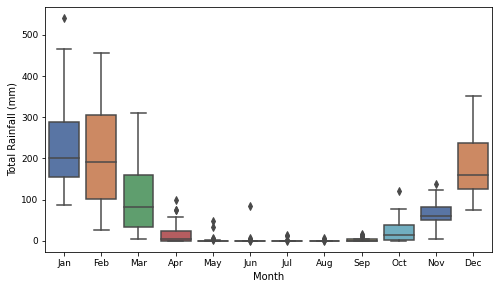

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\auv09_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\barkely01.2011_1ha_mth_msum_zonal_stats.csv
flist:  ['barkely01.2011', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
barkely01 2011


<Figure size 720x432 with 0 Axes>

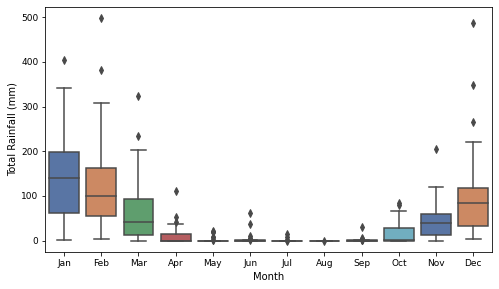

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\barkely01_2011_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\barkely02.2011_1ha_mth_msum_zonal_stats.csv
flist:  ['barkely02.2011', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
barkely02 2011


<Figure size 720x432 with 0 Axes>

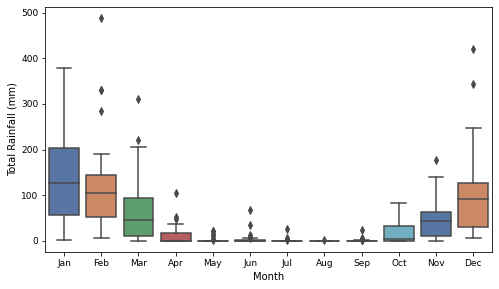

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\barkely02_2011_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\barkely03.2011_1ha_mth_msum_zonal_stats.csv
flist:  ['barkely03.2011', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
barkely03 2011


<Figure size 720x432 with 0 Axes>

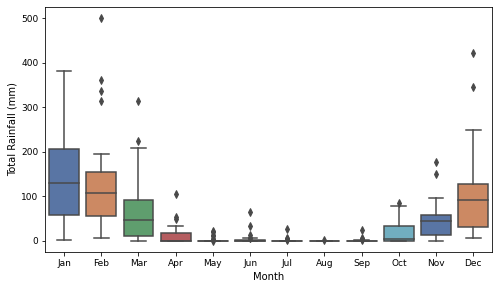

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\barkely03_2011_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\barkely04.2011_1ha_mth_msum_zonal_stats.csv
flist:  ['barkely04.2011', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
barkely04 2011


<Figure size 720x432 with 0 Axes>

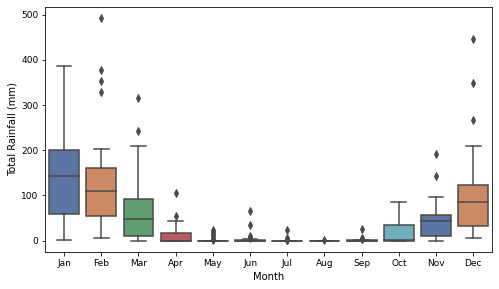

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\barkely04_2011_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\barkely05.2011_1ha_mth_msum_zonal_stats.csv
flist:  ['barkely05.2011', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
barkely05 2011


<Figure size 720x432 with 0 Axes>

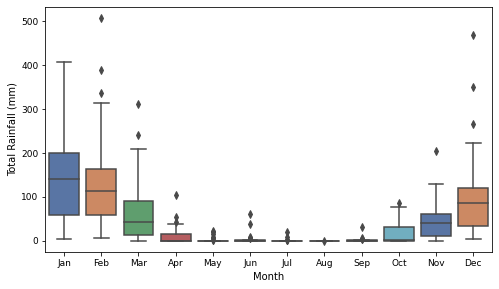

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\barkely05_2011_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\barkely06.2011_1ha_mth_msum_zonal_stats.csv
flist:  ['barkely06.2011', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
barkely06 2011


<Figure size 720x432 with 0 Axes>

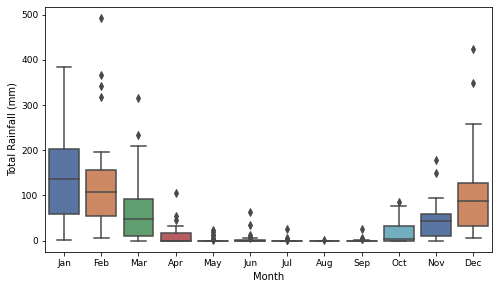

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\barkely06_2011_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\barkely07.2011_1ha_mth_msum_zonal_stats.csv
flist:  ['barkely07.2011', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
barkely07 2011


<Figure size 720x432 with 0 Axes>

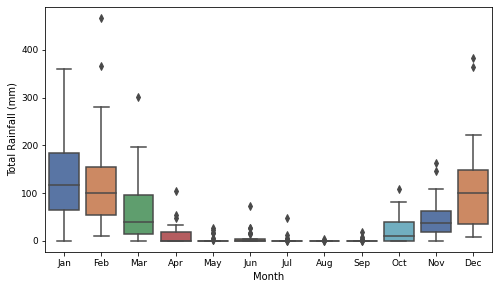

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\barkely07_2011_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\bc101.2024_1ha_mth_msum_zonal_stats.csv
flist:  ['bc101.2024', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
bc101 2024


<Figure size 720x432 with 0 Axes>

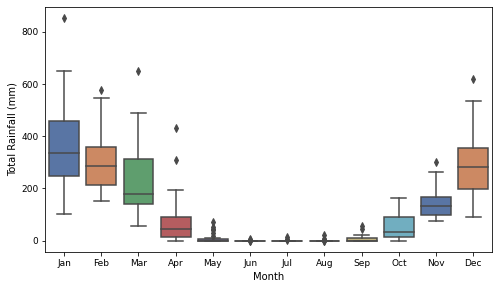

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\bc101_2024_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\buff01.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['buff01.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
buff01 2012


<Figure size 720x432 with 0 Axes>

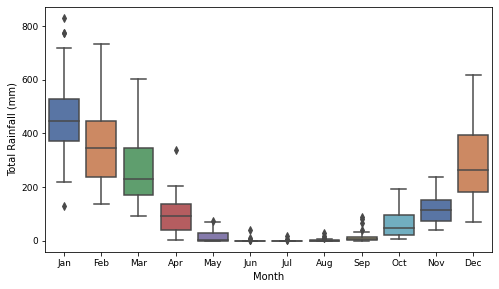

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\buff01_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\centa13.2013_1ha_mth_msum_zonal_stats.csv
flist:  ['centa13.2013', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
centa13 2013


<Figure size 720x432 with 0 Axes>

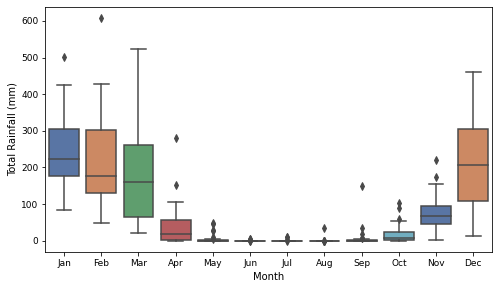

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\centa13_2013_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\centa14.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['centa14.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
centa14 2012


<Figure size 720x432 with 0 Axes>

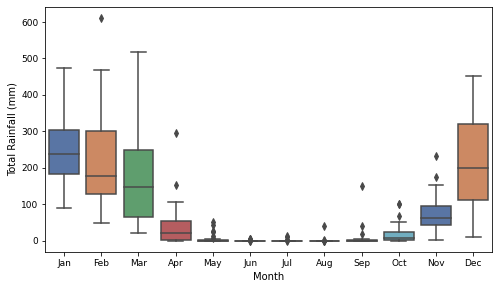

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\centa14_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\cpr01.2024_1ha_mth_msum_zonal_stats.csv
flist:  ['cpr01.2024', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
cpr01 2024


<Figure size 720x432 with 0 Axes>

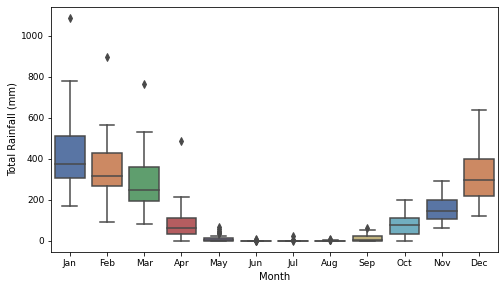

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\cpr01_2024_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\cpr02.2024_1ha_mth_msum_zonal_stats.csv
flist:  ['cpr02.2024', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
cpr02 2024


<Figure size 720x432 with 0 Axes>

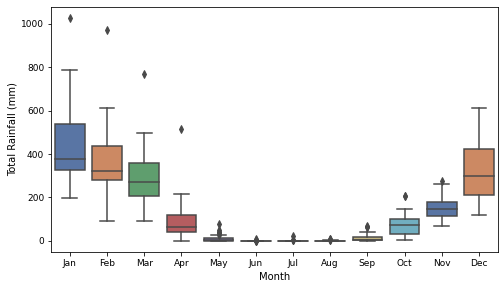

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\cpr02_2024_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\cpr03.2024_1ha_mth_msum_zonal_stats.csv
flist:  ['cpr03.2024', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
cpr03 2024


<Figure size 720x432 with 0 Axes>

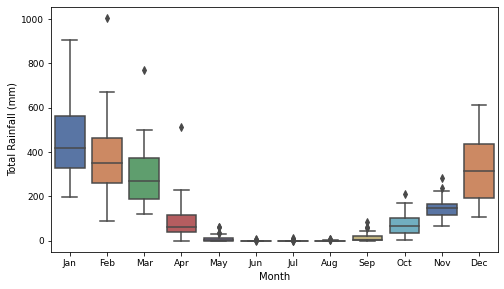

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\cpr03_2024_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\cpr04.2024_1ha_mth_msum_zonal_stats.csv
flist:  ['cpr04.2024', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
cpr04 2024


<Figure size 720x432 with 0 Axes>

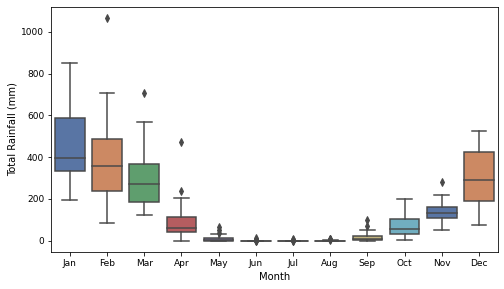

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\cpr04_2024_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\el01.2013_1ha_mth_msum_zonal_stats.csv
flist:  ['el01.2013', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
el01 2013


<Figure size 720x432 with 0 Axes>

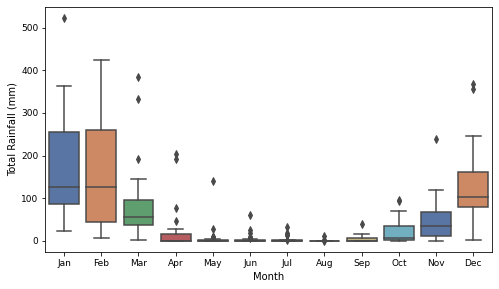

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\el01_2013_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\el02.2013_1ha_mth_msum_zonal_stats.csv
flist:  ['el02.2013', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
el02 2013


<Figure size 720x432 with 0 Axes>

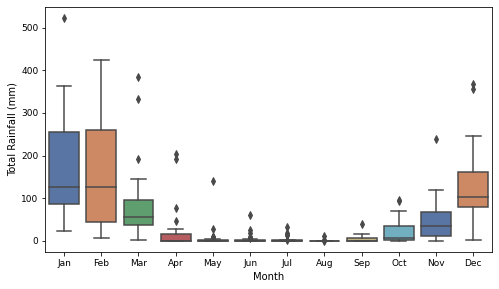

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\el02_2013_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ep01.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ep01.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ep01 2012


<Figure size 720x432 with 0 Axes>

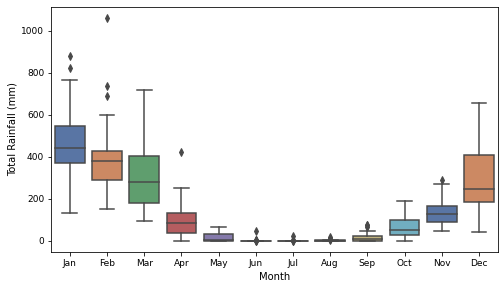

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ep01_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\fin101.2024_1ha_mth_msum_zonal_stats.csv
flist:  ['fin101.2024', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
fin101 2024


<Figure size 720x432 with 0 Axes>

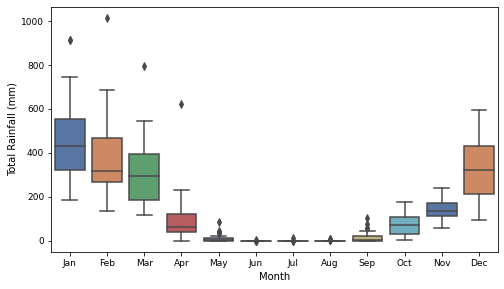

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\fin101_2024_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\fin102.2024_1ha_mth_msum_zonal_stats.csv
flist:  ['fin102.2024', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
fin102 2024


<Figure size 720x432 with 0 Axes>

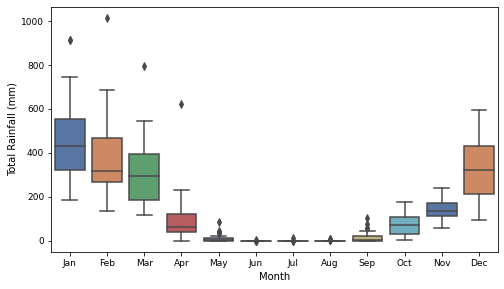

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\fin102_2024_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\girra01.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['girra01.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
girra01 2012


<Figure size 720x432 with 0 Axes>

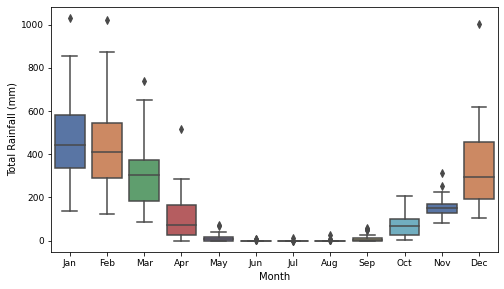

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\girra01_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\girra02.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['girra02.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
girra02 2012


<Figure size 720x432 with 0 Axes>

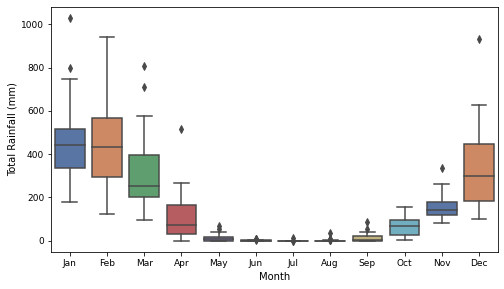

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\girra02_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\gulf10.2013_1ha_mth_msum_zonal_stats.csv
flist:  ['gulf10.2013', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
gulf10 2013


<Figure size 720x432 with 0 Axes>

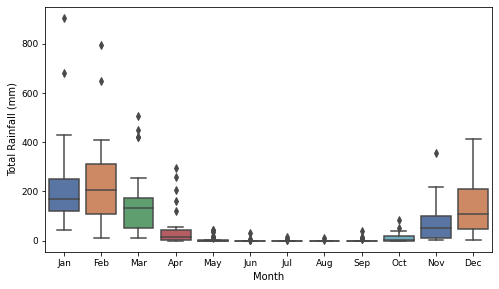

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\gulf10_2013_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\gulf11.2013_1ha_mth_msum_zonal_stats.csv
flist:  ['gulf11.2013', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
gulf11 2013


<Figure size 720x432 with 0 Axes>

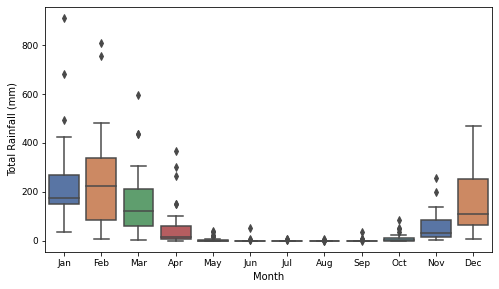

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\gulf11_2013_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\gulf12.2013_1ha_mth_msum_zonal_stats.csv
flist:  ['gulf12.2013', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
gulf12 2013


<Figure size 720x432 with 0 Axes>

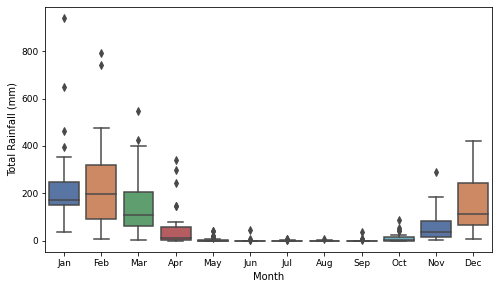

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\gulf12_2013_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\hsf01.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['hsf01.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
hsf01 2012


<Figure size 720x432 with 0 Axes>

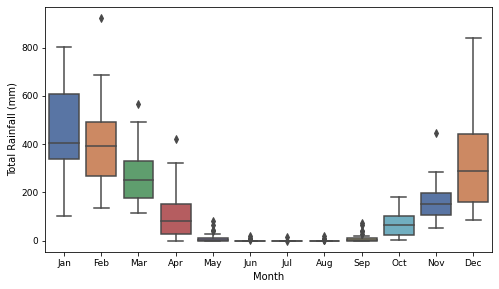

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\hsf01_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\hsf02.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['hsf02.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
hsf02 2012


<Figure size 720x432 with 0 Axes>

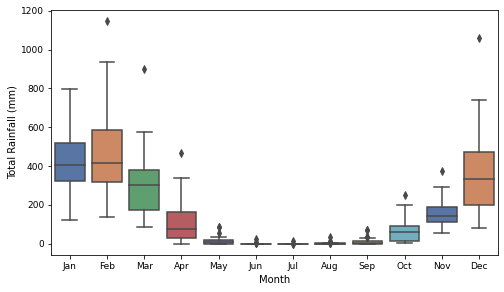

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\hsf02_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\hshr01.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['hshr01.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
hshr01 2012


<Figure size 720x432 with 0 Axes>

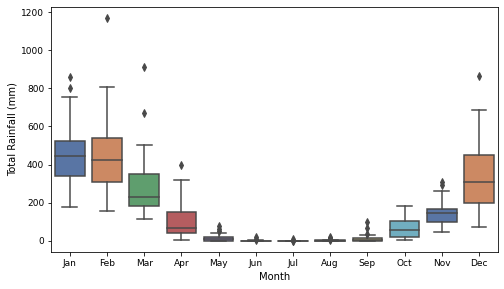

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\hshr01_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\jdr01.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['jdr01.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
jdr01 2012


<Figure size 720x432 with 0 Axes>

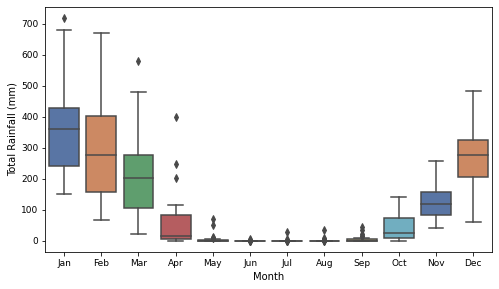

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\jdr01_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\jdr02.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['jdr02.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
jdr02 2012


<Figure size 720x432 with 0 Axes>

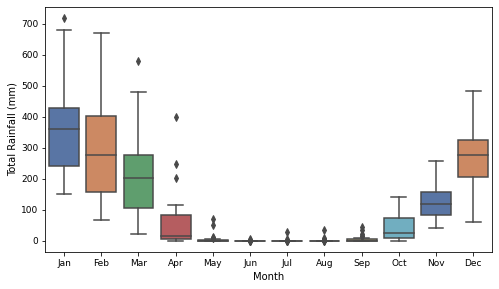

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\jdr02_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\jdr03.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['jdr03.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
jdr03 2012


<Figure size 720x432 with 0 Axes>

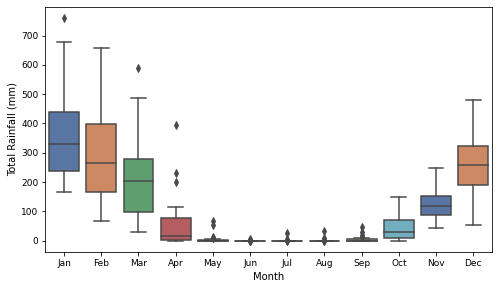

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\jdr03_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\jdr04.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['jdr04.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
jdr04 2012


<Figure size 720x432 with 0 Axes>

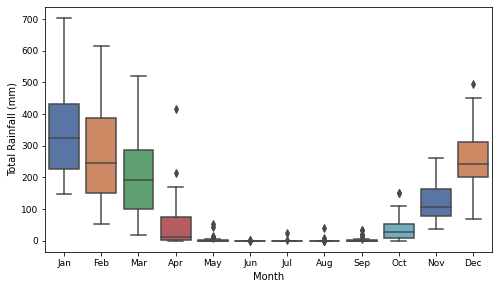

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\jdr04_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\jdr05.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['jdr05.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
jdr05 2012


<Figure size 720x432 with 0 Axes>

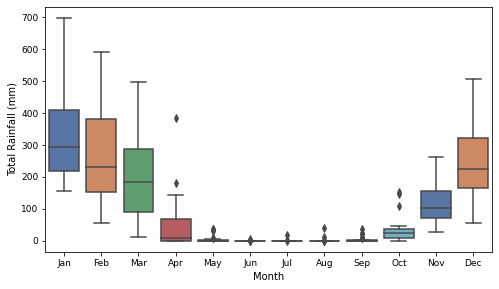

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\jdr05_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\jnk101.2024_1ha_mth_msum_zonal_stats.csv
flist:  ['jnk101.2024', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
jnk101 2024


<Figure size 720x432 with 0 Axes>

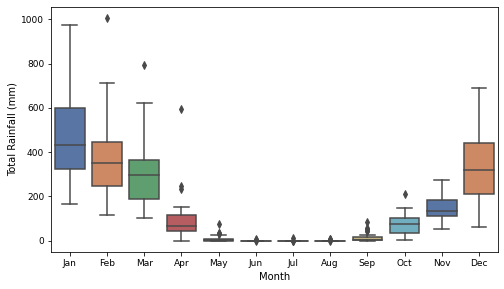

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\jnk101_2024_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\jnk102.2024_1ha_mth_msum_zonal_stats.csv
flist:  ['jnk102.2024', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
jnk102 2024


<Figure size 720x432 with 0 Axes>

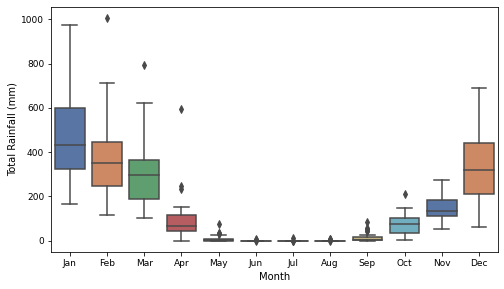

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\jnk102_2024_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\jnk103.2024_1ha_mth_msum_zonal_stats.csv
flist:  ['jnk103.2024', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
jnk103 2024


<Figure size 720x432 with 0 Axes>

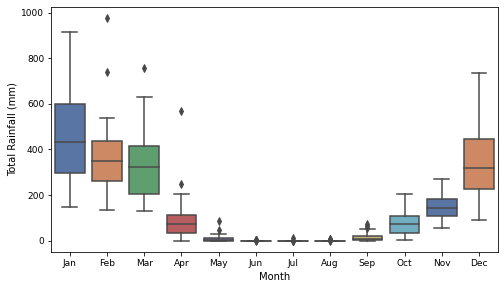

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\jnk103_2024_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\larr15.2013_1ha_mth_msum_zonal_stats.csv
flist:  ['larr15.2013', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
larr15 2013


<Figure size 720x432 with 0 Axes>

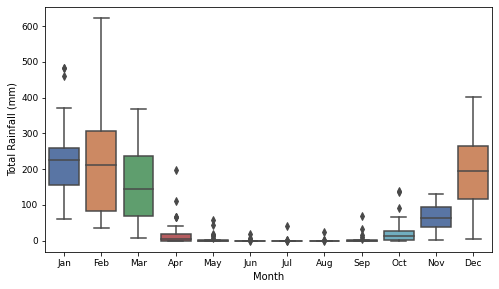

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\larr15_2013_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\legu01.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['legu01.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
legu01 2012


<Figure size 720x432 with 0 Axes>

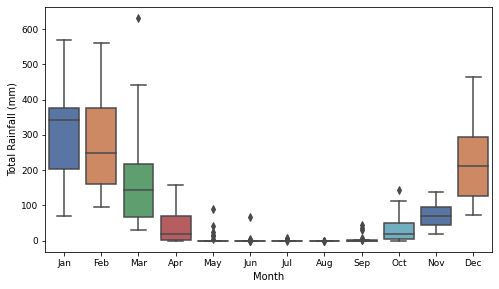

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\legu01_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\legu02.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['legu02.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
legu02 2012


<Figure size 720x432 with 0 Axes>

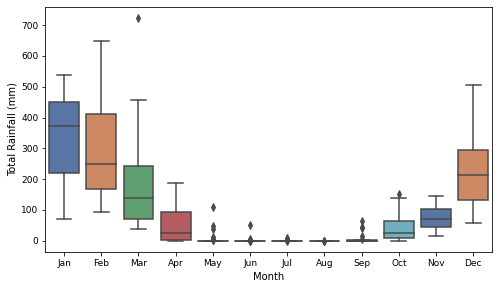

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\legu02_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\legu03.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['legu03.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
legu03 2012


<Figure size 720x432 with 0 Axes>

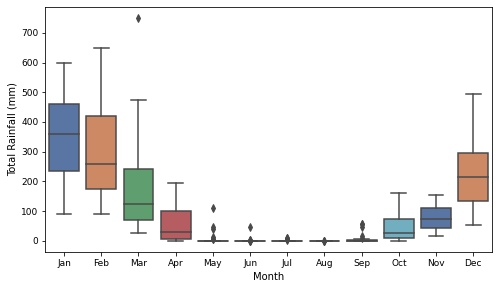

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\legu03_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\legu04.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['legu04.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
legu04 2012


<Figure size 720x432 with 0 Axes>

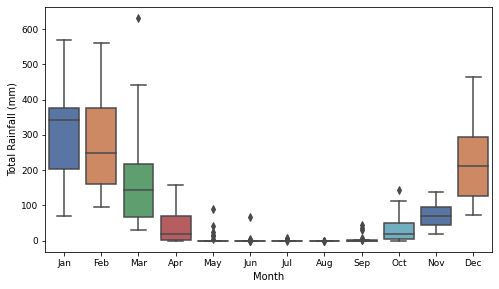

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\legu04_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\legu05.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['legu05.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
legu05 2012


<Figure size 720x432 with 0 Axes>

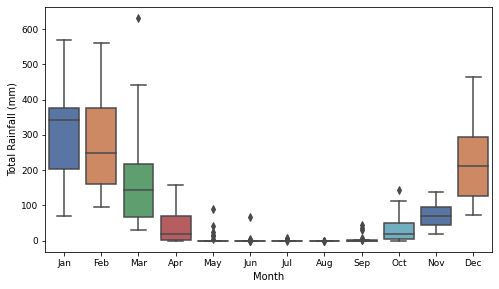

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\legu05_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\legu06.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['legu06.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
legu06 2012


<Figure size 720x432 with 0 Axes>

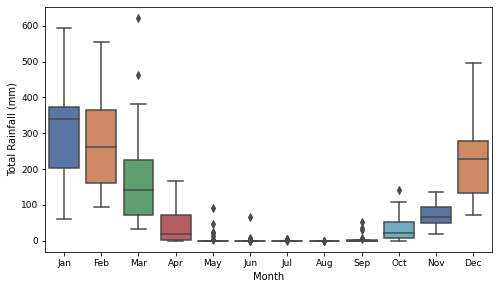

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\legu06_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\legu07.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['legu07.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
legu07 2012


<Figure size 720x432 with 0 Axes>

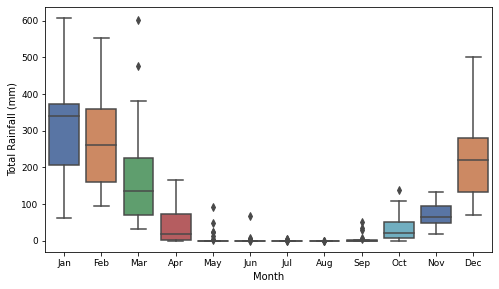

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\legu07_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\legu08.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['legu08.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
legu08 2012


<Figure size 720x432 with 0 Axes>

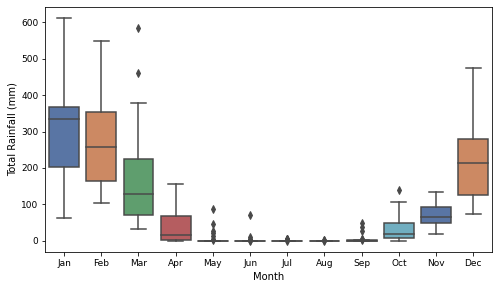

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\legu08_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\lfr101.2024_1ha_mth_msum_zonal_stats.csv
flist:  ['lfr101.2024', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
lfr101 2024


<Figure size 720x432 with 0 Axes>

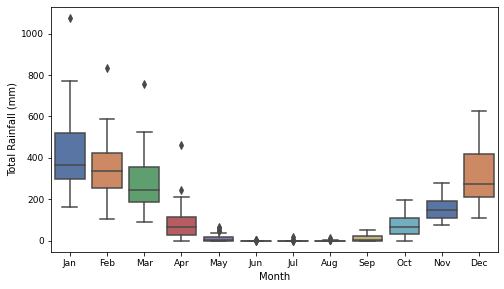

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\lfr101_2024_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\lfr102.2024_1ha_mth_msum_zonal_stats.csv
flist:  ['lfr102.2024', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
lfr102 2024


<Figure size 720x432 with 0 Axes>

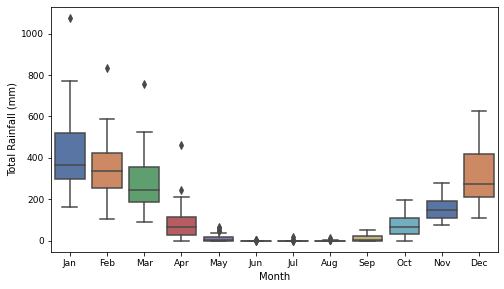

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\lfr102_2024_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\lim01.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['lim01.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
lim01 2012


<Figure size 720x432 with 0 Axes>

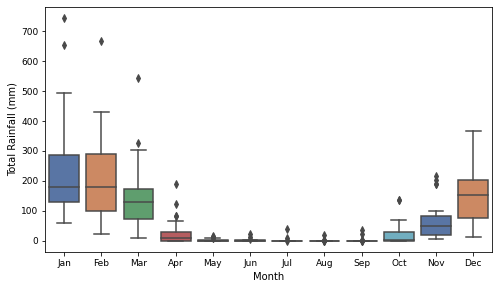

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\lim01_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\lim03.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['lim03.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
lim03 2012


<Figure size 720x432 with 0 Axes>

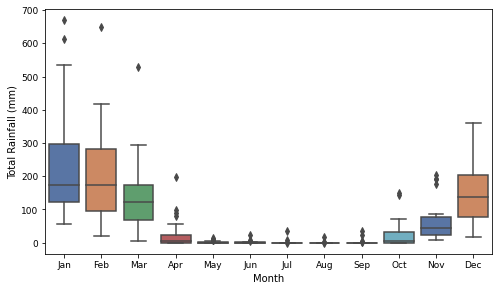

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\lim03_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\lim04.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['lim04.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
lim04 2012


<Figure size 720x432 with 0 Axes>

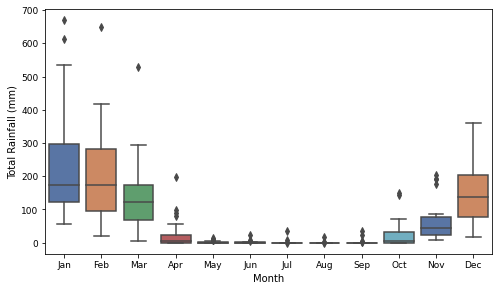

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\lim04_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\lim06.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['lim06.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
lim06 2012


<Figure size 720x432 with 0 Axes>

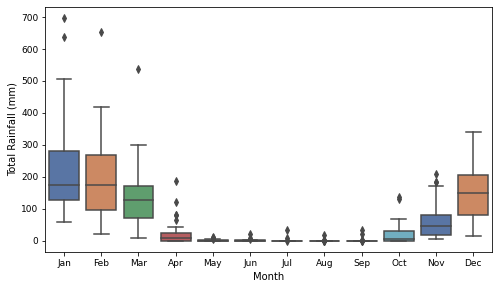

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\lim06_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\lim08.2013_1ha_mth_msum_zonal_stats.csv
flist:  ['lim08.2013', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
lim08 2013


<Figure size 720x432 with 0 Axes>

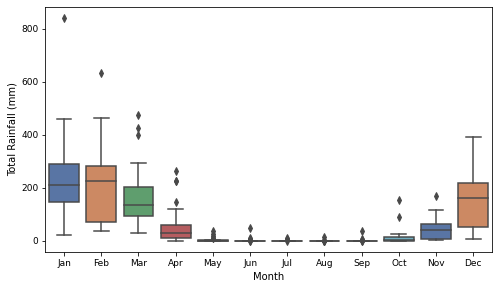

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\lim08_2013_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\lim09.2013_1ha_mth_msum_zonal_stats.csv
flist:  ['lim09.2013', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
lim09 2013


<Figure size 720x432 with 0 Axes>

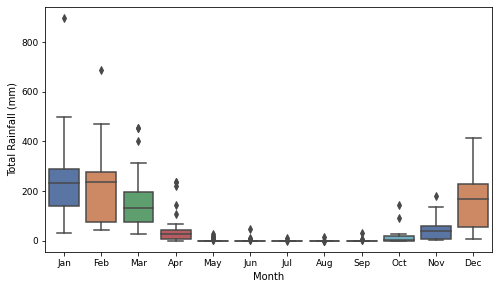

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\lim09_2013_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\lit01.2013_1ha_mth_msum_zonal_stats.csv
flist:  ['lit01.2013', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
lit01 2013


<Figure size 720x432 with 0 Axes>

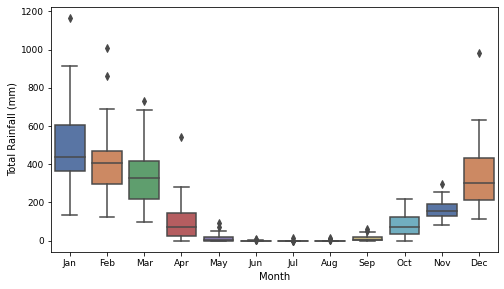

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\lit01_2013_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\lto04.2013_1ha_mth_msum_zonal_stats.csv
flist:  ['lto04.2013', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
lto04 2013


<Figure size 720x432 with 0 Axes>

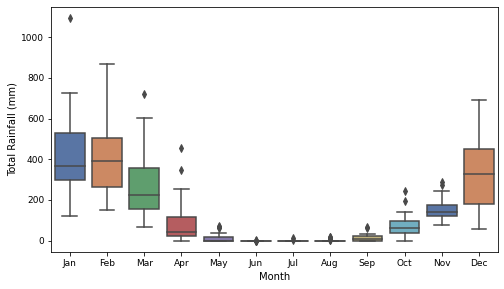

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\lto04_2013_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\lto05.2013_1ha_mth_msum_zonal_stats.csv
flist:  ['lto05.2013', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
lto05 2013


<Figure size 720x432 with 0 Axes>

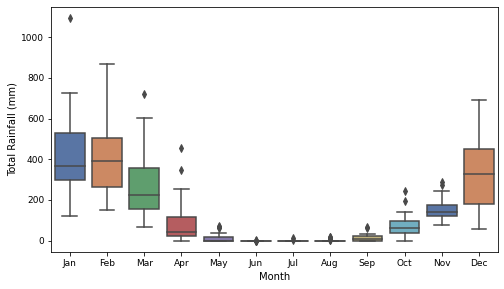

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\lto05_2013_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\nc02.2013_1ha_mth_msum_zonal_stats.csv
flist:  ['nc02.2013', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
nc02 2013


<Figure size 720x432 with 0 Axes>

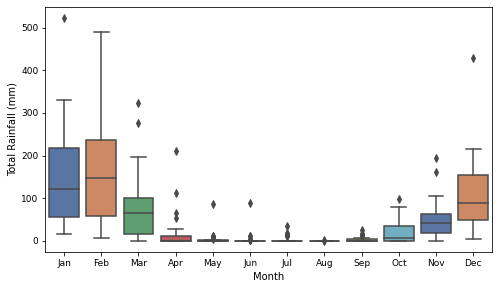

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\nc02_2013_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\nc03.2013_1ha_mth_msum_zonal_stats.csv
flist:  ['nc03.2013', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
nc03 2013


<Figure size 720x432 with 0 Axes>

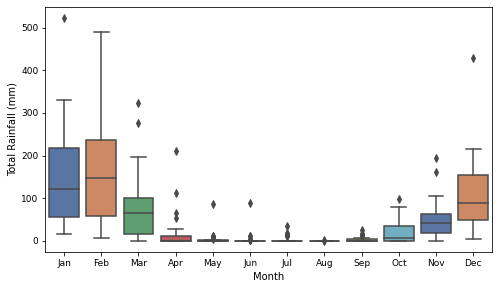

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\nc03_2013_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\nt001.2011_1ha_mth_msum_zonal_stats.csv
flist:  ['nt001.2011', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
nt001 2011


<Figure size 720x432 with 0 Axes>

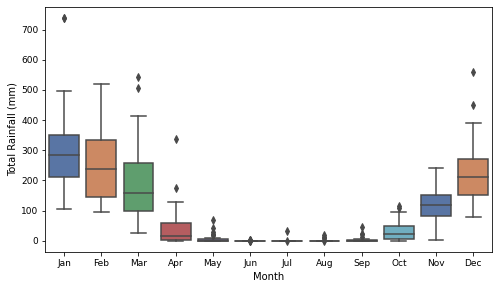

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\nt001_2011_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\nt002.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['nt002.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
nt002 2012


<Figure size 720x432 with 0 Axes>

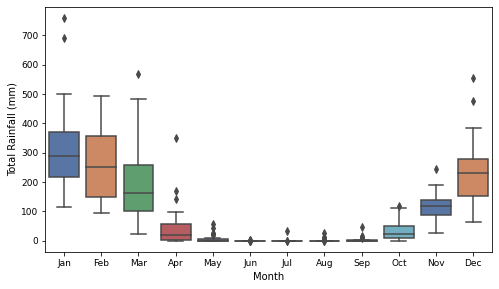

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\nt002_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\nt003.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['nt003.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
nt003 2012


<Figure size 720x432 with 0 Axes>

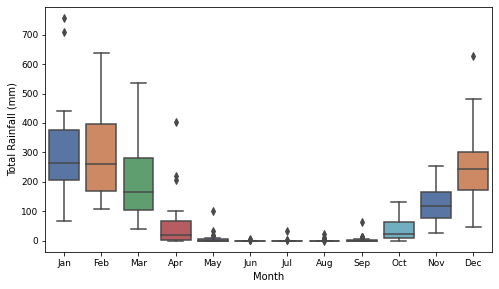

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\nt003_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\nt004.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['nt004.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
nt004 2012


<Figure size 720x432 with 0 Axes>

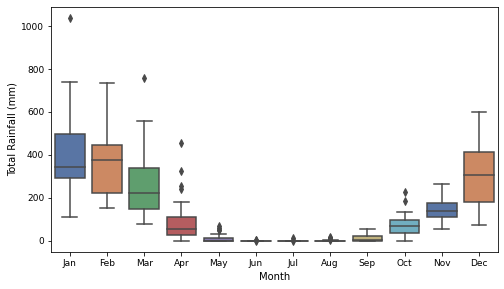

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\nt004_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntaarp0001.2016_1ha_mth_msum_zonal_stats.csv
flist:  ['ntaarp0001.2016', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntaarp0001 2016


<Figure size 720x432 with 0 Axes>

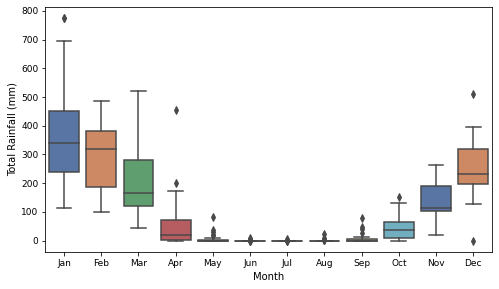

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntaarp0001_2016_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntaarp0002.2016_1ha_mth_msum_zonal_stats.csv
flist:  ['ntaarp0002.2016', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntaarp0002 2016


<Figure size 720x432 with 0 Axes>

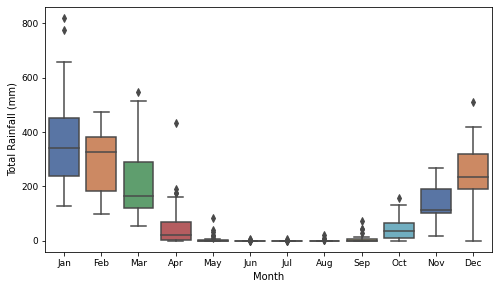

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntaarp0002_2016_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntaarp0003.2016_1ha_mth_msum_zonal_stats.csv
flist:  ['ntaarp0003.2016', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntaarp0003 2016


<Figure size 720x432 with 0 Axes>

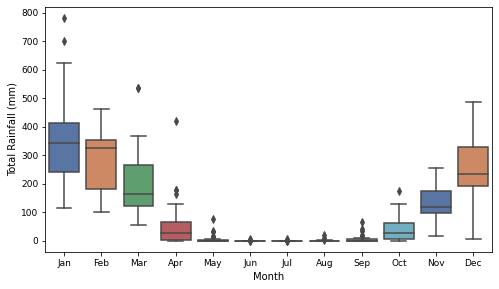

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntaarp0003_2016_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntadac0001.2013_1ha_mth_msum_zonal_stats.csv
flist:  ['ntadac0001.2013', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntadac0001 2013


<Figure size 720x432 with 0 Axes>

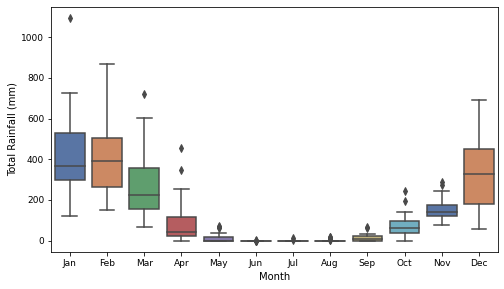

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntadac0001_2013_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntadac0002.2016_1ha_mth_msum_zonal_stats.csv
flist:  ['ntadac0002.2016', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntadac0002 2016


<Figure size 720x432 with 0 Axes>

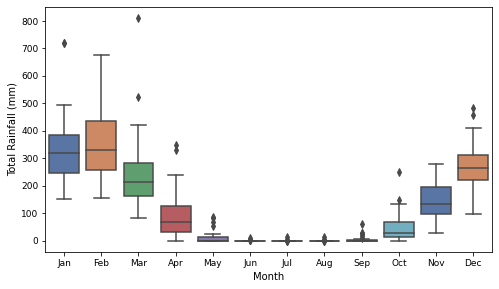

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntadac0002_2016_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0001.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0001.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0001 2012


<Figure size 720x432 with 0 Axes>

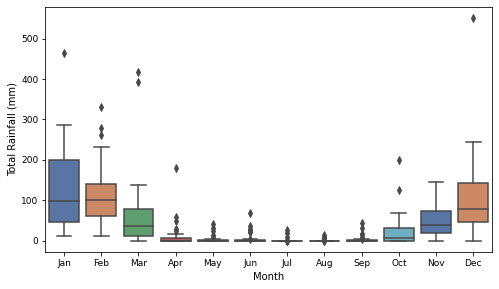

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0001_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0002.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0002.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0002 2012


<Figure size 720x432 with 0 Axes>

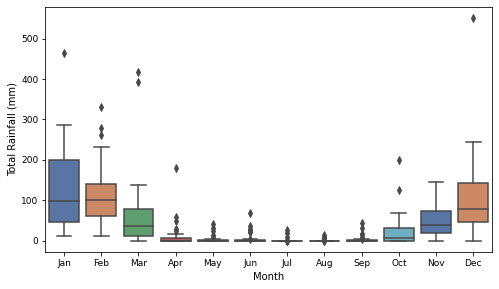

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0002_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0003.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0003.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0003 2012


<Figure size 720x432 with 0 Axes>

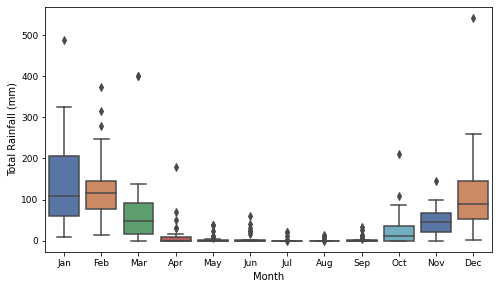

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0003_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0004.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0004.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0004 2012


<Figure size 720x432 with 0 Axes>

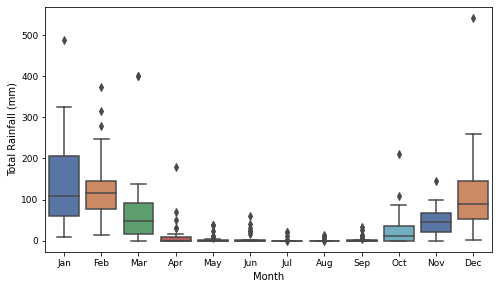

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0004_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0005.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0005.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0005 2012


<Figure size 720x432 with 0 Axes>

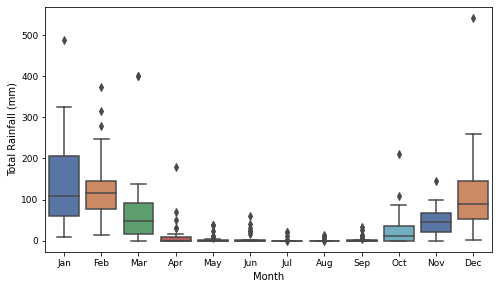

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0005_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0006.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0006.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0006 2012


<Figure size 720x432 with 0 Axes>

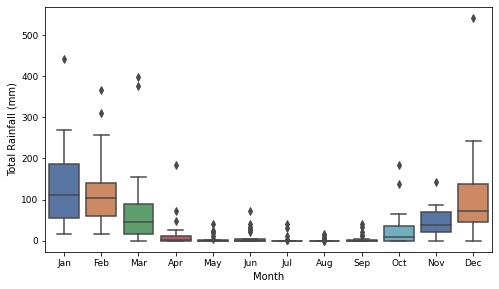

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0006_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0007.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0007.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0007 2012


<Figure size 720x432 with 0 Axes>

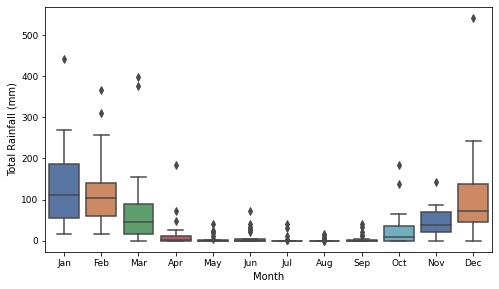

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0007_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0008.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0008.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0008 2012


<Figure size 720x432 with 0 Axes>

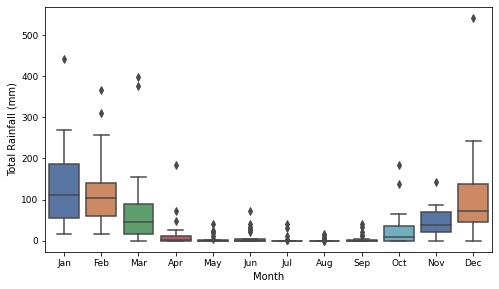

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0008_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0009.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0009.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0009 2012


<Figure size 720x432 with 0 Axes>

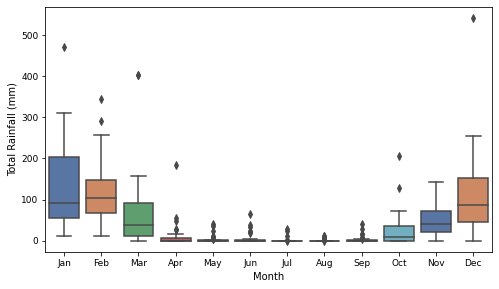

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0009_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0010.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0010.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0010 2012


<Figure size 720x432 with 0 Axes>

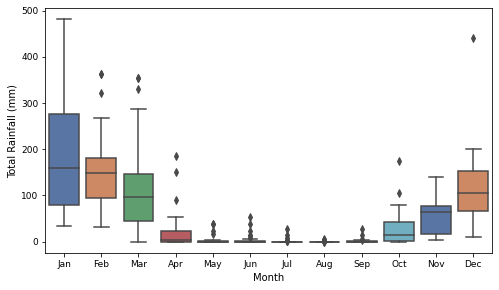

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0010_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0011.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0011.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0011 2012


<Figure size 720x432 with 0 Axes>

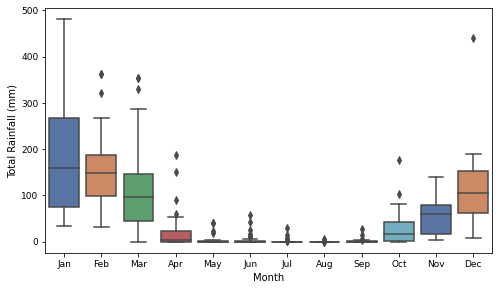

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0011_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0012.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0012.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0012 2012


<Figure size 720x432 with 0 Axes>

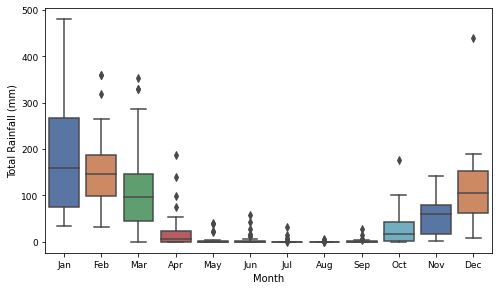

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0012_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0013.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0013.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0013 2012


<Figure size 720x432 with 0 Axes>

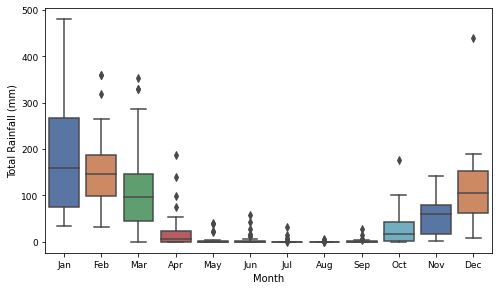

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0013_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0014.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0014.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0014 2012


<Figure size 720x432 with 0 Axes>

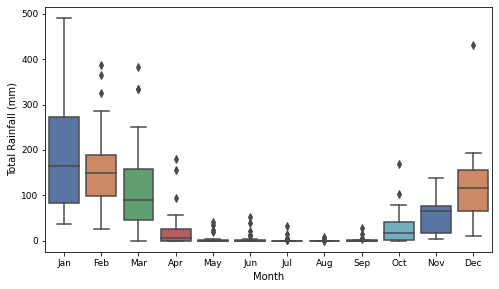

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0014_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0015.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0015.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0015 2012


<Figure size 720x432 with 0 Axes>

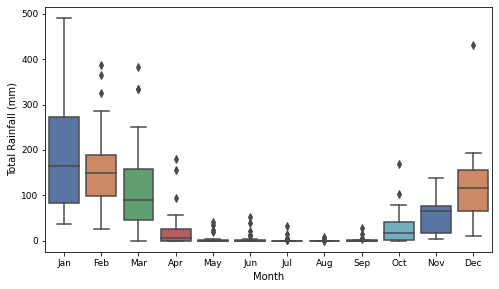

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0015_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0016.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0016.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0016 2012


<Figure size 720x432 with 0 Axes>

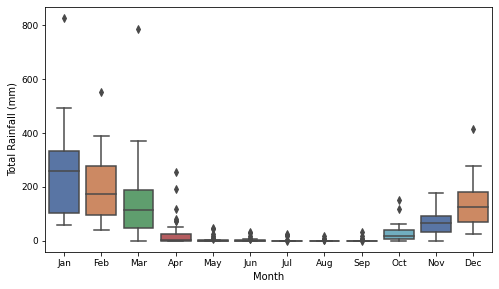

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0016_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0017.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0017.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0017 2012


<Figure size 720x432 with 0 Axes>

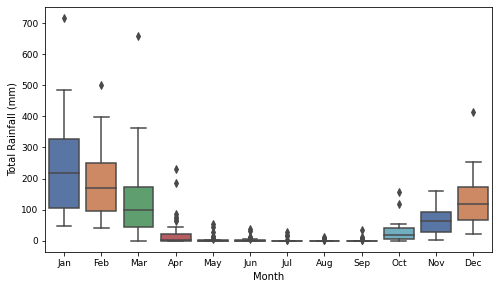

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0017_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0018.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0018.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0018 2012


<Figure size 720x432 with 0 Axes>

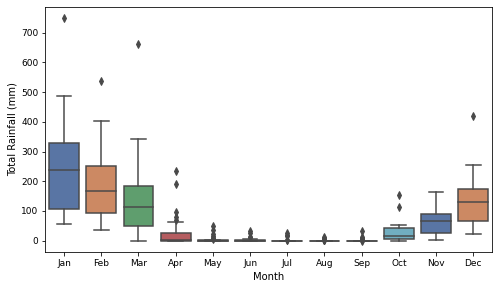

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0018_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0019.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0019.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0019 2012


<Figure size 720x432 with 0 Axes>

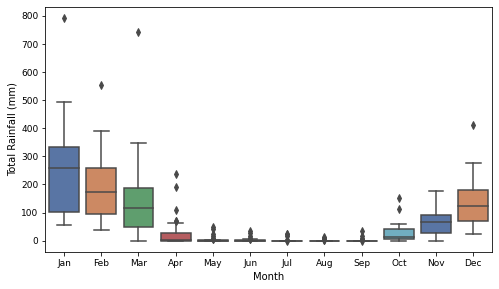

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0019_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0020.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0020.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0020 2012


<Figure size 720x432 with 0 Axes>

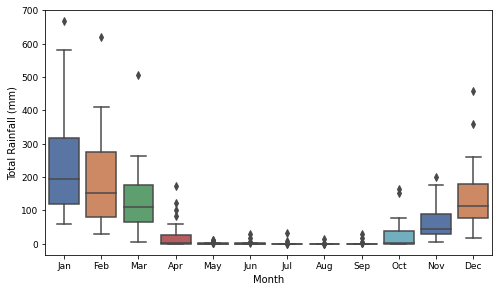

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0020_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0021.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0021.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0021 2012


<Figure size 720x432 with 0 Axes>

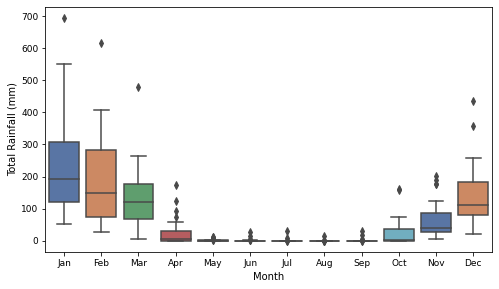

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0021_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0022.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0022.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0022 2012


<Figure size 720x432 with 0 Axes>

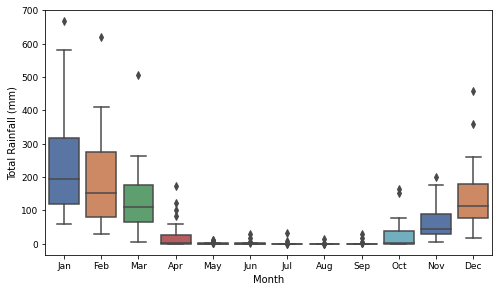

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0022_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0023.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0023.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0023 2012


<Figure size 720x432 with 0 Axes>

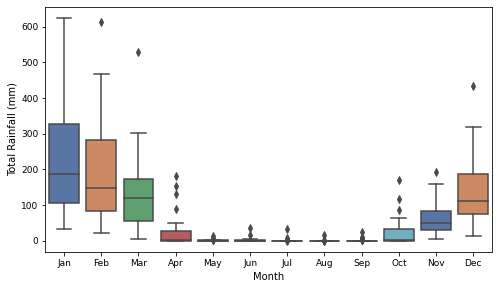

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0023_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0024.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0024.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0024 2012


<Figure size 720x432 with 0 Axes>

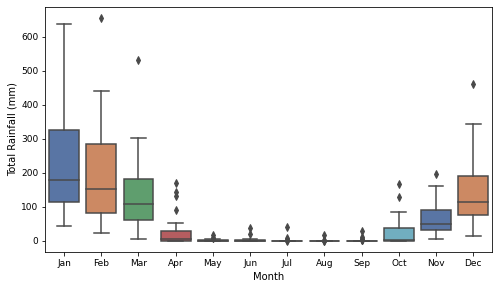

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0024_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0025.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0025.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0025 2012


<Figure size 720x432 with 0 Axes>

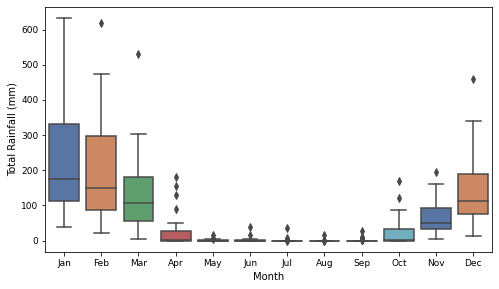

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0025_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0026.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0026.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0026 2012


<Figure size 720x432 with 0 Axes>

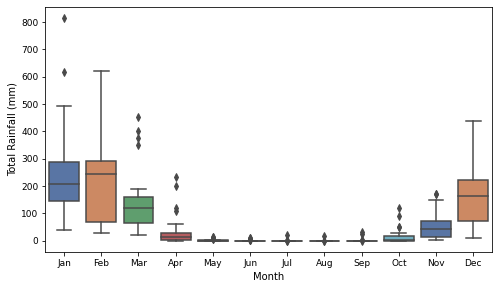

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0026_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0027.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0027.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0027 2012


<Figure size 720x432 with 0 Axes>

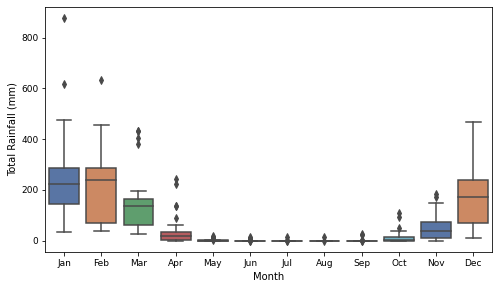

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0027_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0028.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0028.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0028 2012


<Figure size 720x432 with 0 Axes>

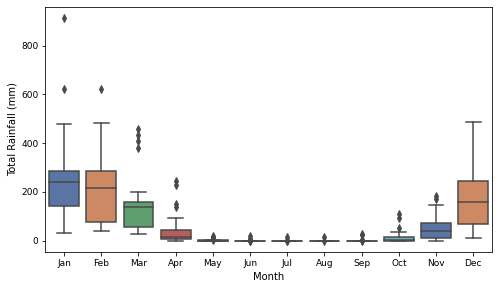

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0028_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0029.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0029.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0029 2012


<Figure size 720x432 with 0 Axes>

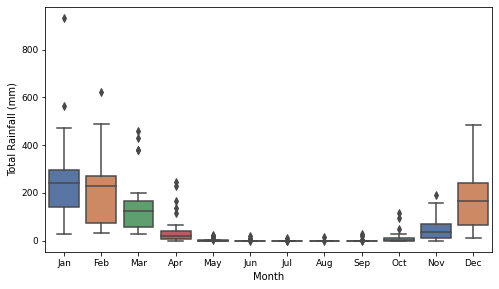

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0029_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0030.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0030.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0030 2012


<Figure size 720x432 with 0 Axes>

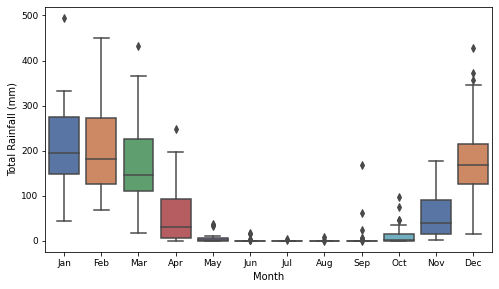

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0030_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0031.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0031.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0031 2012


<Figure size 720x432 with 0 Axes>

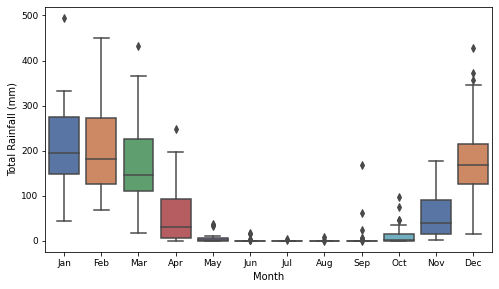

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0031_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0032.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0032.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0032 2012


<Figure size 720x432 with 0 Axes>

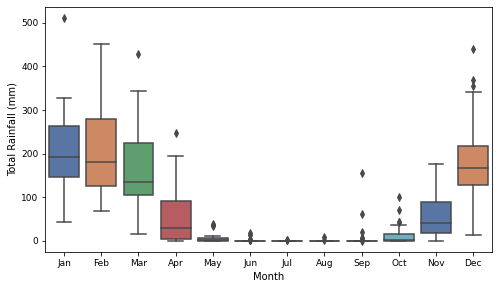

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0032_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0033.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0033.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0033 2012


<Figure size 720x432 with 0 Axes>

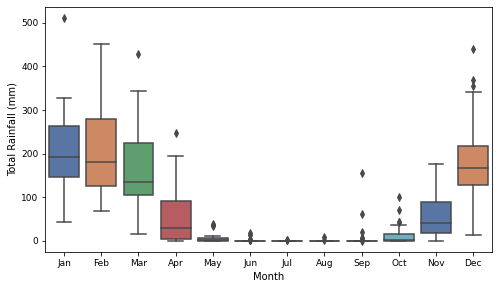

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0033_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0034.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0034.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0034 2012


<Figure size 720x432 with 0 Axes>

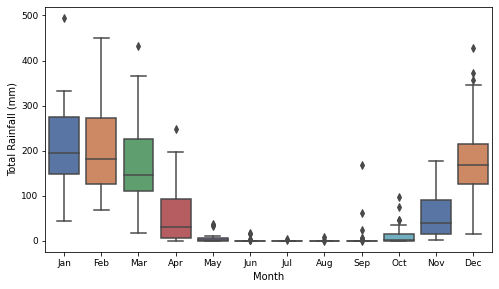

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0034_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0035.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0035.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0035 2012


<Figure size 720x432 with 0 Axes>

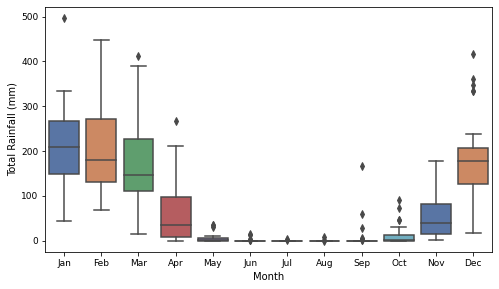

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0035_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0036.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0036.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0036 2012


<Figure size 720x432 with 0 Axes>

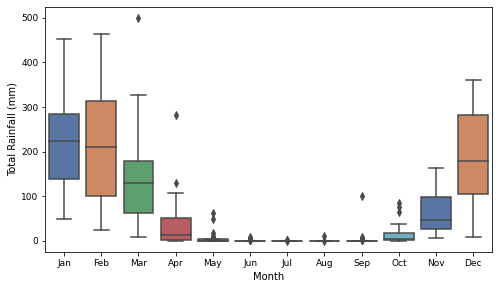

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0036_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0037.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0037.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0037 2012


<Figure size 720x432 with 0 Axes>

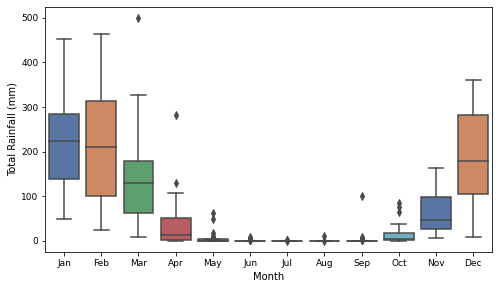

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0037_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0038.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0038.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0038 2012


<Figure size 720x432 with 0 Axes>

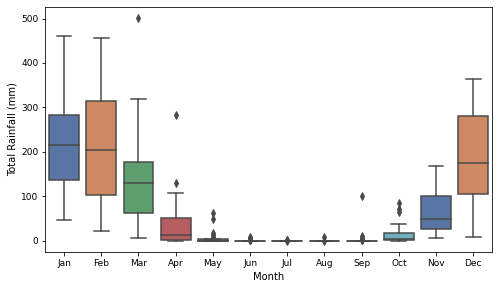

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0038_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0039.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0039.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0039 2012


<Figure size 720x432 with 0 Axes>

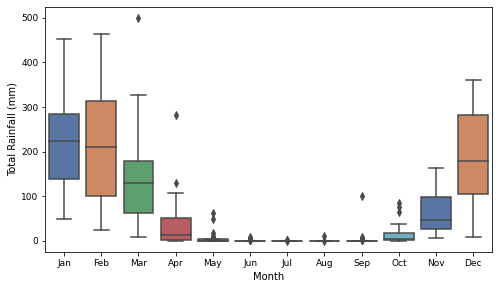

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0039_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0040.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0040.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0040 2012


<Figure size 720x432 with 0 Axes>

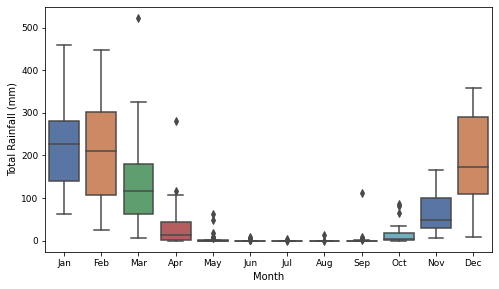

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0040_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0041.2016_1ha_mth_msum_zonal_stats.csv
flist:  ['ntagfu0041.2016', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntagfu0041 2016


<Figure size 720x432 with 0 Axes>

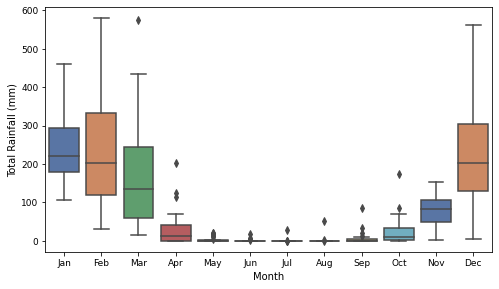

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntagfu0041_2016_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntamgd0001.2014_1ha_mth_msum_zonal_stats.csv
flist:  ['ntamgd0001.2014', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntamgd0001 2014


<Figure size 720x432 with 0 Axes>

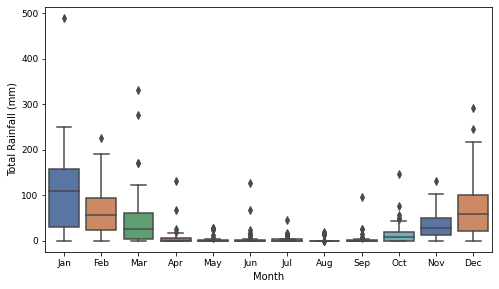

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntamgd0001_2014_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntamgd0002.2014_1ha_mth_msum_zonal_stats.csv
flist:  ['ntamgd0002.2014', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntamgd0002 2014


<Figure size 720x432 with 0 Axes>

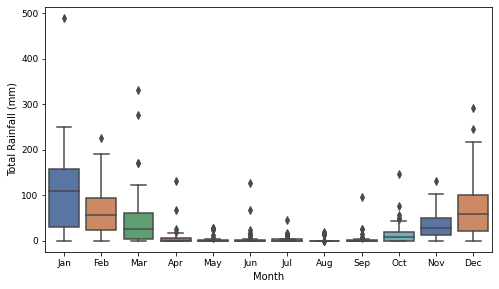

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntamgd0002_2014_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntamgd0003.2016_1ha_mth_msum_zonal_stats.csv
flist:  ['ntamgd0003.2016', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntamgd0003 2016


<Figure size 720x432 with 0 Axes>

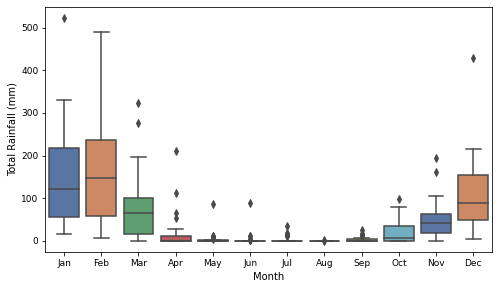

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntamgd0003_2016_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntamgd0004.2016_1ha_mth_msum_zonal_stats.csv
flist:  ['ntamgd0004.2016', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntamgd0004 2016


<Figure size 720x432 with 0 Axes>

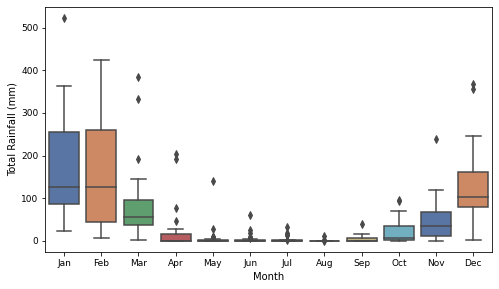

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntamgd0004_2016_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntamgd0005.2016_1ha_mth_msum_zonal_stats.csv
flist:  ['ntamgd0005.2016', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntamgd0005 2016


<Figure size 720x432 with 0 Axes>

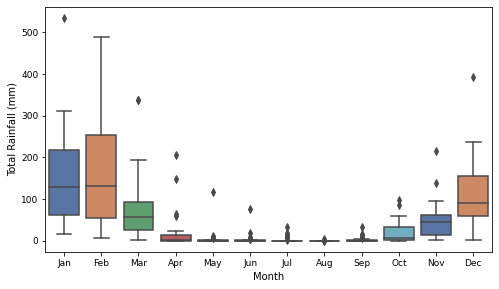

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntamgd0005_2016_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntapck0001.2016_1ha_mth_msum_zonal_stats.csv
flist:  ['ntapck0001.2016', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntapck0001 2016


<Figure size 720x432 with 0 Axes>

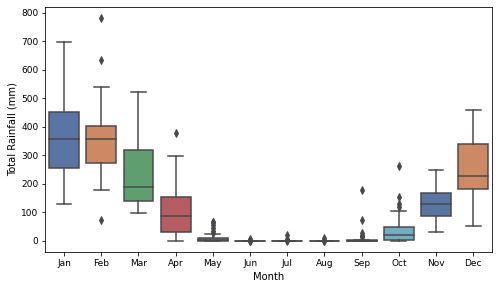

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntapck0001_2016_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntapck0002.2016_1ha_mth_msum_zonal_stats.csv
flist:  ['ntapck0002.2016', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntapck0002 2016


<Figure size 720x432 with 0 Axes>

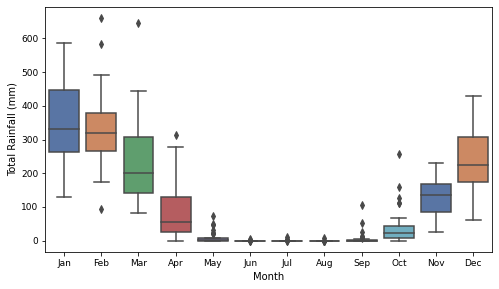

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntapck0002_2016_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntastu0001.2016_1ha_mth_msum_zonal_stats.csv
flist:  ['ntastu0001.2016', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntastu0001 2016


<Figure size 720x432 with 0 Axes>

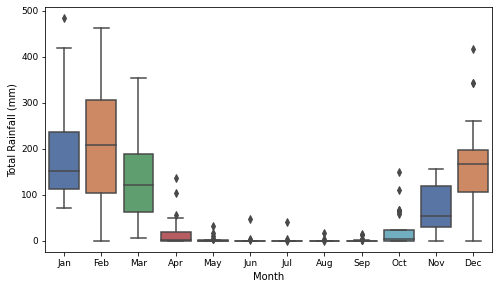

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntastu0001_2016_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntastu0002.2016_1ha_mth_msum_zonal_stats.csv
flist:  ['ntastu0002.2016', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntastu0002 2016


<Figure size 720x432 with 0 Axes>

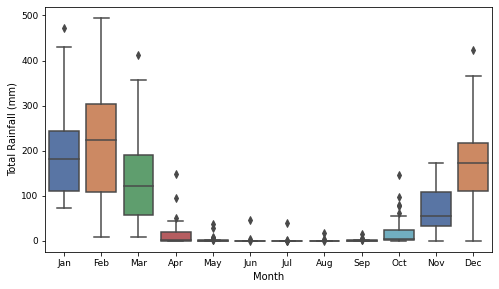

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntastu0002_2016_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntastu0003.2016_1ha_mth_msum_zonal_stats.csv
flist:  ['ntastu0003.2016', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntastu0003 2016


<Figure size 720x432 with 0 Axes>

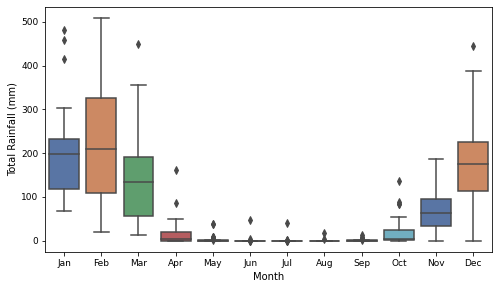

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntastu0003_2016_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntastu0004.2016_1ha_mth_msum_zonal_stats.csv
flist:  ['ntastu0004.2016', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntastu0004 2016


<Figure size 720x432 with 0 Axes>

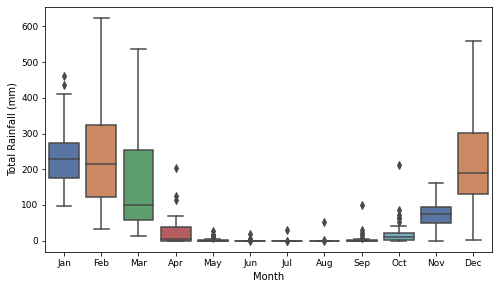

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntastu0004_2016_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntastu0005.2016_1ha_mth_msum_zonal_stats.csv
flist:  ['ntastu0005.2016', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
ntastu0005 2016


<Figure size 720x432 with 0 Axes>

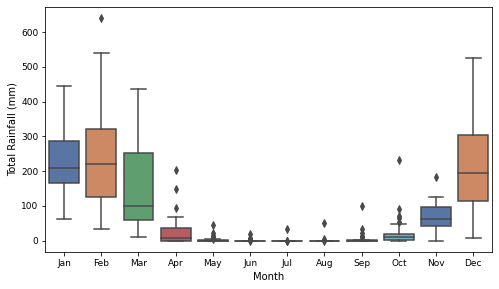

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\ntastu0005_2016_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\nttdab0001.2014_1ha_mth_msum_zonal_stats.csv
flist:  ['nttdab0001.2014', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
nttdab0001 2014


<Figure size 720x432 with 0 Axes>

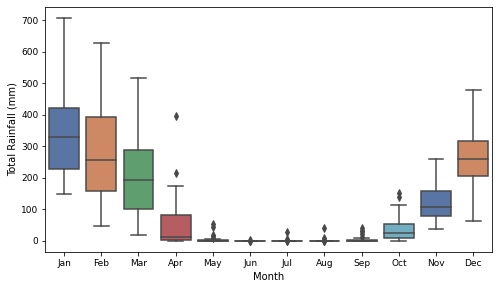

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\nttdab0001_2014_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\nttdac0001.2014_1ha_mth_msum_zonal_stats.csv
flist:  ['nttdac0001.2014', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
nttdac0001 2014


<Figure size 720x432 with 0 Axes>

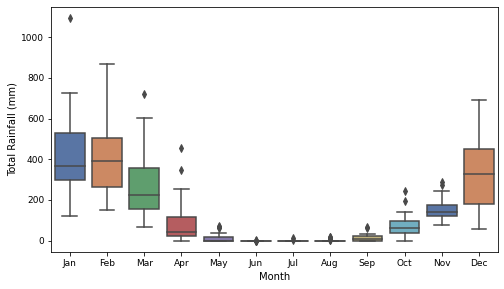

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\nttdac0001_2014_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\nttmgd0001.2014_1ha_mth_msum_zonal_stats.csv
flist:  ['nttmgd0001.2014', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
nttmgd0001 2014


<Figure size 720x432 with 0 Axes>

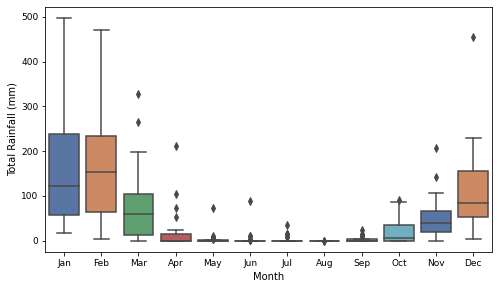

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\nttmgd0001_2014_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\nttpck0001.2014_1ha_mth_msum_zonal_stats.csv
flist:  ['nttpck0001.2014', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
nttpck0001 2014


<Figure size 720x432 with 0 Axes>

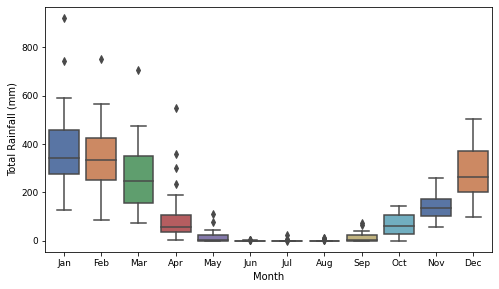

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\nttpck0001_2014_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\nttstu0001.2014_1ha_mth_msum_zonal_stats.csv
flist:  ['nttstu0001.2014', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
nttstu0001 2014


<Figure size 720x432 with 0 Axes>

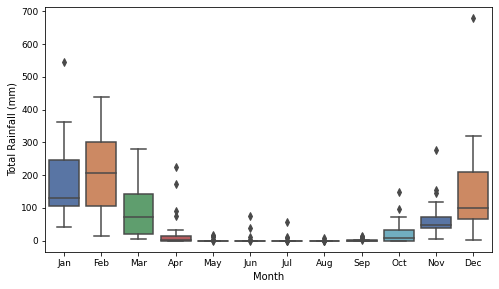

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\nttstu0001_2014_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site01.2023_1ha_mth_msum_zonal_stats.csv
flist:  ['site01.2023', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
site01 2023


<Figure size 720x432 with 0 Axes>

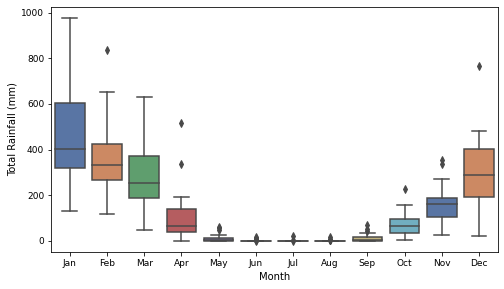

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\site01_2023_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site02.2023_1ha_mth_msum_zonal_stats.csv
flist:  ['site02.2023', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
site02 2023


<Figure size 720x432 with 0 Axes>

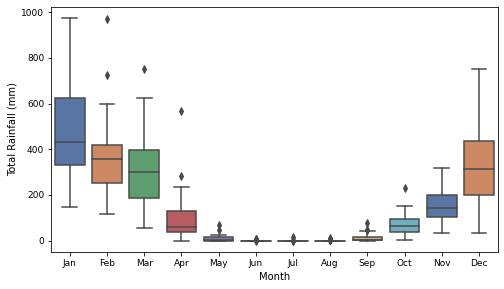

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\site02_2023_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site03.2023_1ha_mth_msum_zonal_stats.csv
flist:  ['site03.2023', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
site03 2023


<Figure size 720x432 with 0 Axes>

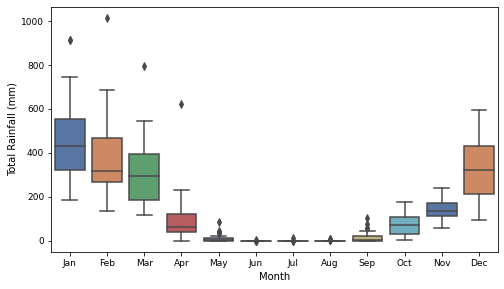

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\site03_2023_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site04.2023_1ha_mth_msum_zonal_stats.csv
flist:  ['site04.2023', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
site04 2023


<Figure size 720x432 with 0 Axes>

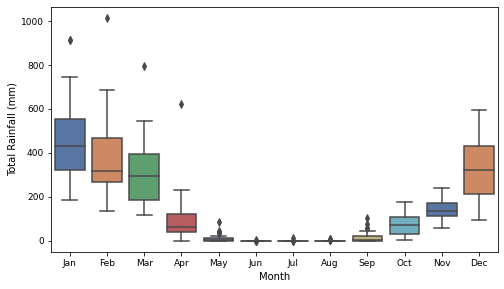

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\site04_2023_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site05.2023_1ha_mth_msum_zonal_stats.csv
flist:  ['site05.2023', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
site05 2023


<Figure size 720x432 with 0 Axes>

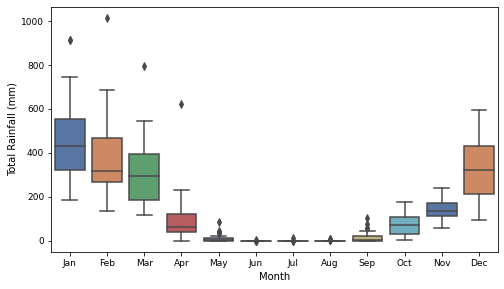

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\site05_2023_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site06.2023_1ha_mth_msum_zonal_stats.csv
flist:  ['site06.2023', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
site06 2023


<Figure size 720x432 with 0 Axes>

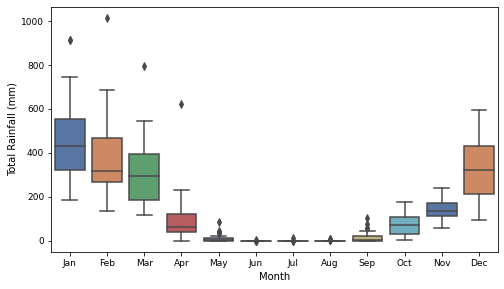

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\site06_2023_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site07.2023_1ha_mth_msum_zonal_stats.csv
flist:  ['site07.2023', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
site07 2023


<Figure size 720x432 with 0 Axes>

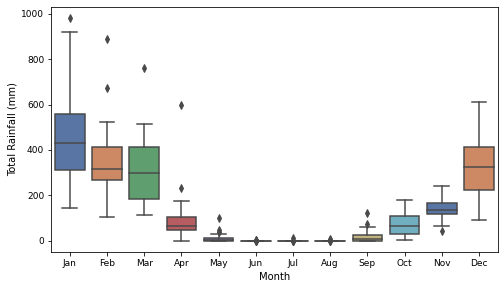

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\site07_2023_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site08.2023_1ha_mth_msum_zonal_stats.csv
flist:  ['site08.2023', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
site08 2023


<Figure size 720x432 with 0 Axes>

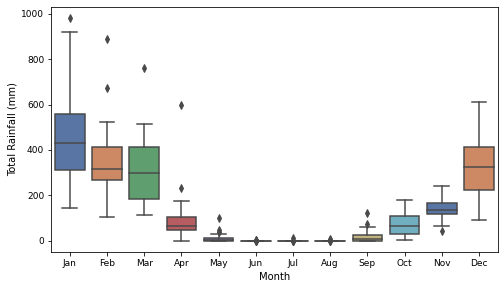

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\site08_2023_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site09.2023_1ha_mth_msum_zonal_stats.csv
flist:  ['site09.2023', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
site09 2023


<Figure size 720x432 with 0 Axes>

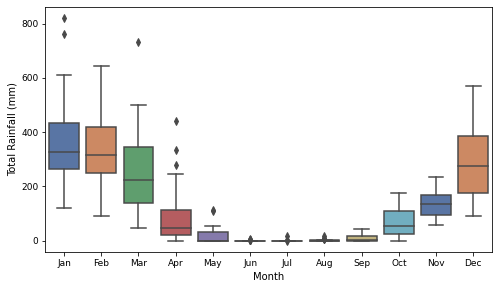

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\site09_2023_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site10.2023_1ha_mth_msum_zonal_stats.csv
flist:  ['site10.2023', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
site10 2023


<Figure size 720x432 with 0 Axes>

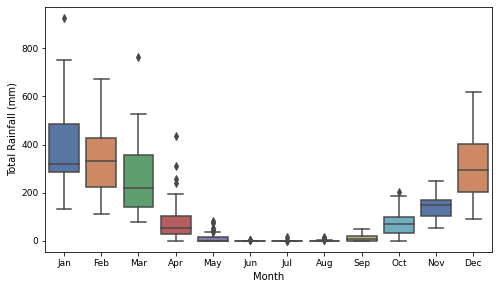

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\site10_2023_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site11.2023_1ha_mth_msum_zonal_stats.csv
flist:  ['site11.2023', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
site11 2023


<Figure size 720x432 with 0 Axes>

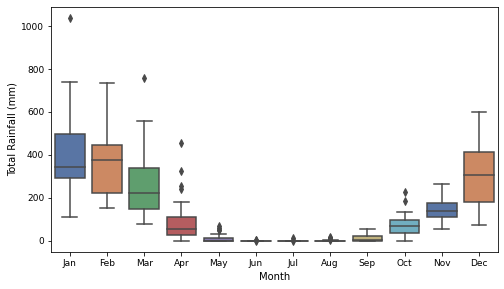

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\site11_2023_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site12.2023_1ha_mth_msum_zonal_stats.csv
flist:  ['site12.2023', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
site12 2023


<Figure size 720x432 with 0 Axes>

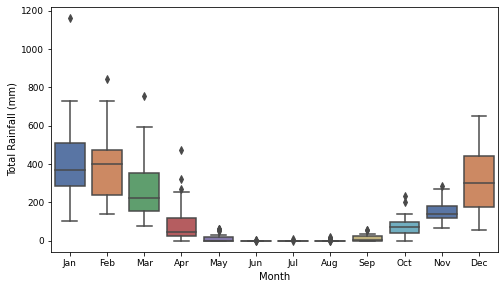

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\site12_2023_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site13.2023_1ha_mth_msum_zonal_stats.csv
flist:  ['site13.2023', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
site13 2023


<Figure size 720x432 with 0 Axes>

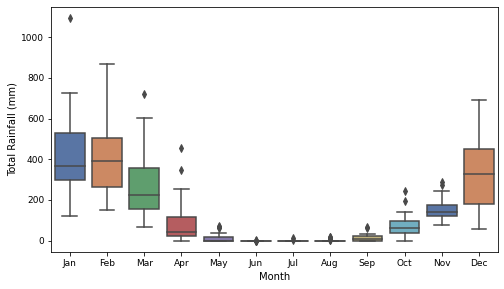

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\site13_2023_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site14.2023_1ha_mth_msum_zonal_stats.csv
flist:  ['site14.2023', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
site14 2023


<Figure size 720x432 with 0 Axes>

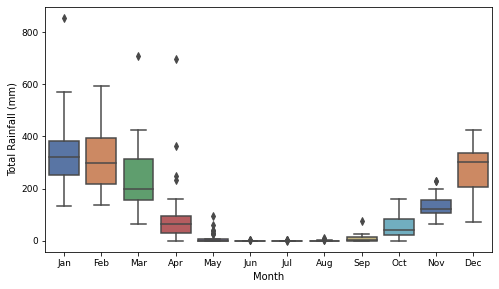

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\site14_2023_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site15.2023_1ha_mth_msum_zonal_stats.csv
flist:  ['site15.2023', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
site15 2023


<Figure size 720x432 with 0 Axes>

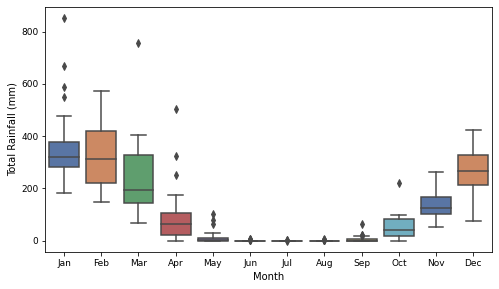

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\site15_2023_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site16.2023_1ha_mth_msum_zonal_stats.csv
flist:  ['site16.2023', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
site16 2023


<Figure size 720x432 with 0 Axes>

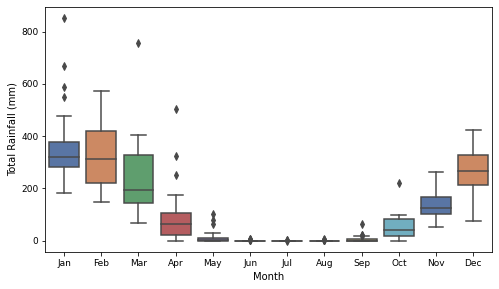

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\site16_2023_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site17.2023_1ha_mth_msum_zonal_stats.csv
flist:  ['site17.2023', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
site17 2023


<Figure size 720x432 with 0 Axes>

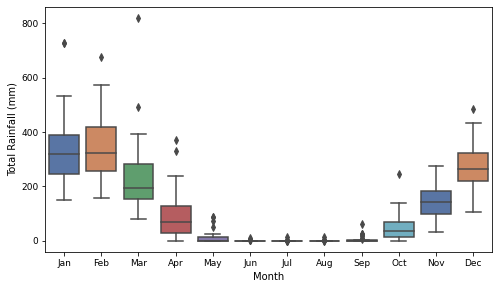

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\site17_2023_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site18.2023_1ha_mth_msum_zonal_stats.csv
flist:  ['site18.2023', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
site18 2023


<Figure size 720x432 with 0 Axes>

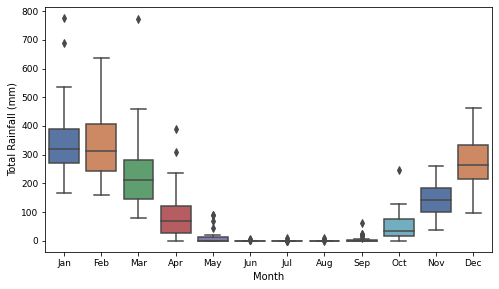

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\site18_2023_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site20.2023_1ha_mth_msum_zonal_stats.csv
flist:  ['site20.2023', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
site20 2023


<Figure size 720x432 with 0 Axes>

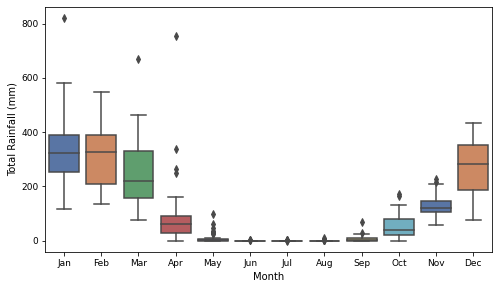

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\site20_2023_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site21.2023_1ha_mth_msum_zonal_stats.csv
flist:  ['site21.2023', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
site21 2023


<Figure size 720x432 with 0 Axes>

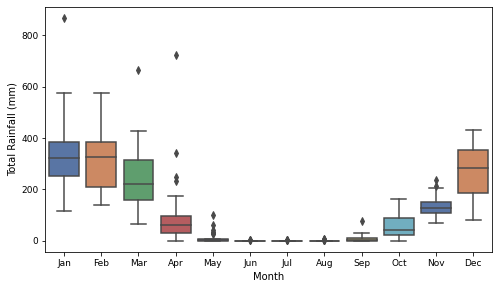

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\site21_2023_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site22.2023_1ha_mth_msum_zonal_stats.csv
flist:  ['site22.2023', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
site22 2023


<Figure size 720x432 with 0 Axes>

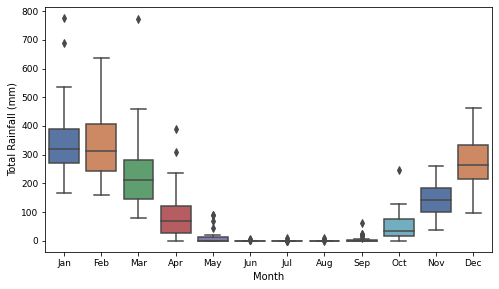

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\site22_2023_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site23.2023_1ha_mth_msum_zonal_stats.csv
flist:  ['site23.2023', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
site23 2023


<Figure size 720x432 with 0 Axes>

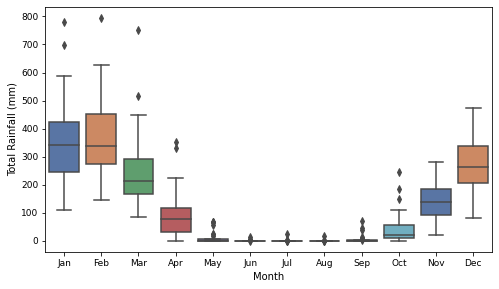

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\site23_2023_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\umb07.2013_1ha_mth_msum_zonal_stats.csv
flist:  ['umb07.2013', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
umb07 2013


<Figure size 720x432 with 0 Axes>

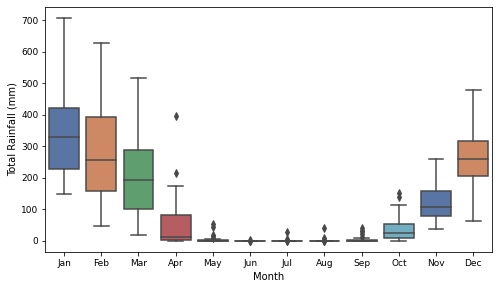

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\umb07_2013_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd16.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['vrd16.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
vrd16 2012


<Figure size 720x432 with 0 Axes>

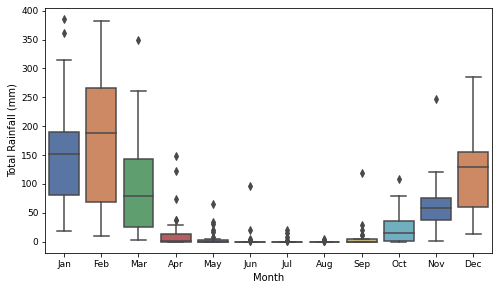

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\vrd16_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd17.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['vrd17.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
vrd17 2012


<Figure size 720x432 with 0 Axes>

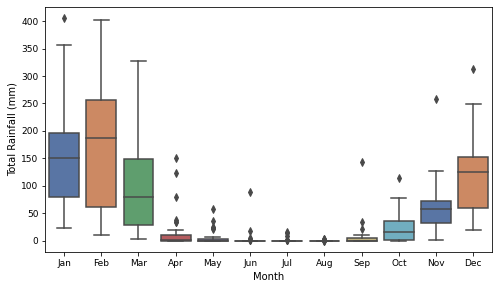

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\vrd17_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd20.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['vrd20.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
vrd20 2012


<Figure size 720x432 with 0 Axes>

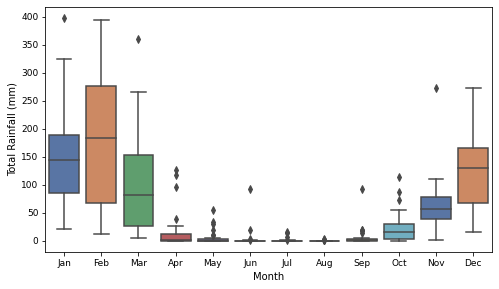

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\vrd20_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd22.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['vrd22.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
vrd22 2012


<Figure size 720x432 with 0 Axes>

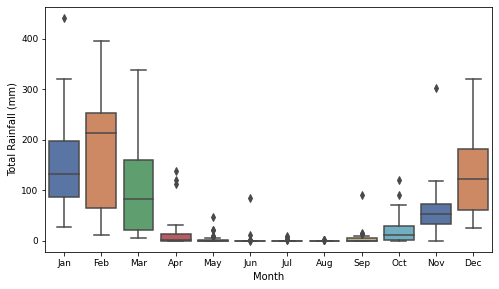

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\vrd22_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd23.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['vrd23.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
vrd23 2012


<Figure size 720x432 with 0 Axes>

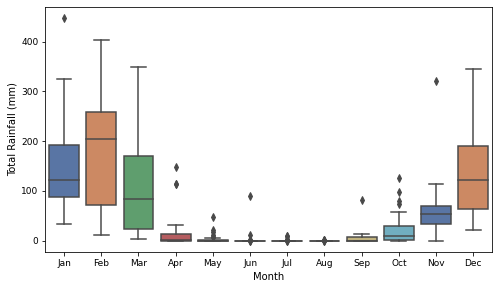

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\vrd23_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd24.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['vrd24.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
vrd24 2012


<Figure size 720x432 with 0 Axes>

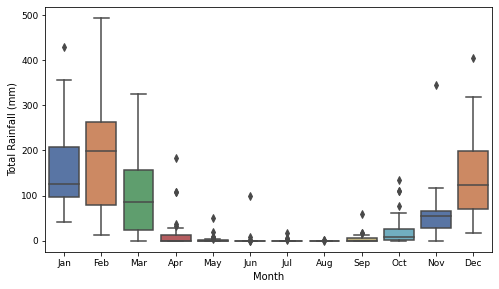

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\vrd24_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd25.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['vrd25.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
vrd25 2012


<Figure size 720x432 with 0 Axes>

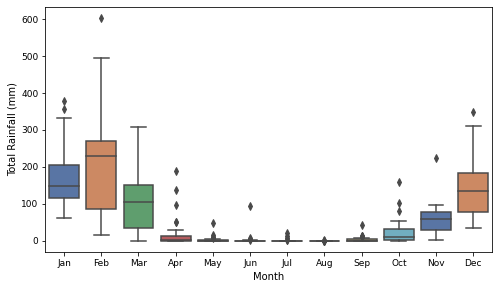

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\vrd25_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd26.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['vrd26.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
vrd26 2012


<Figure size 720x432 with 0 Axes>

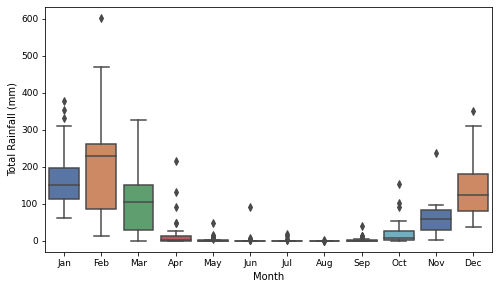

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\vrd26_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd29.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['vrd29.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
vrd29 2012


<Figure size 720x432 with 0 Axes>

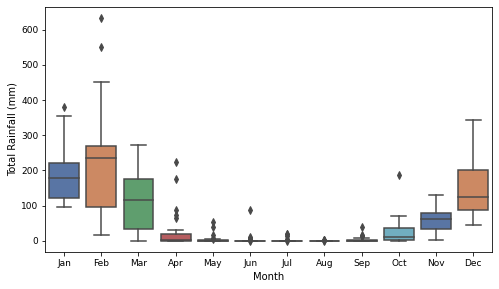

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\vrd29_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd30.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['vrd30.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
vrd30 2012


<Figure size 720x432 with 0 Axes>

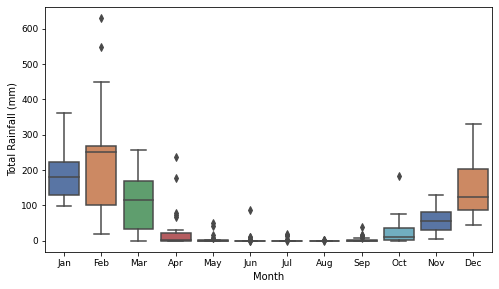

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\vrd30_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd31.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['vrd31.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
vrd31 2012


<Figure size 720x432 with 0 Axes>

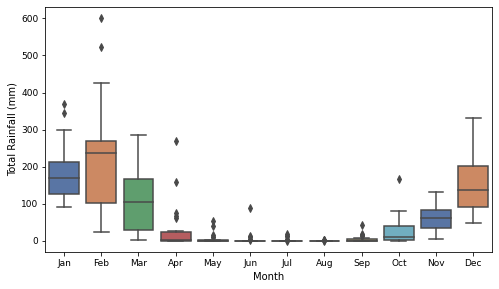

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\vrd31_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd32.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['vrd32.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
vrd32 2012


<Figure size 720x432 with 0 Axes>

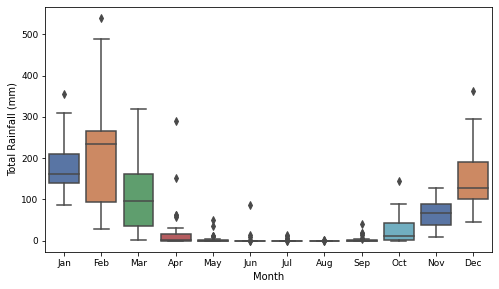

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\vrd32_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd33.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['vrd33.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
vrd33 2012


<Figure size 720x432 with 0 Axes>

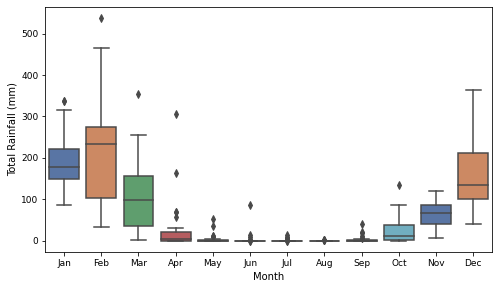

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\vrd33_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd34.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['vrd34.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
vrd34 2012


<Figure size 720x432 with 0 Axes>

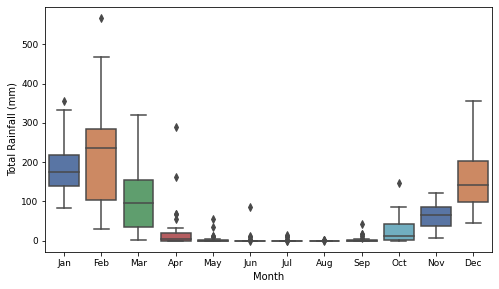

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\vrd34_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd35.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['vrd35.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
vrd35 2012


<Figure size 720x432 with 0 Axes>

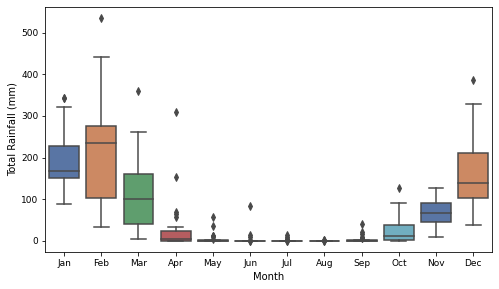

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\vrd35_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd36.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['vrd36.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
vrd36 2012


<Figure size 720x432 with 0 Axes>

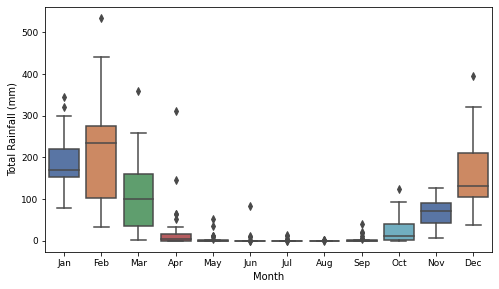

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\vrd36_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd37.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['vrd37.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
vrd37 2012


<Figure size 720x432 with 0 Axes>

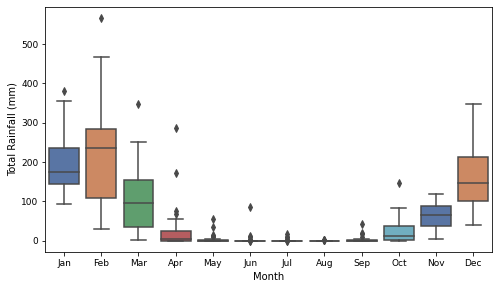

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\vrd37_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\wedo01.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['wedo01.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
wedo01 2012


<Figure size 720x432 with 0 Axes>

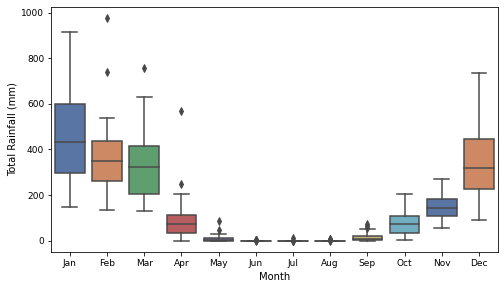

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\wedo01_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\wedo03.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['wedo03.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
wedo03 2012


<Figure size 720x432 with 0 Axes>

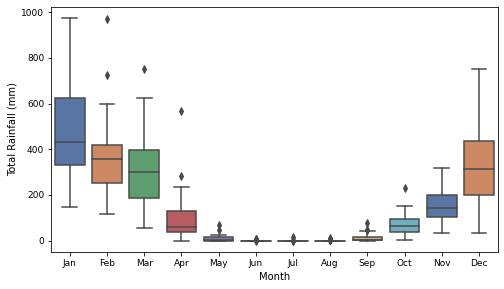

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\wedo03_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\wh02.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['wh02.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
wh02 2012


<Figure size 720x432 with 0 Axes>

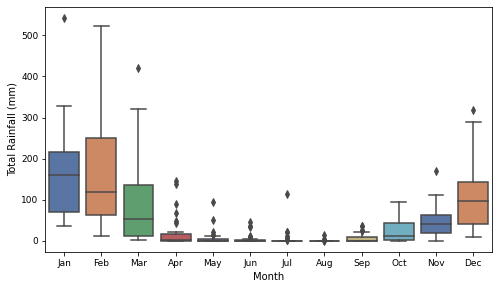

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\wh02_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\wh03.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['wh03.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
wh03 2012


<Figure size 720x432 with 0 Axes>

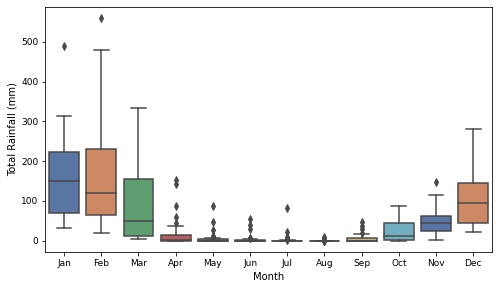

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\wh03_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\wh04.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['wh04.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
wh04 2012


<Figure size 720x432 with 0 Axes>

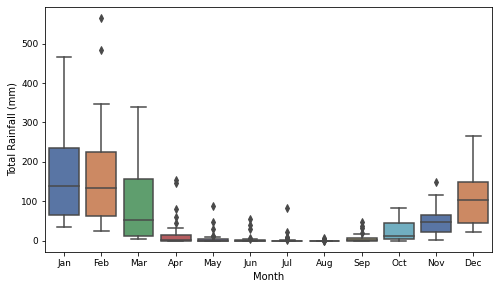

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\wh04_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\wh05.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['wh05.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
wh05 2012


<Figure size 720x432 with 0 Axes>

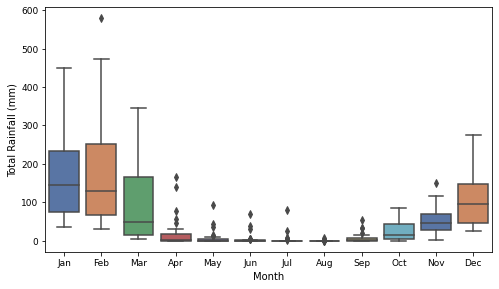

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\wh05_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\wh06.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['wh06.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
wh06 2012


<Figure size 720x432 with 0 Axes>

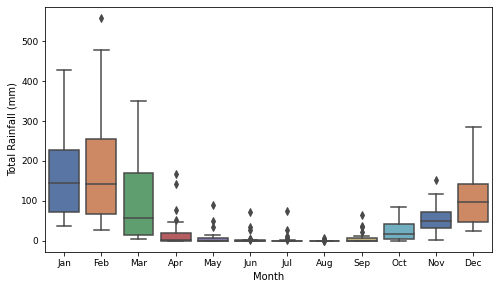

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\wh06_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\wh07.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['wh07.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
wh07 2012


<Figure size 720x432 with 0 Axes>

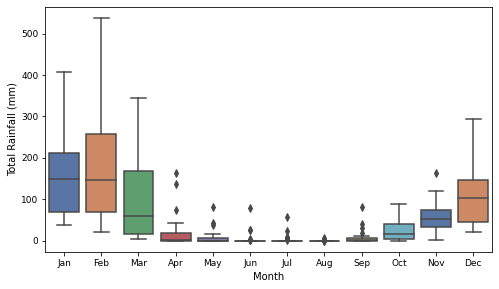

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\wh07_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\wh08.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['wh08.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
wh08 2012


<Figure size 720x432 with 0 Axes>

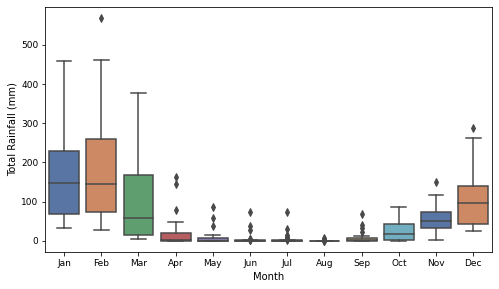

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\wh08_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\wh09.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['wh09.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
wh09 2012


<Figure size 720x432 with 0 Axes>

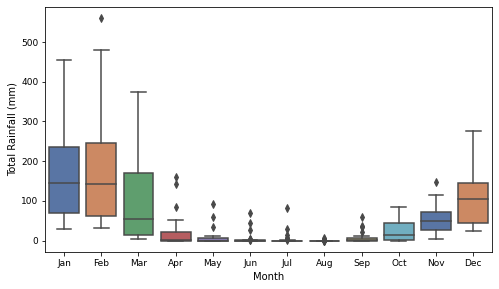

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\wh09_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\wh13.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['wh13.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
wh13 2012


<Figure size 720x432 with 0 Axes>

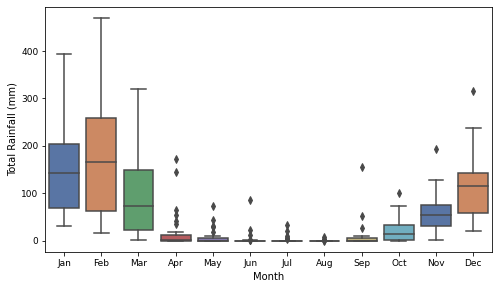

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\wh13_2012_daily_rain_total_box.jpg
----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\wh15.2012_1ha_mth_msum_zonal_stats.csv
flist:  ['wh15.2012', '1ha', 'mth', 'msum', 'zonal', 'stats.csv']
wh15 2012


<Figure size 720x432 with 0 Axes>

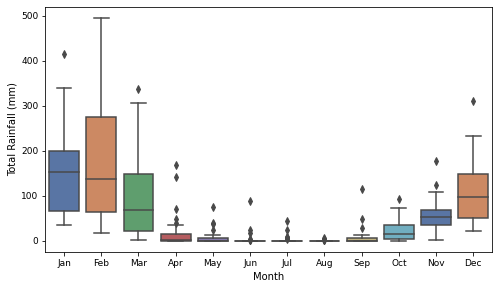

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\box_plots\total\wh15_2012_daily_rain_total_box.jpg


In [11]:


# Function to change the day of the date
def change_day(date, new_day):
    return date + pd.DateOffset(day=new_day)

for f in glob(os.path.join(dir_, "*.csv")):
    csv_file = f
    print("-"*100)
    print("working for: ", f)
    
    df = pd.read_csv(csv_file)
    df.dropna(inplace=True)
    df1 = pd.read_csv(csv_file)
    df1.dropna(inplace=True)
    
    # extract name and site year
    _, f = os.path.split(csv_file)
    flist = f.split("_")
    print("flist: ", flist)
    site_name, field_year = flist[0].split(".")
    print(site_name, field_year)
    #todo may change to %Y%m%d
    df['date'] = pd.to_datetime(df['im_date'], format='%Y%m')
    df['day'] = 15
    
    # Apply the function to the DataFrame
    df['new_date'] = df.apply(lambda row: change_day(row['date'], row['day']), axis=1)
    # Extract month from new_date
    df['month'] = df['new_date'].dt.month
    df['year'] = df['new_date'].dt.year
    
    # Filter data to include at most 30 years
    start_year = df['year'].min()
    df = df[df['year'] <= start_year + 30]


    
#     # ------------------------------------------ Box Plot -----------------------------------------------
        
 # Mapping month numbers to month names
    month_map = {
        1: 'Jan', 2: 'Feb', 3: 'Mar', 4: 'Apr', 5: 'May', 6: 'Jun',
        7: 'Jul', 8: 'Aug', 9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Dec'
    }
    df['month_name'] = df['month'].map(month_map)
    
    # capitalize names
    cap_site_name = site_name.upper()
    capitalized_str_type = str_type.capitalize()
    
    
    # Count the number of unique years
    unique_years = df['year'].nunique()

    # Plotting
    plt.figure(figsize=(10, 6))
    plt.figure(figsize=(8, 4.5))
    sns.boxplot(x='month_name', y='mean', data=df, order=list(month_map.values()), palette='deep')
    #plt.title(f'{cap_site_name} Total Monthly {capitalized_str_type} (Data from {unique_years-1} Year{"s" if unique_years > 1 else ""})')
    plt.xlabel('Month')
    #capitalized_str_type = str_type.capitalize()
    #plt.ylabel(f'{str_type} {unit}')
    plt.ylabel(f'Total {str_type.capitalize()} ({unit})')
    
    box_out = os.path.join(export_box, f"{site_name}_{field_year}_{d_type}_total_box.jpg")
    plt.savefig(box_out)
    
    plt.show()
    print(f"Exported to: {box_out}")
    

# Time Trace

----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\agb02.2012_1ha_mth_msum_zonal_stats.csv
agb02 2012
Event dates: ['2012-07-14T00:00:00.000000000']


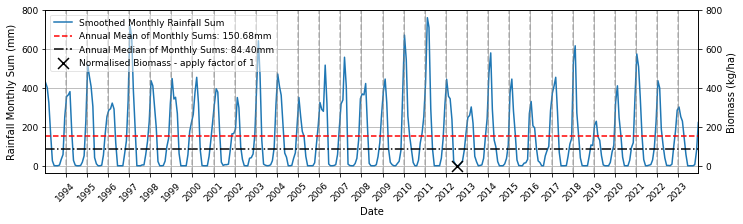

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\agb02_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\amg01.2012_1ha_mth_msum_zonal_stats.csv
amg01 2012
Event dates: ['2012-06-19T00:00:00.000000000']


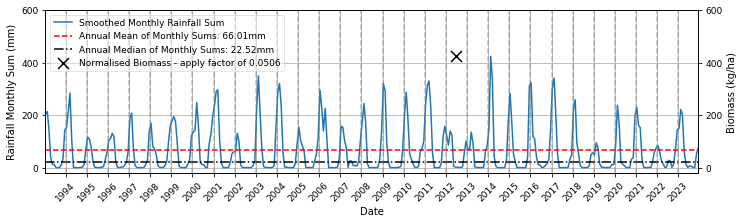

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\amg01_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\amg03.2012_1ha_mth_msum_zonal_stats.csv
amg03 2012
Event dates: ['2012-06-20T00:00:00.000000000']


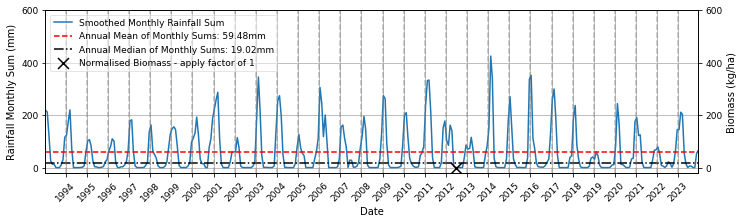

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\amg03_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\amg05.2012_1ha_mth_msum_zonal_stats.csv
amg05 2012
Event dates: ['2012-06-21T00:00:00.000000000']


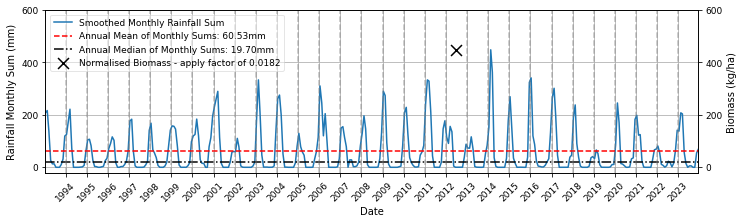

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\amg05_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\amg06.2012_1ha_mth_msum_zonal_stats.csv
amg06 2012
Event dates: ['2012-06-21T00:00:00.000000000']


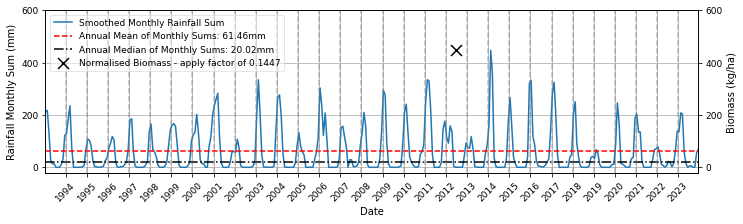

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\amg06_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\amg08.2012_1ha_mth_msum_zonal_stats.csv
amg08 2012
Event dates: ['2012-06-22T00:00:00.000000000']


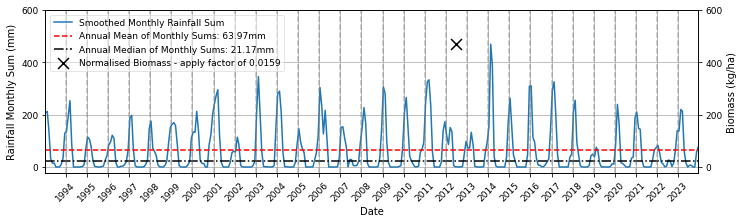

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\amg08_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\amg10.2012_1ha_mth_msum_zonal_stats.csv
amg10 2012
Event dates: ['2012-06-22T00:00:00.000000000']


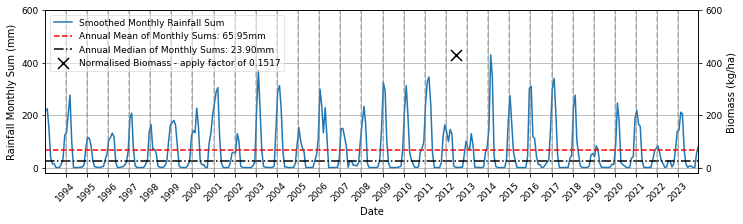

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\amg10_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ant01.2012_1ha_mth_msum_zonal_stats.csv
ant01 2012
Event dates: ['2012-06-23T00:00:00.000000000']


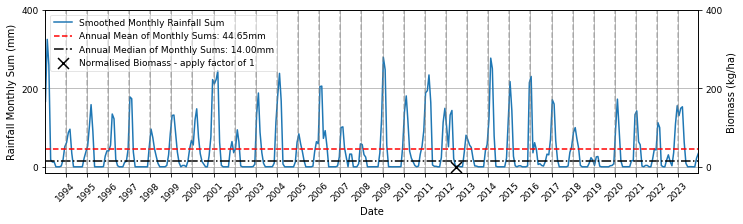

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ant01_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ant02.2012_1ha_mth_msum_zonal_stats.csv
ant02 2012
Event dates: ['2012-06-24T00:00:00.000000000']


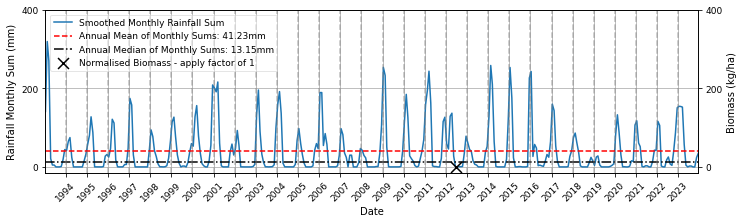

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ant02_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ant03.2012_1ha_mth_msum_zonal_stats.csv
ant03 2012
Event dates: ['2012-06-24T00:00:00.000000000']


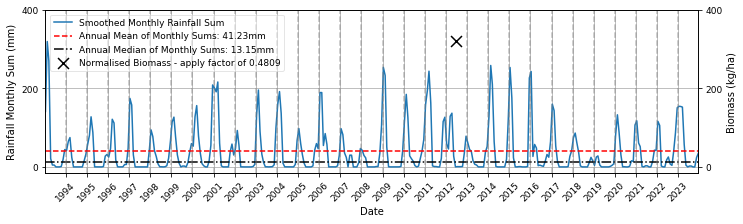

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ant03_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ant04.2012_1ha_mth_msum_zonal_stats.csv
ant04 2012
Event dates: ['2012-06-24T00:00:00.000000000']


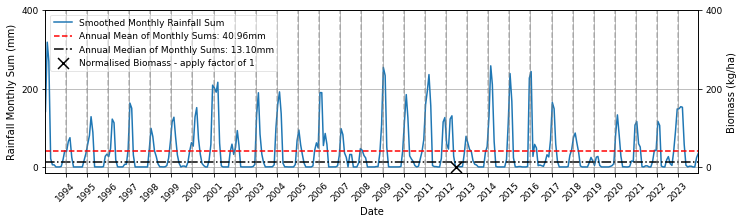

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ant04_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ant06.2012_1ha_mth_msum_zonal_stats.csv
ant06 2012
Event dates: ['2012-06-25T00:00:00.000000000']


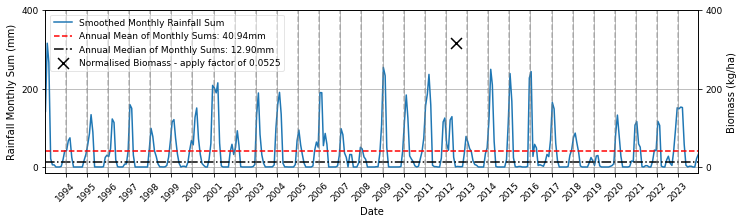

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ant06_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ant07.2012_1ha_mth_msum_zonal_stats.csv
ant07 2012
Event dates: ['2012-06-26T00:00:00.000000000']


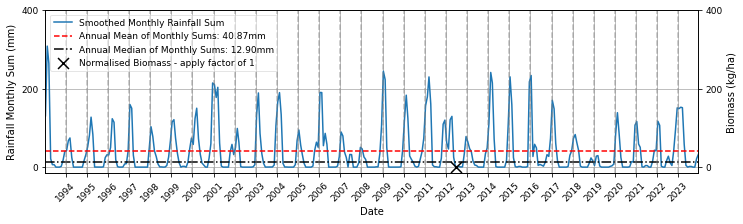

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ant07_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ant09.2012_1ha_mth_msum_zonal_stats.csv
ant09 2012
Event dates: ['2012-06-26T00:00:00.000000000']


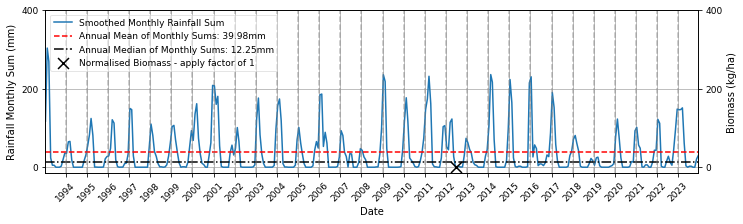

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ant09_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\antgr01.2012_1ha_mth_msum_zonal_stats.csv
antgr01 2012
Event dates: ['2012-06-26T00:00:00.000000000']


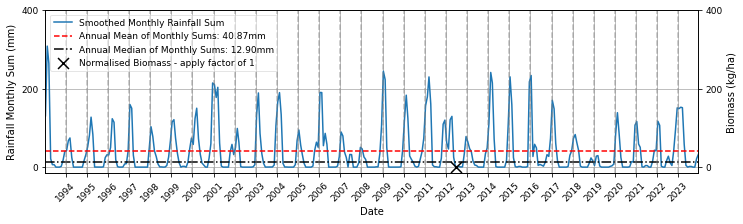

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\antgr01_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\auv01.2012_1ha_mth_msum_zonal_stats.csv
auv01 2012
Event dates: ['2012-10-09T00:00:00.000000000']


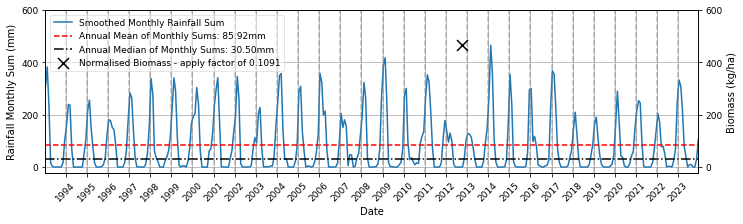

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\auv01_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\auv02.2012_1ha_mth_msum_zonal_stats.csv
auv02 2012
Event dates: ['2012-10-10T00:00:00.000000000']


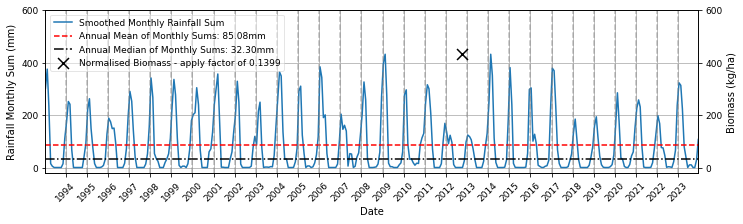

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\auv02_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\auv03.2012_1ha_mth_msum_zonal_stats.csv
auv03 2012
Event dates: ['2012-10-10T00:00:00.000000000']


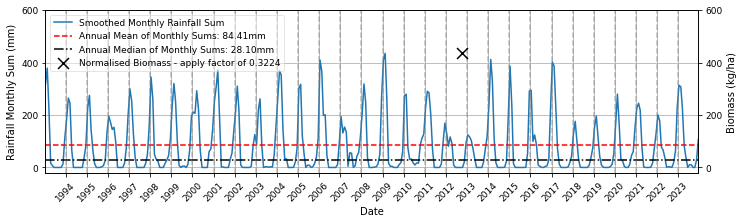

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\auv03_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\auv05.2012_1ha_mth_msum_zonal_stats.csv
auv05 2012
Event dates: ['2012-10-11T00:00:00.000000000']


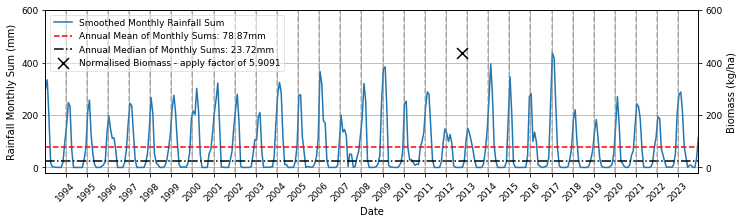

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\auv05_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\auv06.2012_1ha_mth_msum_zonal_stats.csv
auv06 2012
Event dates: ['2012-10-11T00:00:00.000000000']


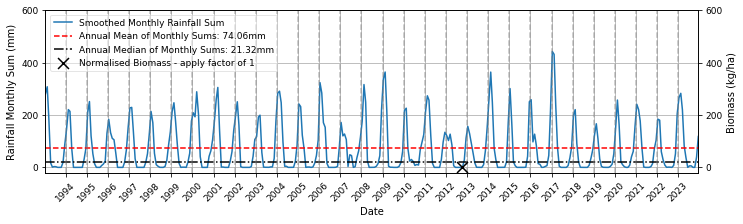

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\auv06_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\auv07.2012_1ha_mth_msum_zonal_stats.csv
auv07 2012
Event dates: ['2012-10-11T00:00:00.000000000']


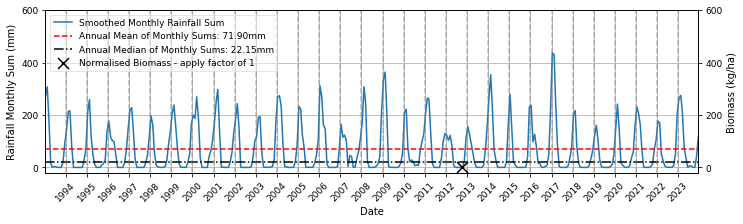

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\auv07_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\auv08.2012_1ha_mth_msum_zonal_stats.csv
auv08 2012
Event dates: ['2012-10-11T00:00:00.000000000']


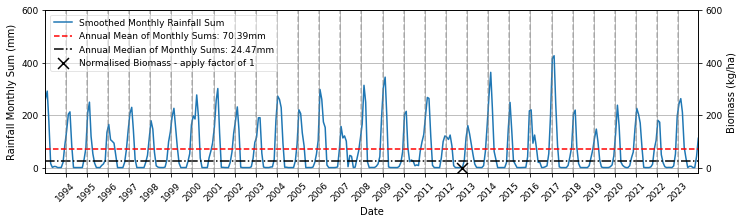

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\auv08_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\auv09.2012_1ha_mth_msum_zonal_stats.csv
auv09 2012
Event dates: ['2012-10-11T00:00:00.000000000']


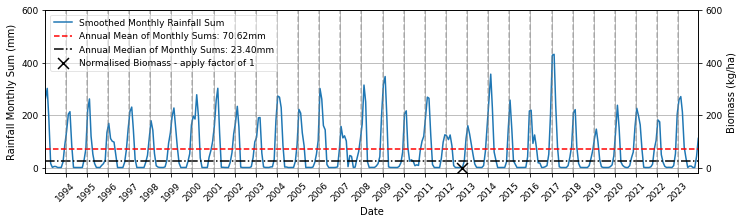

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\auv09_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\barkely01.2011_1ha_mth_msum_zonal_stats.csv
barkely01 2011
Event dates: ['2011-10-25T00:00:00.000000000']


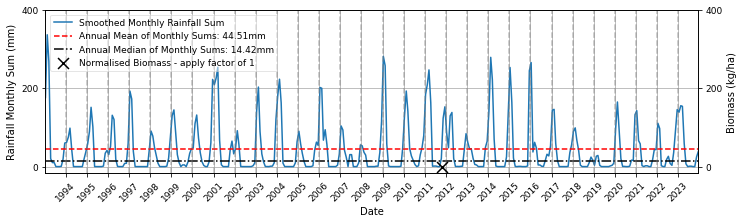

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\barkely01_2011_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\barkely02.2011_1ha_mth_msum_zonal_stats.csv
barkely02 2011
Event dates: ['2011-10-26T00:00:00.000000000']


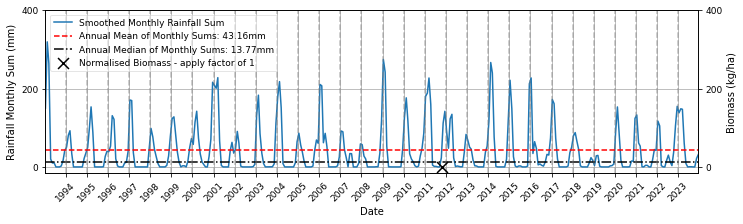

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\barkely02_2011_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\barkely03.2011_1ha_mth_msum_zonal_stats.csv
barkely03 2011
Event dates: ['2011-10-26T00:00:00.000000000']


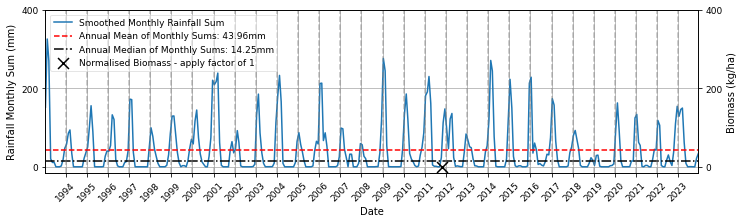

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\barkely03_2011_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\barkely04.2011_1ha_mth_msum_zonal_stats.csv
barkely04 2011
Event dates: ['2011-10-26T00:00:00.000000000']


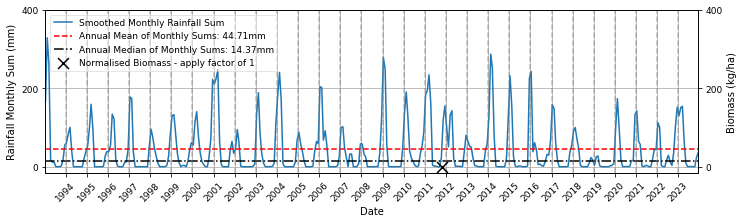

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\barkely04_2011_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\barkely05.2011_1ha_mth_msum_zonal_stats.csv
barkely05 2011
Event dates: ['2011-10-27T00:00:00.000000000']


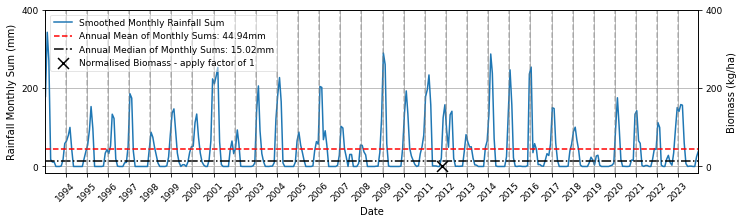

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\barkely05_2011_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\barkely06.2011_1ha_mth_msum_zonal_stats.csv
barkely06 2011
Event dates: ['2011-10-27T00:00:00.000000000']


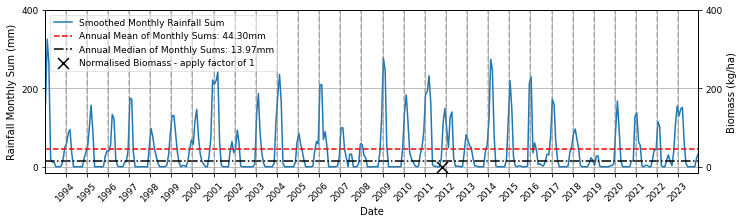

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\barkely06_2011_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\barkely07.2011_1ha_mth_msum_zonal_stats.csv
barkely07 2011
Event dates: ['2011-10-27T00:00:00.000000000']


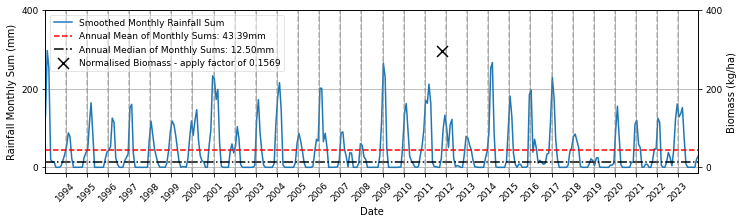

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\barkely07_2011_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\bc101.2024_1ha_mth_msum_zonal_stats.csv
bc101 2024
Event dates: ['2024-05-24T00:00:00.000000000']


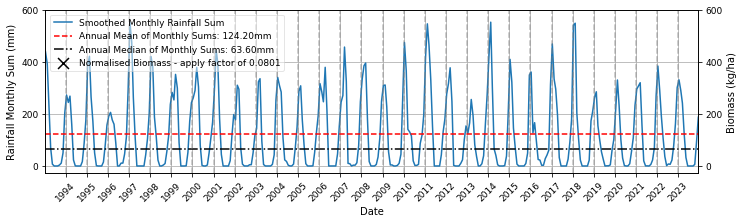

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\bc101_2024_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\buff01.2012_1ha_mth_msum_zonal_stats.csv
buff01 2012
Event dates: ['2012-07-13T00:00:00.000000000']


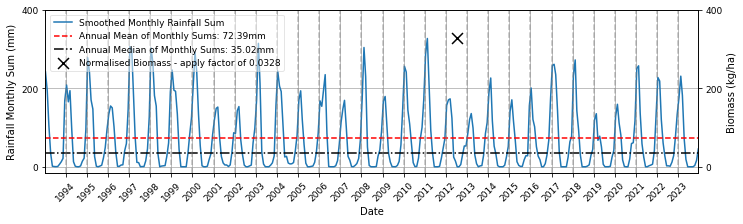

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\buff01_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\centa13.2013_1ha_mth_msum_zonal_stats.csv
centa13 2013
Event dates: ['2013-06-02T00:00:00.000000000']


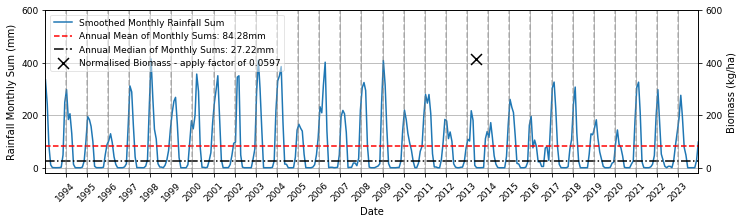

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\centa13_2013_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\centa14.2012_1ha_mth_msum_zonal_stats.csv
centa14 2012
Event dates: ['2012-06-02T00:00:00.000000000']


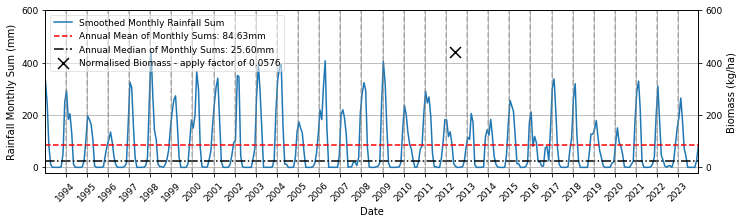

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\centa14_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\cpr01.2024_1ha_mth_msum_zonal_stats.csv
cpr01 2024
Event dates: ['2024-06-02T00:00:00.000000000']


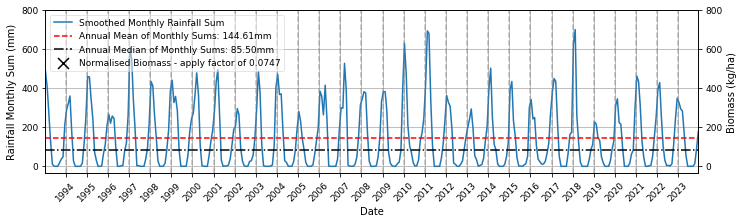

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\cpr01_2024_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\cpr02.2024_1ha_mth_msum_zonal_stats.csv
cpr02 2024
Event dates: ['2024-06-02T00:00:00.000000000']


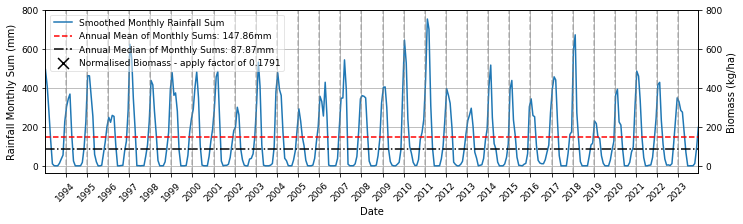

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\cpr02_2024_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\cpr03.2024_1ha_mth_msum_zonal_stats.csv
cpr03 2024
Event dates: ['2024-06-02T00:00:00.000000000']


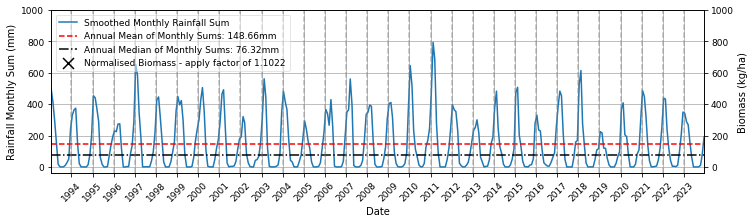

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\cpr03_2024_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\cpr04.2024_1ha_mth_msum_zonal_stats.csv
cpr04 2024
Event dates: ['2024-06-02T00:00:00.000000000']


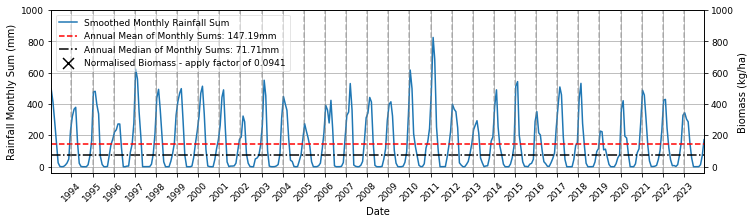

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\cpr04_2024_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\el01.2013_1ha_mth_msum_zonal_stats.csv
el01 2013
Event dates: ['2013-04-13T00:00:00.000000000']


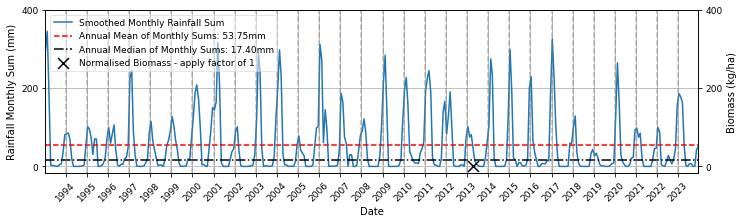

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\el01_2013_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\el02.2013_1ha_mth_msum_zonal_stats.csv
el02 2013
Event dates: ['2013-04-14T00:00:00.000000000']


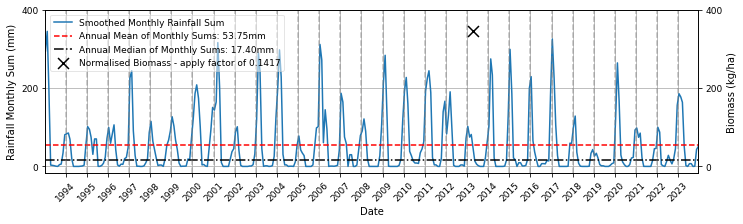

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\el02_2013_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ep01.2012_1ha_mth_msum_zonal_stats.csv
ep01 2012
Event dates: ['2012-07-13T00:00:00.000000000']


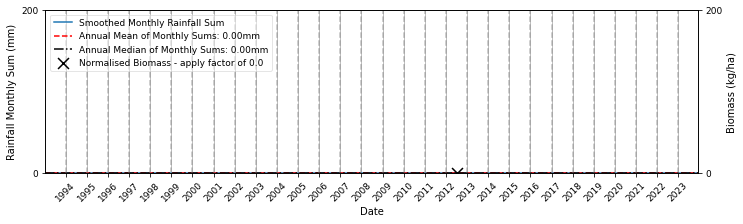

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ep01_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\fin101.2024_1ha_mth_msum_zonal_stats.csv
fin101 2024
Event dates: ['2024-05-26T00:00:00.000000000']


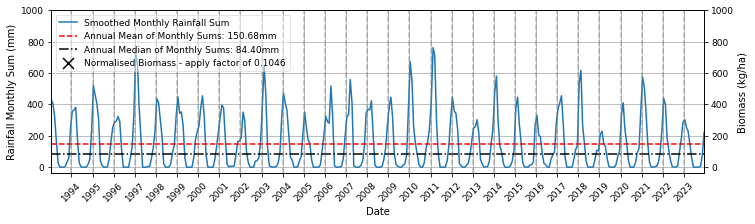

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\fin101_2024_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\fin102.2024_1ha_mth_msum_zonal_stats.csv
fin102 2024
Event dates: ['2024-05-26T00:00:00.000000000']


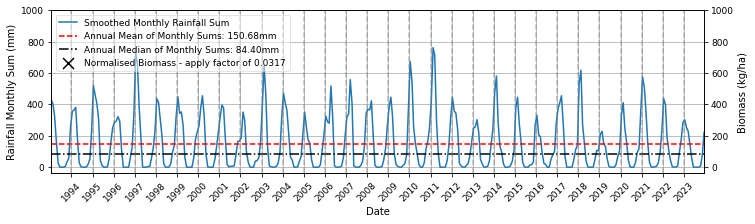

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\fin102_2024_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\girra01.2012_1ha_mth_msum_zonal_stats.csv
girra01 2012
Event dates: ['2012-06-05T00:00:00.000000000']


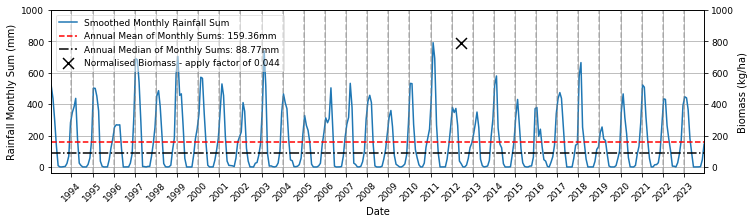

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\girra01_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\girra02.2012_1ha_mth_msum_zonal_stats.csv
girra02 2012
Event dates: ['2012-06-05T00:00:00.000000000']


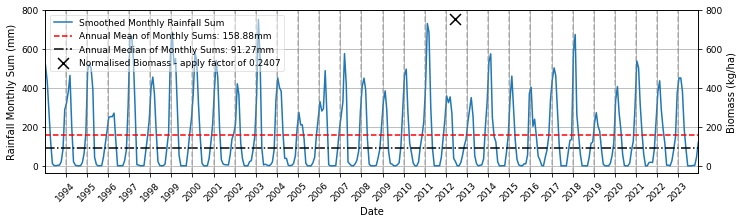

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\girra02_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\gulf10.2013_1ha_mth_msum_zonal_stats.csv
gulf10 2013
Event dates: ['2013-07-16T00:00:00.000000000']


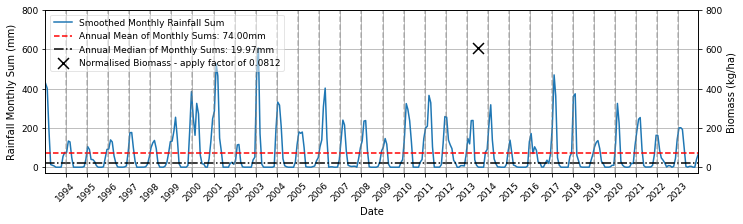

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\gulf10_2013_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\gulf11.2013_1ha_mth_msum_zonal_stats.csv
gulf11 2013
Event dates: ['2013-07-16T00:00:00.000000000']


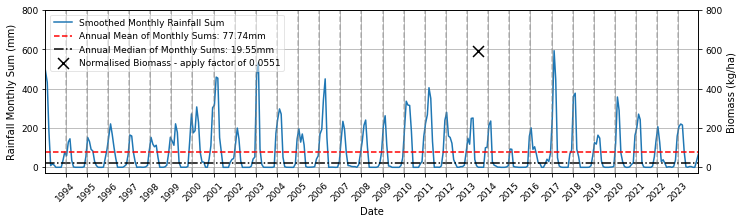

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\gulf11_2013_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\gulf12.2013_1ha_mth_msum_zonal_stats.csv
gulf12 2013
Event dates: ['2013-07-16T00:00:00.000000000']


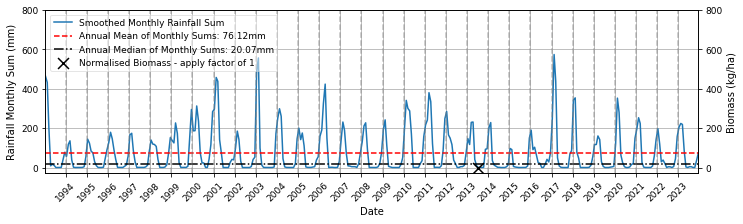

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\gulf12_2013_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\hsf01.2012_1ha_mth_msum_zonal_stats.csv
hsf01 2012
Event dates: ['2012-07-10T00:00:00.000000000']


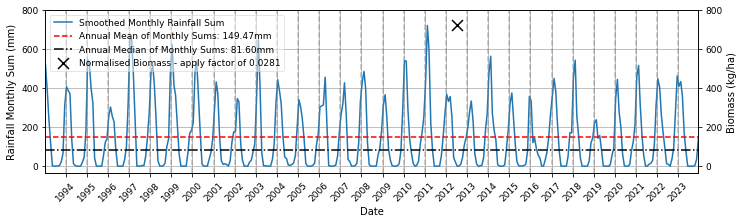

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\hsf01_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\hsf02.2012_1ha_mth_msum_zonal_stats.csv
hsf02 2012
Event dates: ['2012-07-10T00:00:00.000000000']


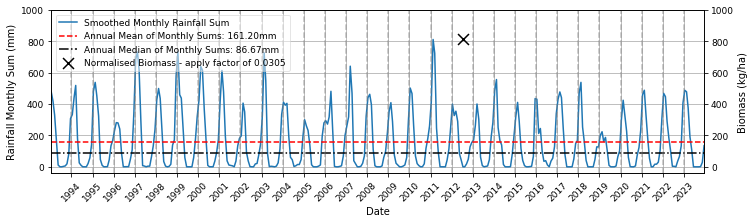

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\hsf02_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\hshr01.2012_1ha_mth_msum_zonal_stats.csv
hshr01 2012
Event dates: ['2012-06-06T00:00:00.000000000']


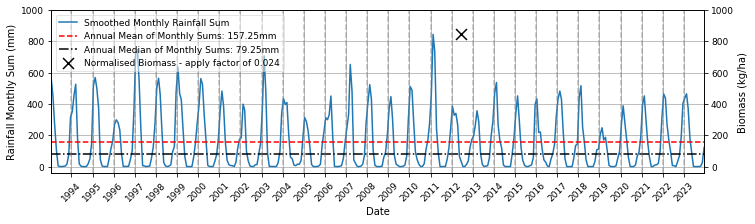

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\hshr01_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\jdr01.2012_1ha_mth_msum_zonal_stats.csv
jdr01 2012
Event dates: ['2012-05-22T00:00:00.000000000']


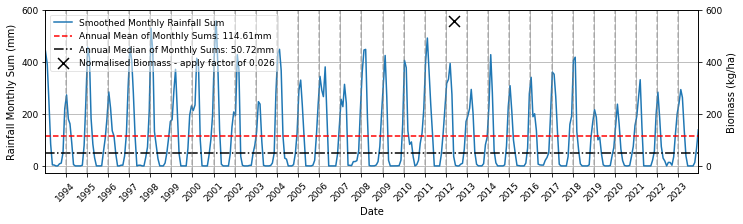

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\jdr01_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\jdr02.2012_1ha_mth_msum_zonal_stats.csv
jdr02 2012
Event dates: ['2012-05-23T00:00:00.000000000']


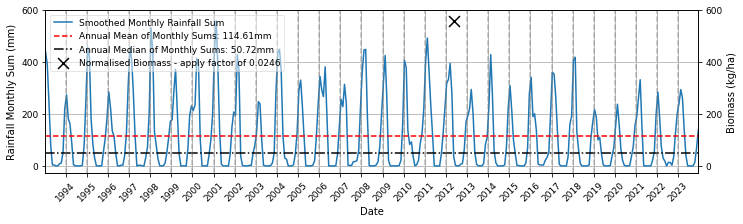

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\jdr02_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\jdr03.2012_1ha_mth_msum_zonal_stats.csv
jdr03 2012
Event dates: ['2012-05-23T00:00:00.000000000']


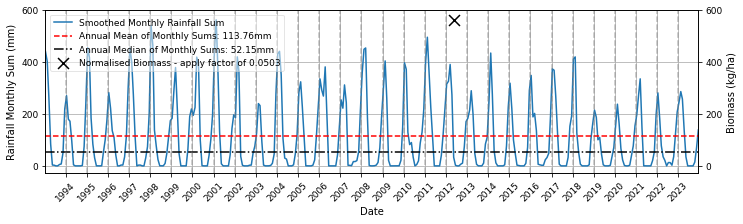

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\jdr03_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\jdr04.2012_1ha_mth_msum_zonal_stats.csv
jdr04 2012
Event dates: ['2012-05-23T00:00:00.000000000']


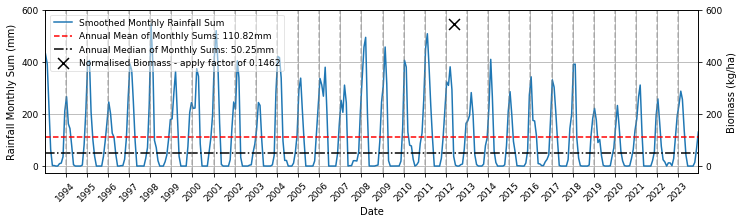

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\jdr04_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\jdr05.2012_1ha_mth_msum_zonal_stats.csv
jdr05 2012
Event dates: ['2012-05-24T00:00:00.000000000']


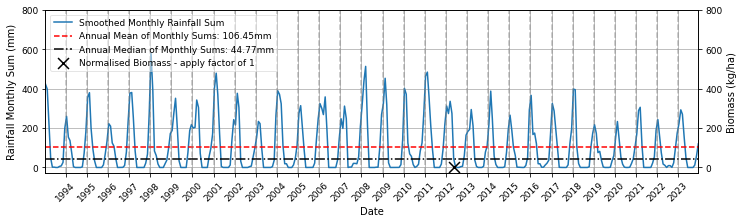

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\jdr05_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\jnk101.2024_1ha_mth_msum_zonal_stats.csv
jnk101 2024
Event dates: ['2024-05-26T00:00:00.000000000']


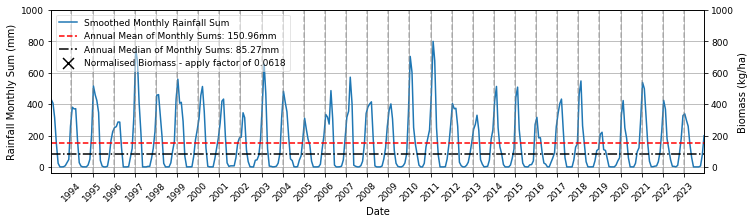

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\jnk101_2024_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\jnk102.2024_1ha_mth_msum_zonal_stats.csv
jnk102 2024
Event dates: ['2024-05-26T00:00:00.000000000']


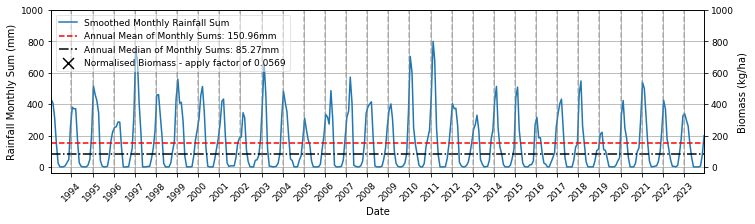

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\jnk102_2024_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\jnk103.2024_1ha_mth_msum_zonal_stats.csv
jnk103 2024
Event dates: ['2024-05-26T00:00:00.000000000']


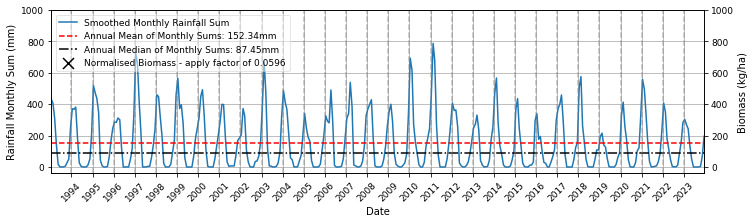

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\jnk103_2024_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\larr15.2013_1ha_mth_msum_zonal_stats.csv
larr15 2013
Event dates: ['2013-05-31T00:00:00.000000000']


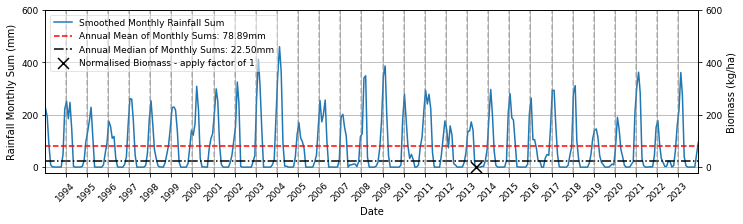

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\larr15_2013_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\legu01.2012_1ha_mth_msum_zonal_stats.csv
legu01 2012
Event dates: ['2012-10-05T00:00:00.000000000']


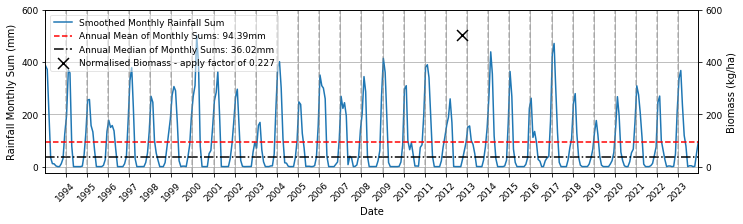

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\legu01_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\legu02.2012_1ha_mth_msum_zonal_stats.csv
legu02 2012
Event dates: ['2012-10-05T00:00:00.000000000']


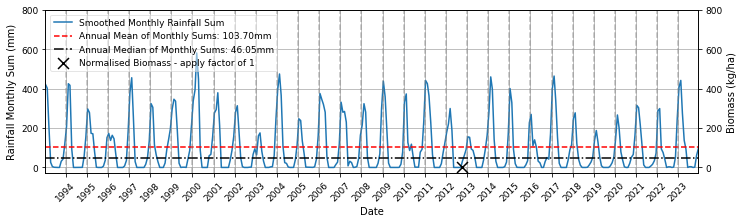

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\legu02_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\legu03.2012_1ha_mth_msum_zonal_stats.csv
legu03 2012
Event dates: ['2012-10-06T00:00:00.000000000']


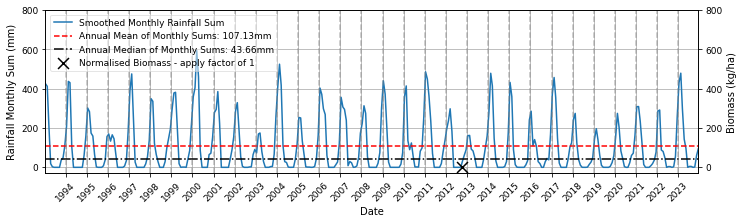

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\legu03_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\legu04.2012_1ha_mth_msum_zonal_stats.csv
legu04 2012
Event dates: ['2012-10-07T00:00:00.000000000']


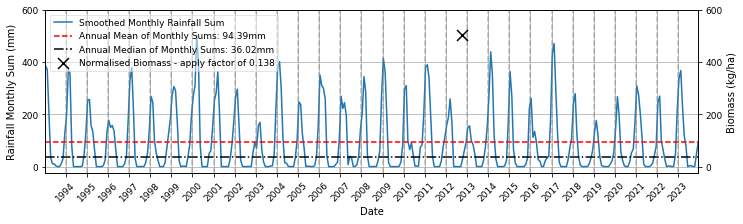

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\legu04_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\legu05.2012_1ha_mth_msum_zonal_stats.csv
legu05 2012
Event dates: ['2012-10-07T00:00:00.000000000']


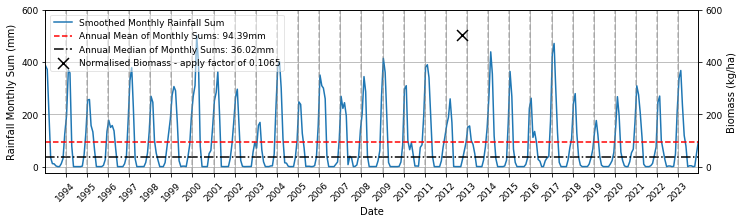

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\legu05_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\legu06.2012_1ha_mth_msum_zonal_stats.csv
legu06 2012
Event dates: ['2012-10-07T00:00:00.000000000']


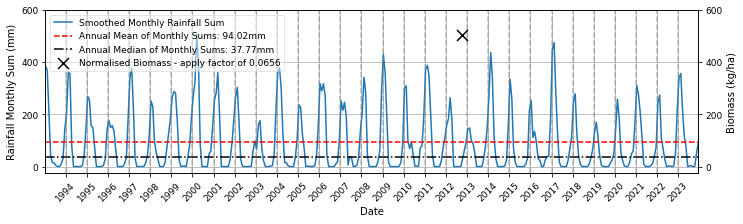

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\legu06_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\legu07.2012_1ha_mth_msum_zonal_stats.csv
legu07 2012
Event dates: ['2012-10-08T00:00:00.000000000']


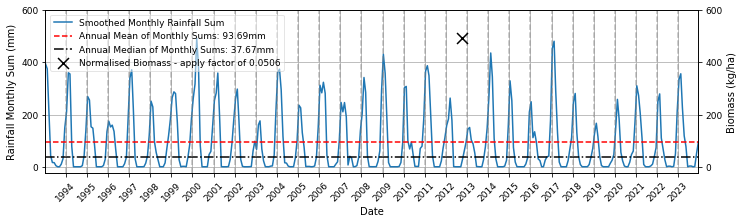

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\legu07_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\legu08.2012_1ha_mth_msum_zonal_stats.csv
legu08 2012
Event dates: ['2012-10-08T00:00:00.000000000']


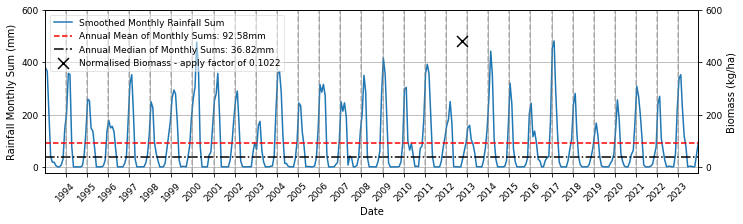

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\legu08_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\lfr101.2024_1ha_mth_msum_zonal_stats.csv
lfr101 2024
Event dates: ['2024-05-26T00:00:00.000000000']


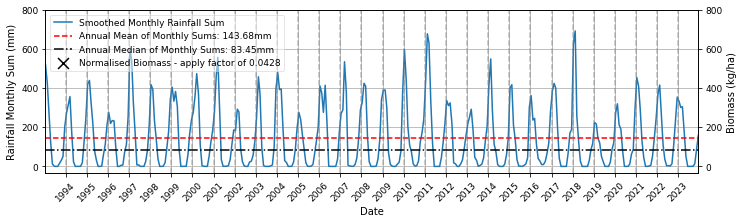

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\lfr101_2024_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\lfr102.2024_1ha_mth_msum_zonal_stats.csv
lfr102 2024
Event dates: ['2024-05-26T00:00:00.000000000']


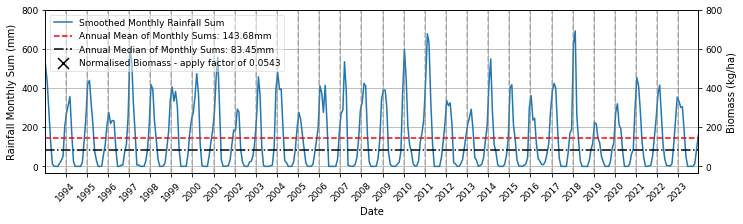

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\lfr102_2024_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\lim01.2012_1ha_mth_msum_zonal_stats.csv
lim01 2012
Event dates: ['2012-05-29T00:00:00.000000000']


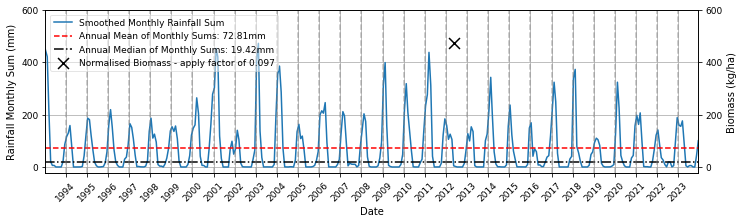

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\lim01_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\lim03.2012_1ha_mth_msum_zonal_stats.csv
lim03 2012
Event dates: ['2012-05-30T00:00:00.000000000']


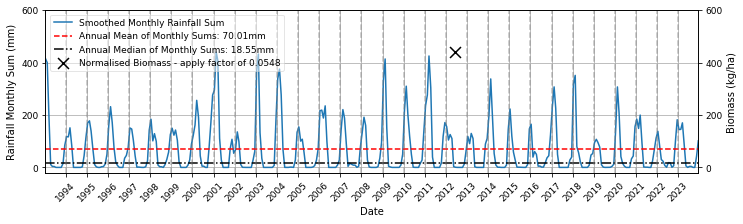

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\lim03_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\lim04.2012_1ha_mth_msum_zonal_stats.csv
lim04 2012
Event dates: ['2012-05-30T00:00:00.000000000']


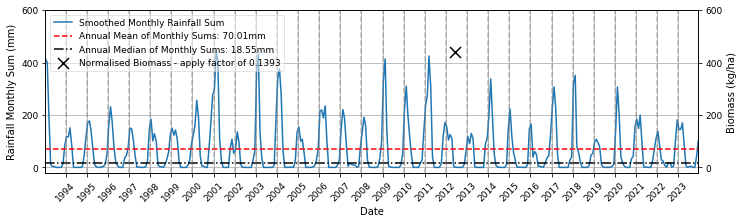

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\lim04_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\lim06.2012_1ha_mth_msum_zonal_stats.csv
lim06 2012
Event dates: ['2012-05-30T00:00:00.000000000']


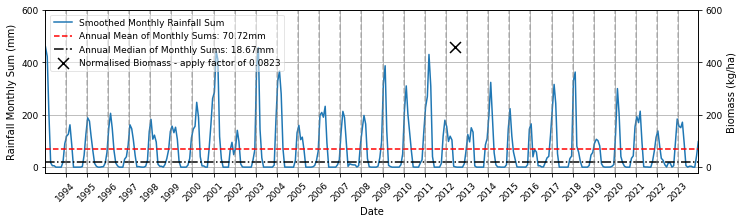

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\lim06_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\lim08.2013_1ha_mth_msum_zonal_stats.csv
lim08 2013
Event dates: ['2013-06-01T00:00:00.000000000']


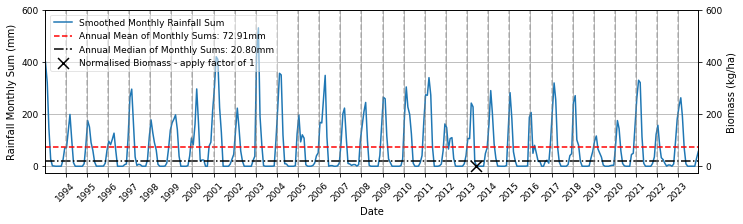

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\lim08_2013_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\lim09.2013_1ha_mth_msum_zonal_stats.csv
lim09 2013
Event dates: ['2013-06-01T00:00:00.000000000']


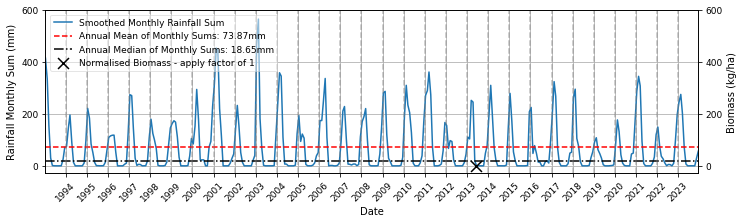

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\lim09_2013_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\lit01.2013_1ha_mth_msum_zonal_stats.csv
lit01 2013
Event dates: ['2013-04-26T00:00:00.000000000']


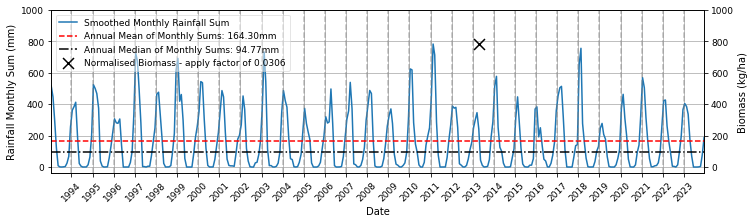

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\lit01_2013_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\lto04.2013_1ha_mth_msum_zonal_stats.csv
lto04 2013
Event dates: ['2013-05-28T00:00:00.000000000']


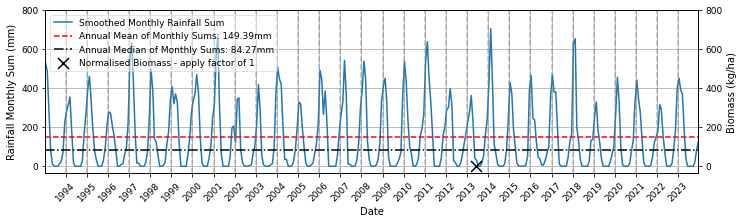

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\lto04_2013_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\lto05.2013_1ha_mth_msum_zonal_stats.csv
lto05 2013
Event dates: ['2013-05-28T00:00:00.000000000']


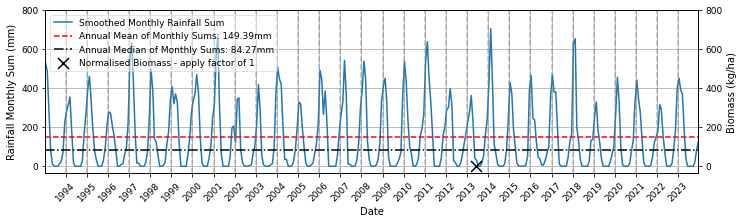

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\lto05_2013_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\nc02.2013_1ha_mth_msum_zonal_stats.csv
nc02 2013
Event dates: ['2013-04-14T00:00:00.000000000']


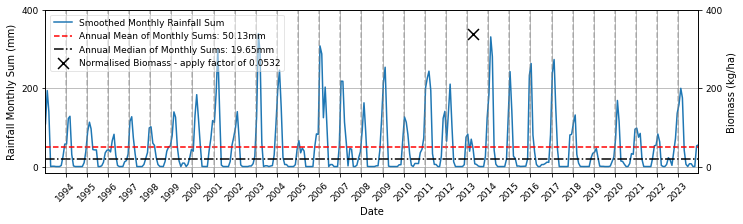

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\nc02_2013_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\nc03.2013_1ha_mth_msum_zonal_stats.csv
nc03 2013
Event dates: ['2013-04-14T00:00:00.000000000']


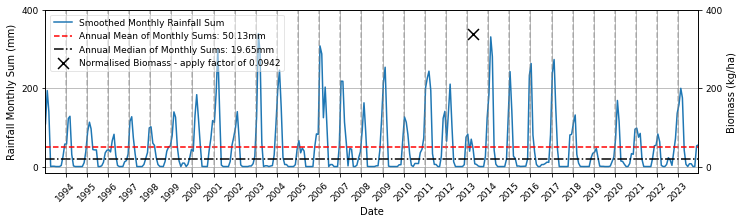

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\nc03_2013_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\nt001.2011_1ha_mth_msum_zonal_stats.csv
nt001 2011
Event dates: ['2011-05-23T00:00:00.000000000']


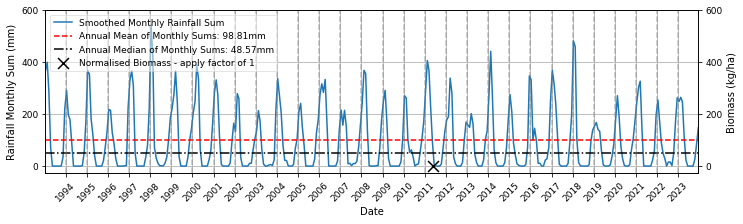

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\nt001_2011_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\nt002.2012_1ha_mth_msum_zonal_stats.csv
nt002 2012
Event dates: ['2012-05-23T00:00:00.000000000']


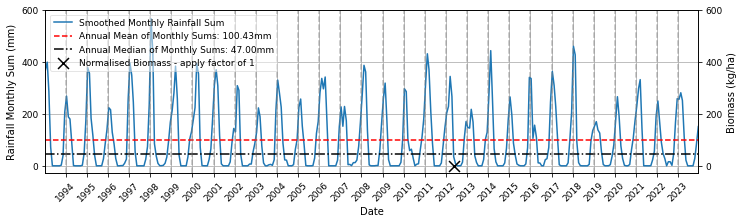

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\nt002_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\nt003.2012_1ha_mth_msum_zonal_stats.csv
nt003 2012
Event dates: ['2012-05-23T00:00:00.000000000']


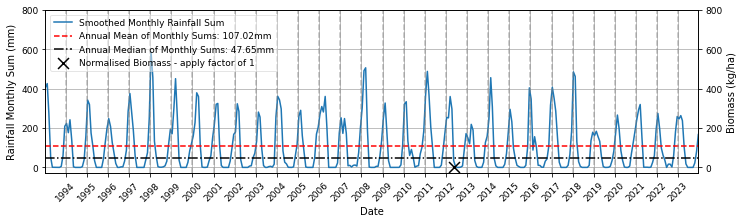

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\nt003_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\nt004.2012_1ha_mth_msum_zonal_stats.csv
nt004 2012
Event dates: ['2012-05-24T00:00:00.000000000']


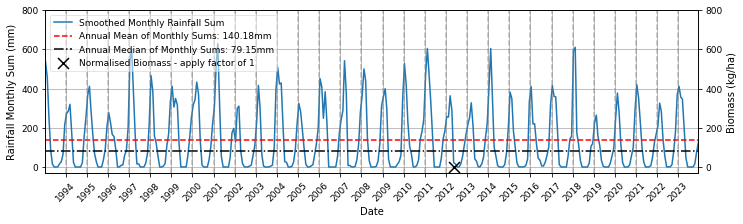

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\nt004_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntaarp0001.2016_1ha_mth_msum_zonal_stats.csv
ntaarp0001 2016
Event dates: []


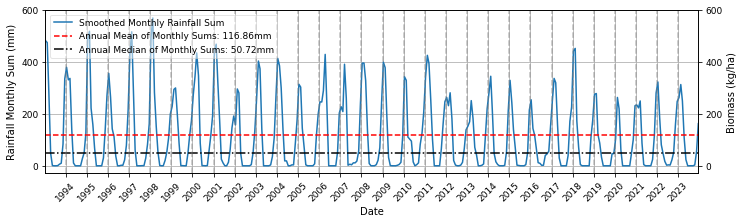

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntaarp0001_2016_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntaarp0002.2016_1ha_mth_msum_zonal_stats.csv
ntaarp0002 2016
Event dates: []


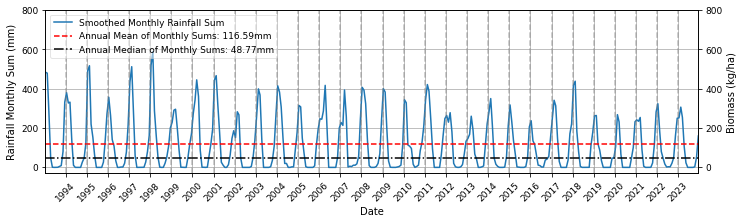

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntaarp0002_2016_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntaarp0003.2016_1ha_mth_msum_zonal_stats.csv
ntaarp0003 2016
Event dates: []


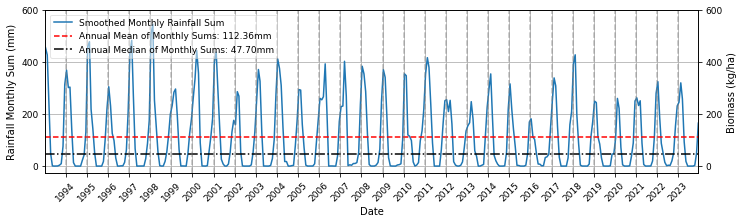

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntaarp0003_2016_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntadac0001.2013_1ha_mth_msum_zonal_stats.csv
ntadac0001 2013
Event dates: []


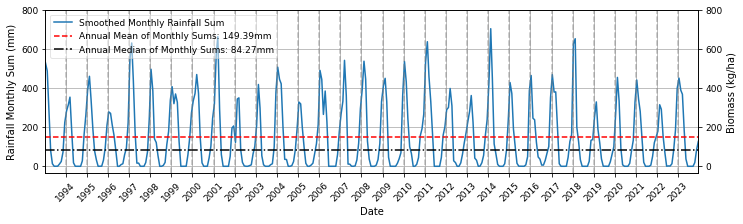

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntadac0001_2013_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntadac0002.2016_1ha_mth_msum_zonal_stats.csv
ntadac0002 2016
Event dates: []


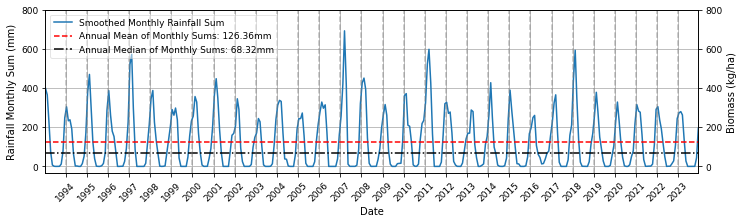

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntadac0002_2016_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0001.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0001 2012
Event dates: []


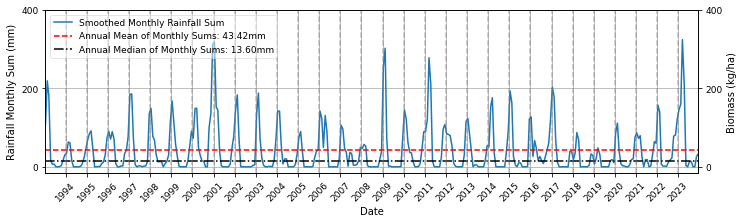

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0001_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0002.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0002 2012
Event dates: []


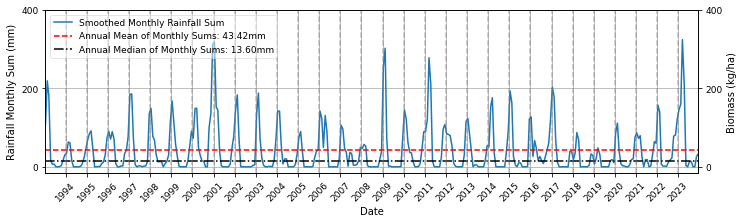

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0002_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0003.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0003 2012
Event dates: []


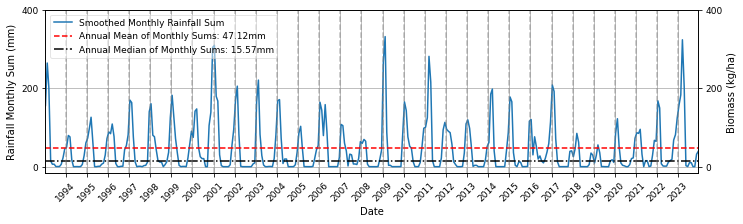

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0003_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0004.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0004 2012
Event dates: []


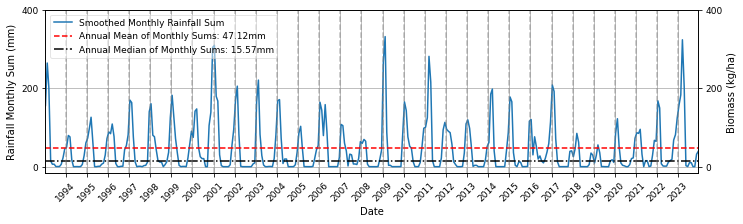

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0004_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0005.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0005 2012
Event dates: []


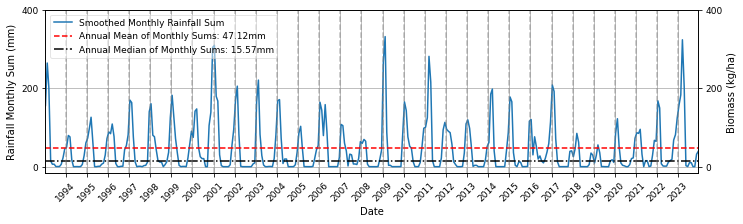

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0005_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0006.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0006 2012
Event dates: []


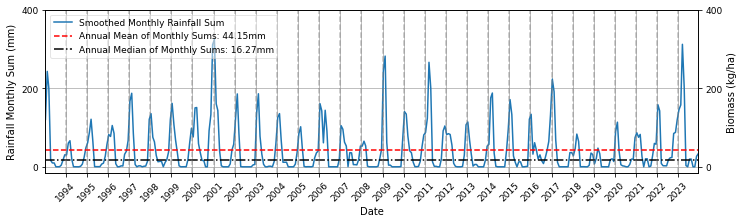

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0006_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0007.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0007 2012
Event dates: []


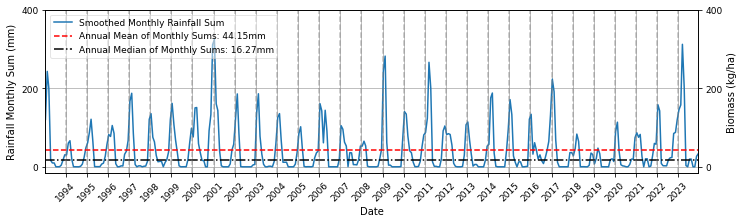

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0007_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0008.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0008 2012
Event dates: []


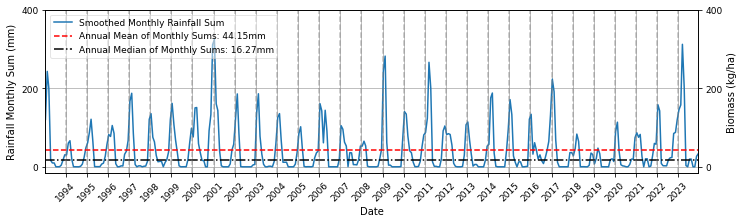

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0008_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0009.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0009 2012
Event dates: []


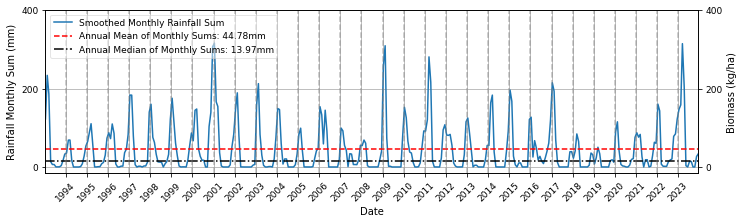

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0009_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0010.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0010 2012
Event dates: []


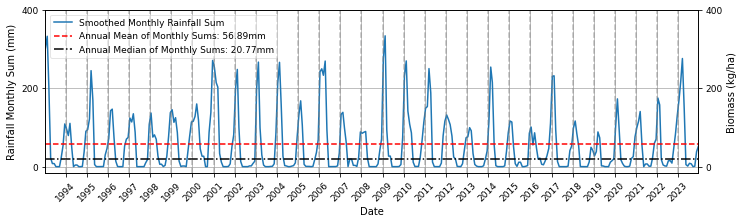

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0010_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0011.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0011 2012
Event dates: []


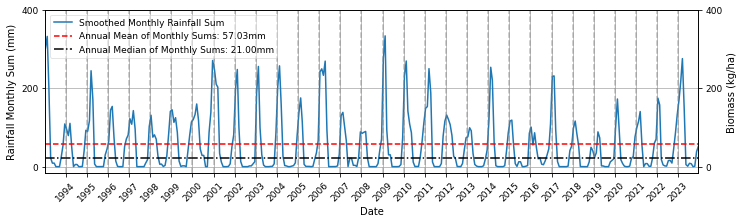

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0011_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0012.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0012 2012
Event dates: []


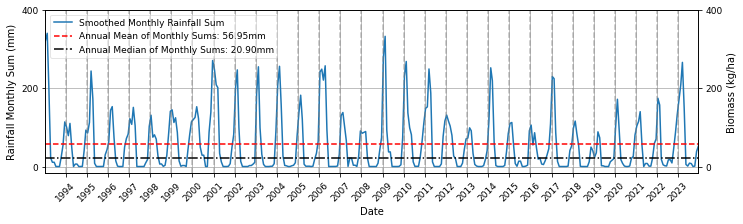

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0012_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0013.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0013 2012
Event dates: []


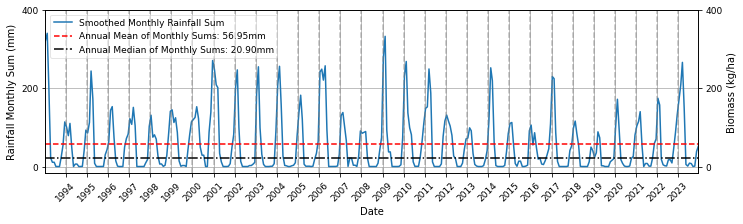

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0013_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0014.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0014 2012
Event dates: []


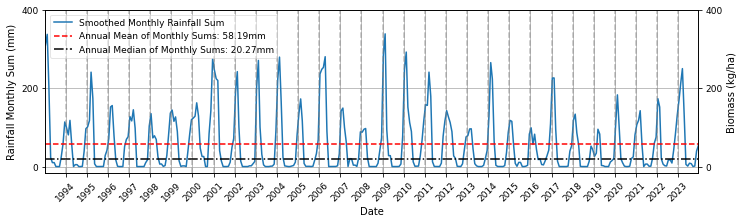

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0014_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0015.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0015 2012
Event dates: []


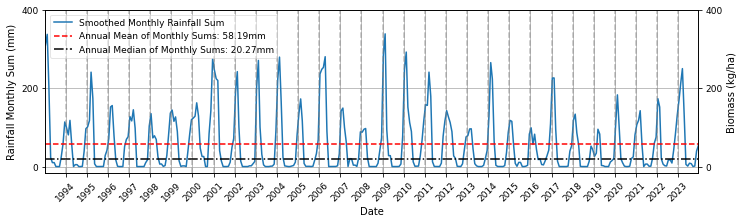

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0015_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0016.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0016 2012
Event dates: []


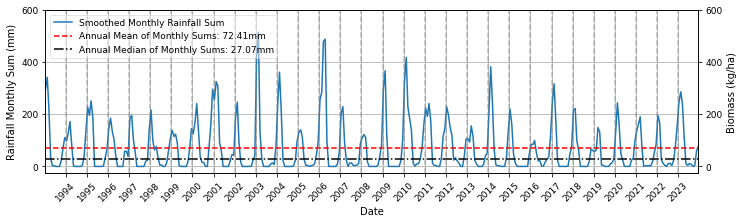

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0016_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0017.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0017 2012
Event dates: []


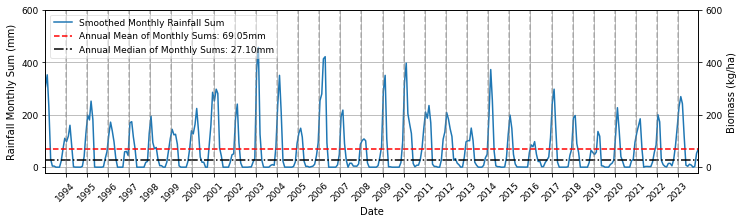

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0017_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0018.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0018 2012
Event dates: []


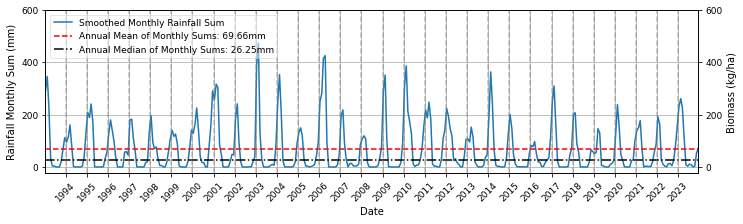

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0018_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0019.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0019 2012
Event dates: []


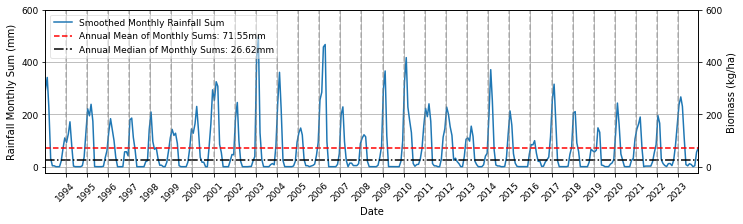

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0019_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0020.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0020 2012
Event dates: []


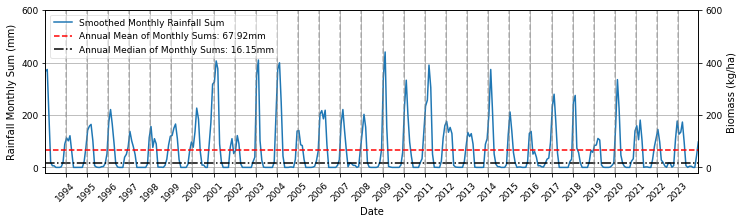

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0020_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0021.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0021 2012
Event dates: []


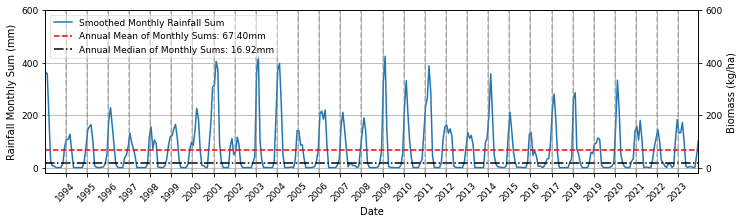

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0021_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0022.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0022 2012
Event dates: []


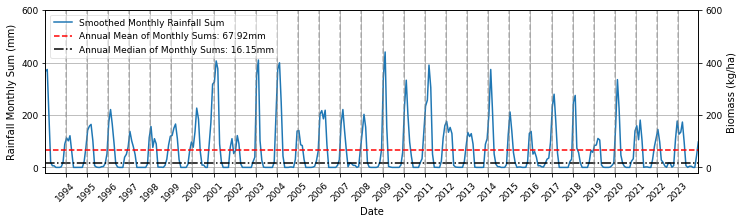

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0022_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0023.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0023 2012
Event dates: []


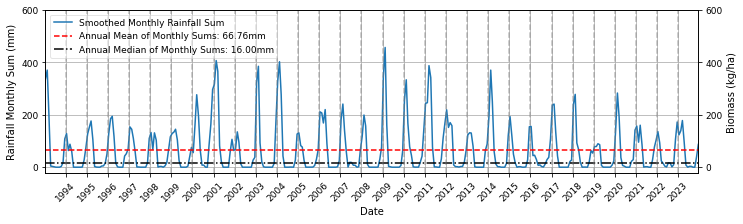

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0023_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0024.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0024 2012
Event dates: []


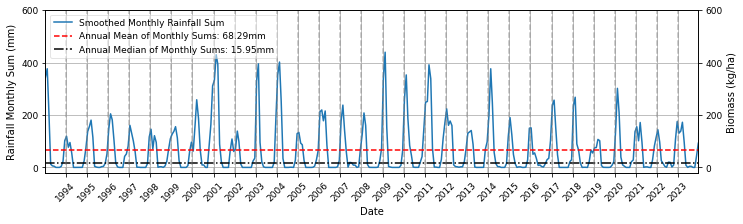

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0024_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0025.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0025 2012
Event dates: []


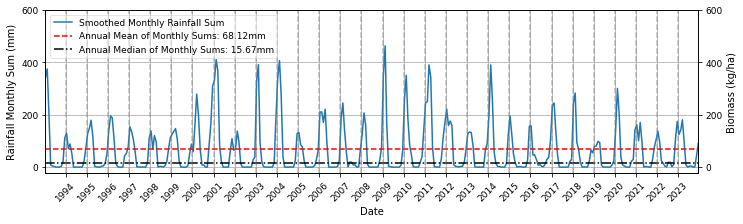

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0025_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0026.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0026 2012
Event dates: []


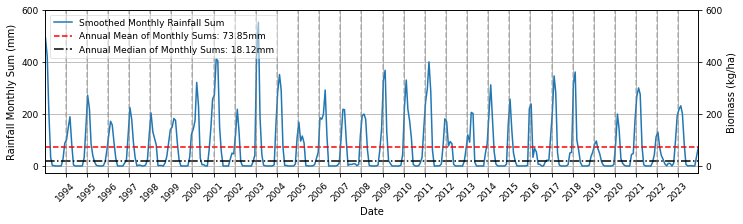

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0026_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0027.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0027 2012
Event dates: []


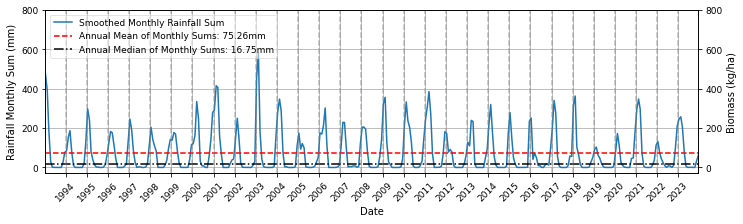

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0027_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0028.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0028 2012
Event dates: []


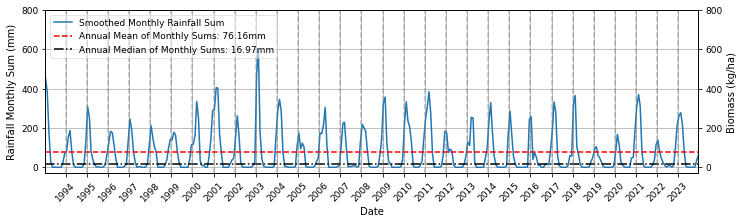

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0028_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0029.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0029 2012
Event dates: []


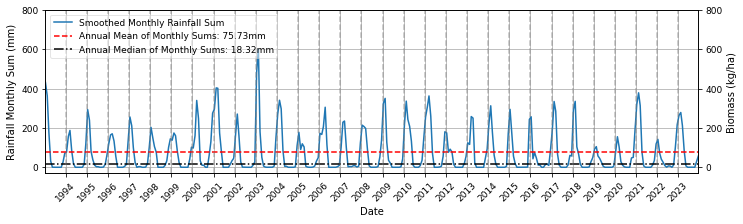

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0029_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0030.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0030 2012
Event dates: []


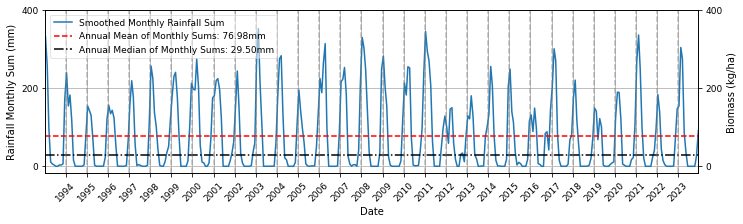

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0030_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0031.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0031 2012
Event dates: []


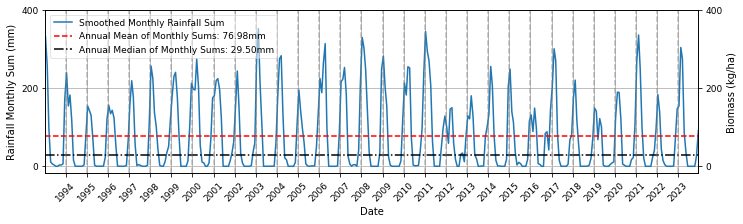

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0031_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0032.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0032 2012
Event dates: []


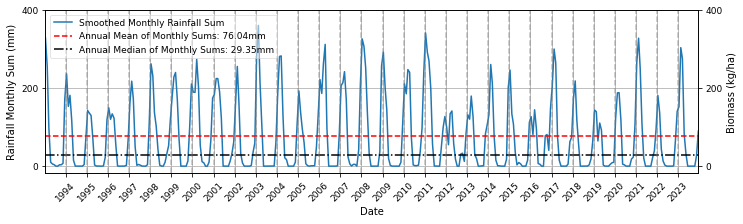

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0032_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0033.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0033 2012
Event dates: []


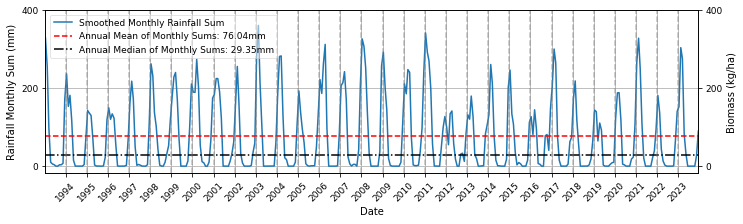

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0033_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0034.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0034 2012
Event dates: []


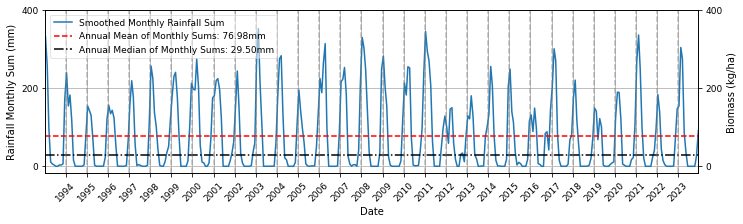

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0034_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0035.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0035 2012
Event dates: []


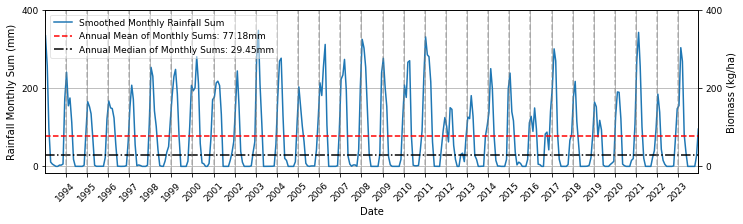

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0035_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0036.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0036 2012
Event dates: []


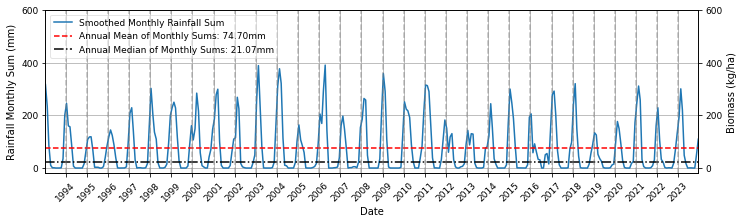

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0036_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0037.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0037 2012
Event dates: []


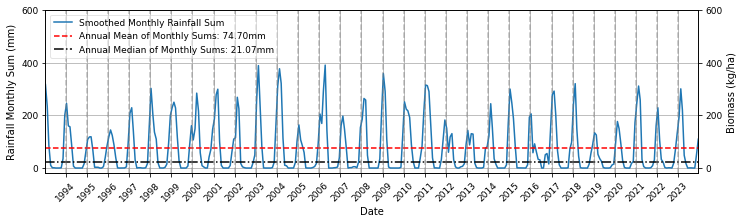

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0037_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0038.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0038 2012
Event dates: []


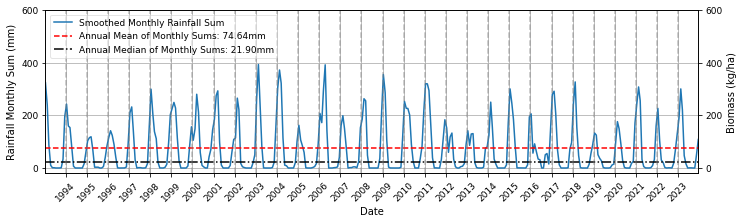

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0038_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0039.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0039 2012
Event dates: []


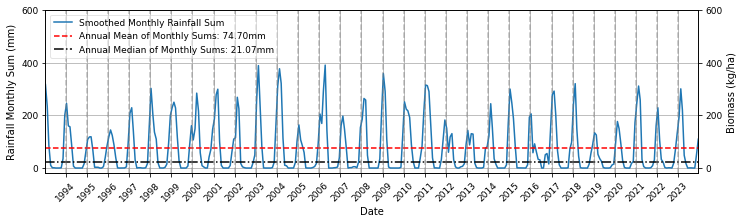

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0039_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0040.2012_1ha_mth_msum_zonal_stats.csv
ntagfu0040 2012
Event dates: []


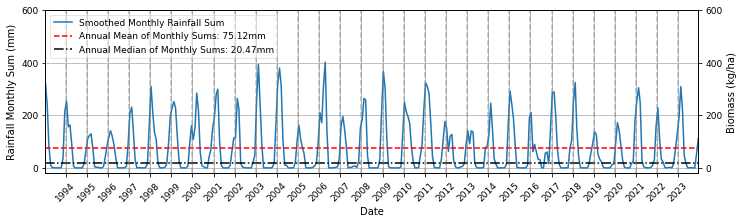

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0040_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntagfu0041.2016_1ha_mth_msum_zonal_stats.csv
ntagfu0041 2016
Event dates: []


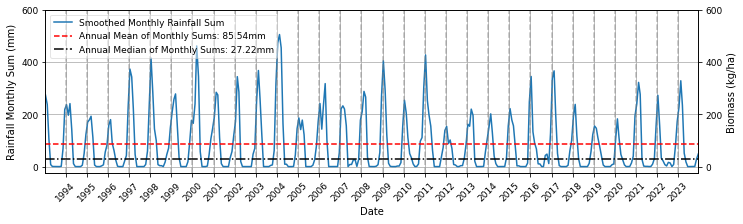

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntagfu0041_2016_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntamgd0001.2014_1ha_mth_msum_zonal_stats.csv
ntamgd0001 2014
Event dates: []


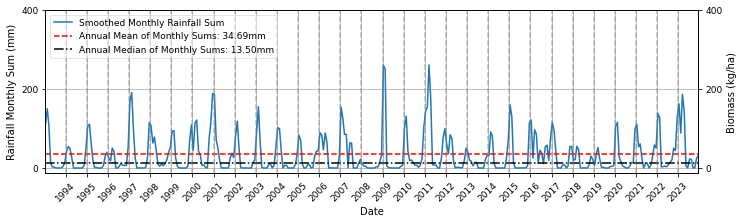

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntamgd0001_2014_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntamgd0002.2014_1ha_mth_msum_zonal_stats.csv
ntamgd0002 2014
Event dates: []


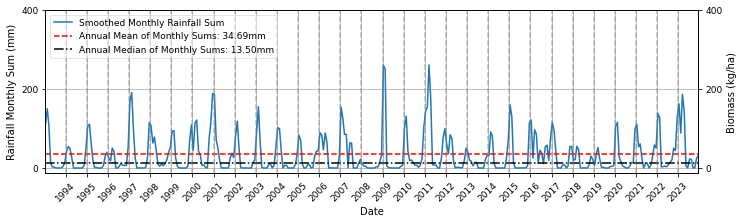

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntamgd0002_2014_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntamgd0003.2016_1ha_mth_msum_zonal_stats.csv
ntamgd0003 2016
Event dates: []


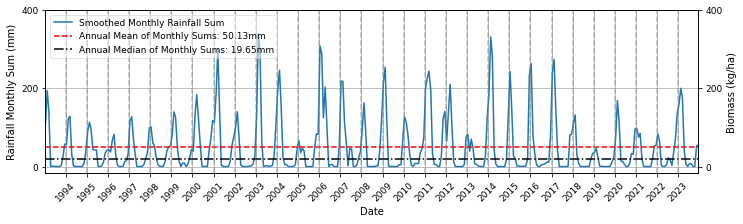

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntamgd0003_2016_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntamgd0004.2016_1ha_mth_msum_zonal_stats.csv
ntamgd0004 2016
Event dates: []


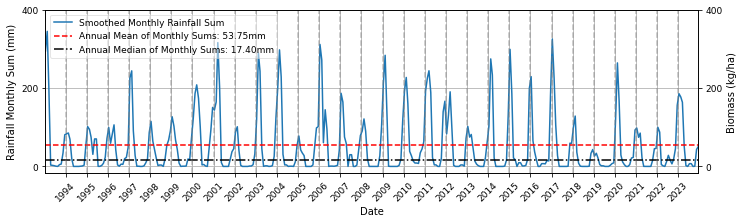

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntamgd0004_2016_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntamgd0005.2016_1ha_mth_msum_zonal_stats.csv
ntamgd0005 2016
Event dates: []


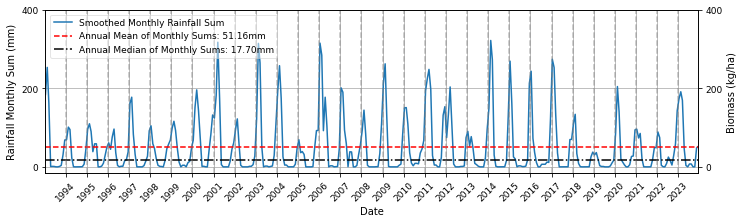

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntamgd0005_2016_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntapck0001.2016_1ha_mth_msum_zonal_stats.csv
ntapck0001 2016
Event dates: []


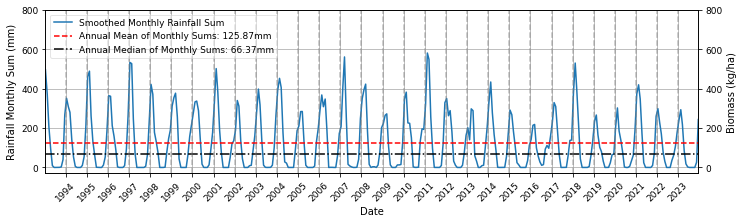

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntapck0001_2016_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntapck0002.2016_1ha_mth_msum_zonal_stats.csv
ntapck0002 2016
Event dates: []


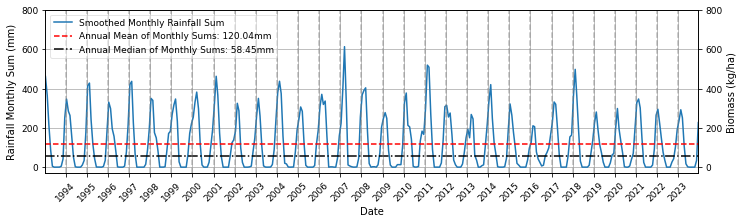

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntapck0002_2016_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntastu0001.2016_1ha_mth_msum_zonal_stats.csv
ntastu0001 2016
Event dates: []


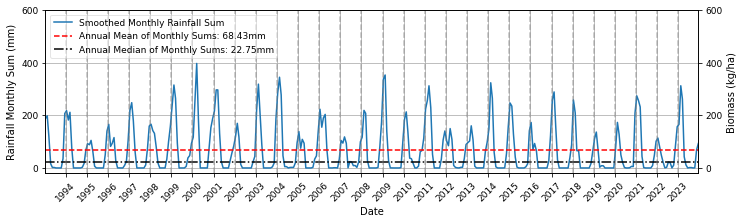

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntastu0001_2016_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntastu0002.2016_1ha_mth_msum_zonal_stats.csv
ntastu0002 2016
Event dates: []


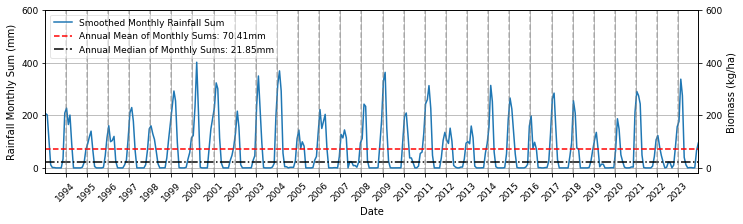

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntastu0002_2016_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntastu0003.2016_1ha_mth_msum_zonal_stats.csv
ntastu0003 2016
Event dates: []


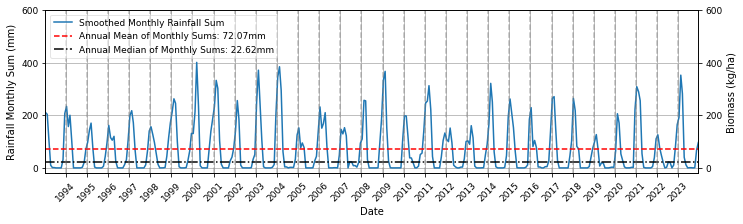

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntastu0003_2016_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntastu0004.2016_1ha_mth_msum_zonal_stats.csv
ntastu0004 2016
Event dates: []


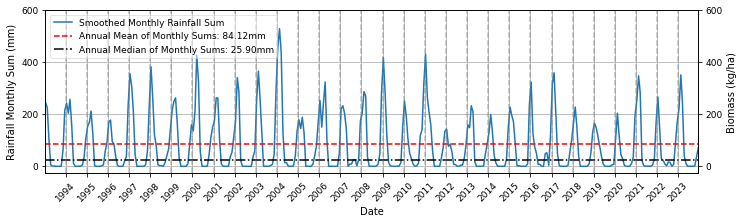

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntastu0004_2016_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\ntastu0005.2016_1ha_mth_msum_zonal_stats.csv
ntastu0005 2016
Event dates: []


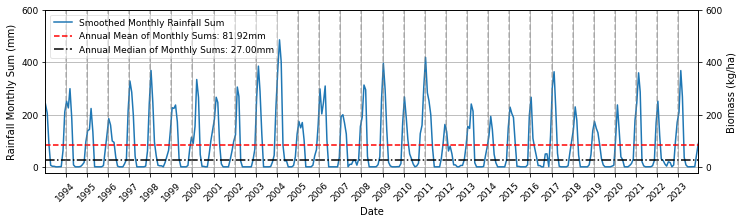

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\ntastu0005_2016_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\nttdab0001.2014_1ha_mth_msum_zonal_stats.csv
nttdab0001 2014
Event dates: []


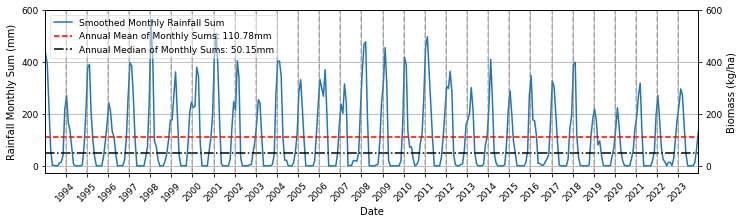

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\nttdab0001_2014_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\nttdac0001.2014_1ha_mth_msum_zonal_stats.csv
nttdac0001 2014
Event dates: []


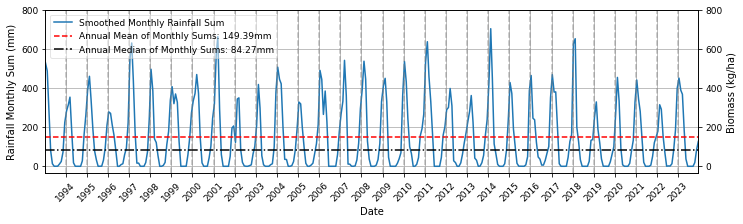

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\nttdac0001_2014_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\nttmgd0001.2014_1ha_mth_msum_zonal_stats.csv
nttmgd0001 2014
Event dates: []


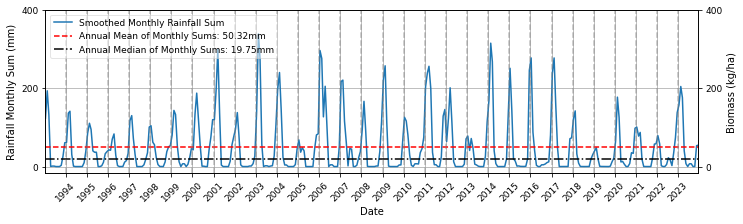

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\nttmgd0001_2014_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\nttpck0001.2014_1ha_mth_msum_zonal_stats.csv
nttpck0001 2014
Event dates: []


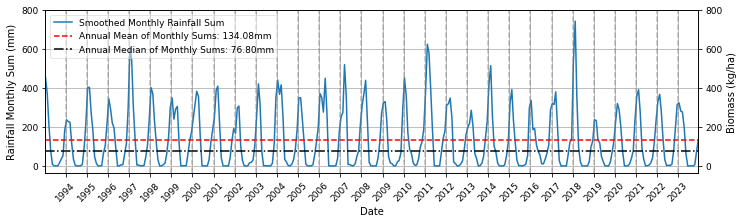

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\nttpck0001_2014_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\nttstu0001.2014_1ha_mth_msum_zonal_stats.csv
nttstu0001 2014
Event dates: []


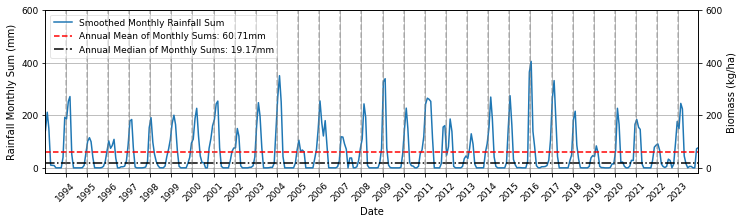

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\nttstu0001_2014_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site01.2023_1ha_mth_msum_zonal_stats.csv
site01 2023
Event dates: ['2023-09-07T00:00:00.000000000']


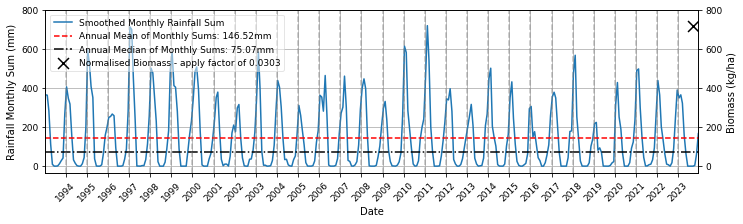

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\site01_2023_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site02.2023_1ha_mth_msum_zonal_stats.csv
site02 2023
Event dates: ['2023-09-07T00:00:00.000000000']


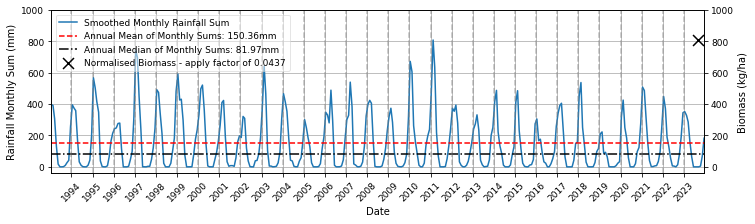

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\site02_2023_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site03.2023_1ha_mth_msum_zonal_stats.csv
site03 2023
Event dates: ['2023-09-07T00:00:00.000000000']


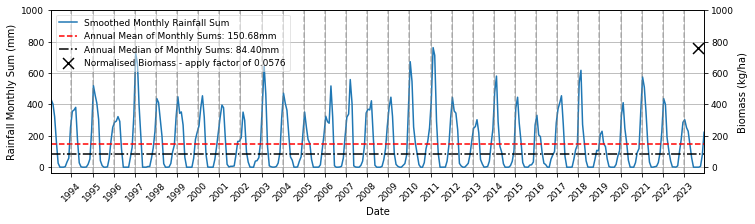

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\site03_2023_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site04.2023_1ha_mth_msum_zonal_stats.csv
site04 2023
Event dates: ['2023-09-07T00:00:00.000000000']


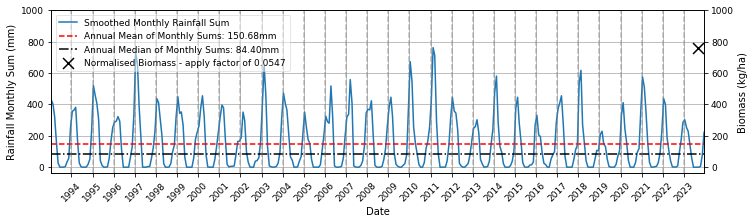

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\site04_2023_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site05.2023_1ha_mth_msum_zonal_stats.csv
site05 2023
Event dates: ['2023-09-08T00:00:00.000000000']


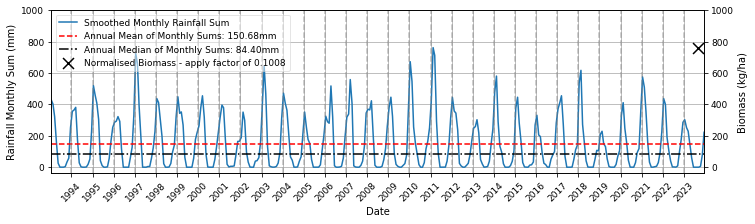

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\site05_2023_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site06.2023_1ha_mth_msum_zonal_stats.csv
site06 2023
Event dates: ['2023-09-08T00:00:00.000000000']


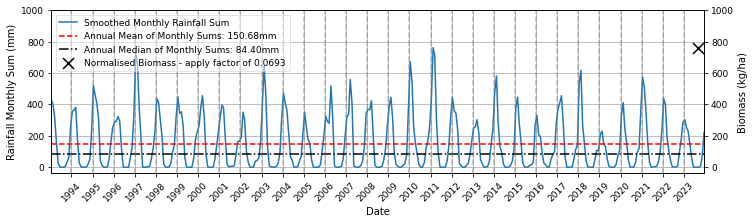

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\site06_2023_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site07.2023_1ha_mth_msum_zonal_stats.csv
site07 2023
Event dates: ['2023-09-09T00:00:00.000000000']


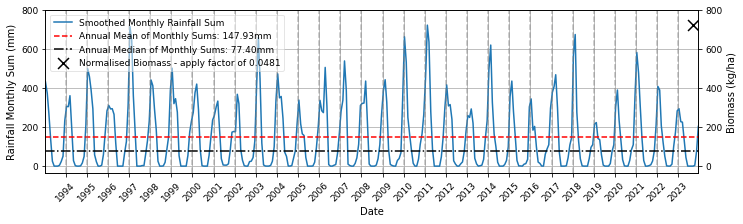

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\site07_2023_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site08.2023_1ha_mth_msum_zonal_stats.csv
site08 2023
Event dates: ['2023-09-09T00:00:00.000000000']


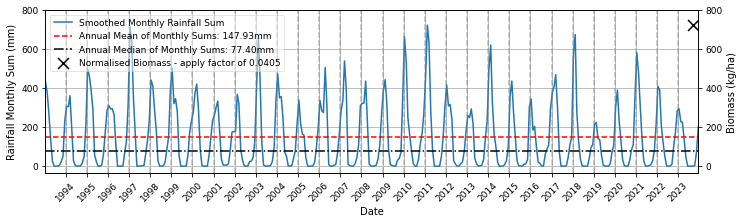

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\site08_2023_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site09.2023_1ha_mth_msum_zonal_stats.csv
site09 2023
Event dates: ['2023-09-10T00:00:00.000000000']


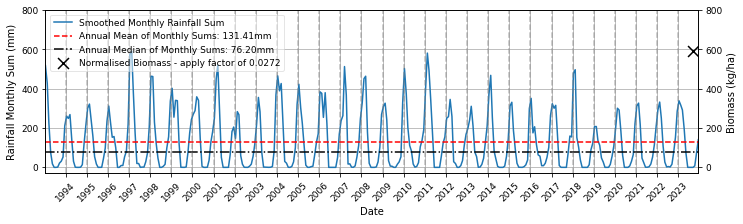

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\site09_2023_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site10.2023_1ha_mth_msum_zonal_stats.csv
site10 2023
Event dates: ['2023-09-10T00:00:00.000000000']


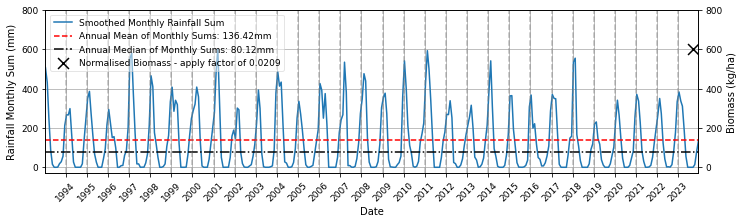

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\site10_2023_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site11.2023_1ha_mth_msum_zonal_stats.csv
site11 2023
Event dates: ['2023-09-10T00:00:00.000000000']


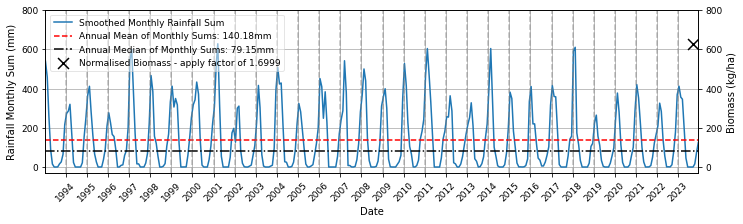

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\site11_2023_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site12.2023_1ha_mth_msum_zonal_stats.csv
site12 2023
Event dates: ['2023-09-10T00:00:00.000000000']


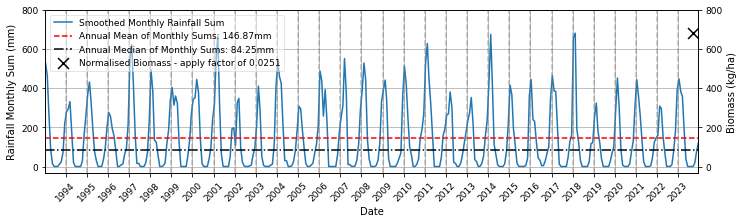

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\site12_2023_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site13.2023_1ha_mth_msum_zonal_stats.csv
site13 2023
Event dates: ['2023-09-10T00:00:00.000000000']


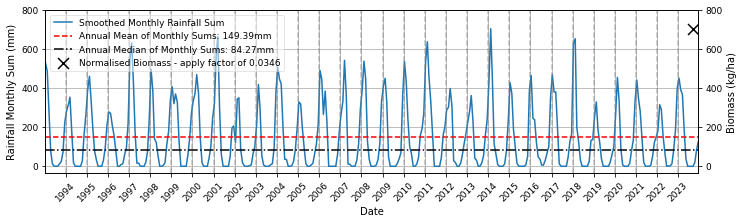

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\site13_2023_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site14.2023_1ha_mth_msum_zonal_stats.csv
site14 2023
Event dates: ['2023-09-10T00:00:00.000000000']


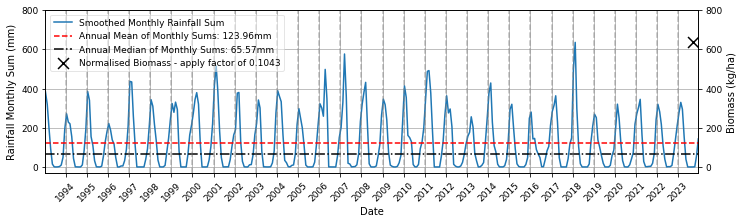

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\site14_2023_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site15.2023_1ha_mth_msum_zonal_stats.csv
site15 2023
Event dates: ['2023-09-10T00:00:00.000000000']


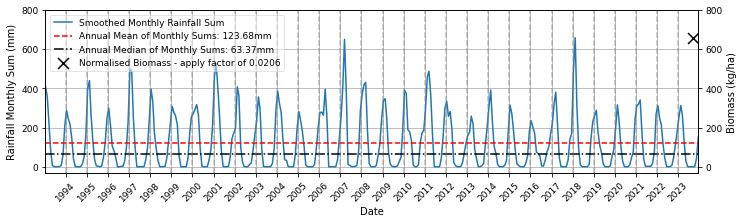

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\site15_2023_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site16.2023_1ha_mth_msum_zonal_stats.csv
site16 2023
Event dates: ['2023-09-10T00:00:00.000000000']


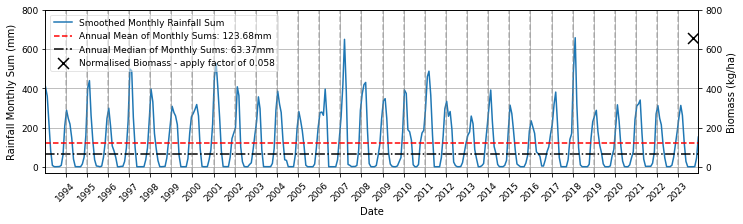

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\site16_2023_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site17.2023_1ha_mth_msum_zonal_stats.csv
site17 2023
Event dates: ['2023-09-10T00:00:00.000000000']


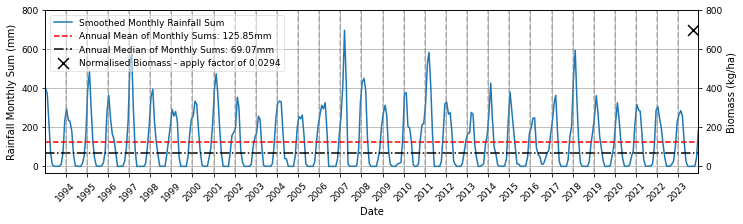

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\site17_2023_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site18.2023_1ha_mth_msum_zonal_stats.csv
site18 2023
Event dates: ['2023-09-10T00:00:00.000000000']


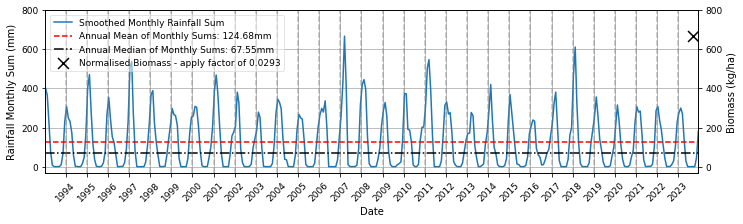

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\site18_2023_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site20.2023_1ha_mth_msum_zonal_stats.csv
site20 2023
Event dates: ['2023-09-16T00:00:00.000000000']


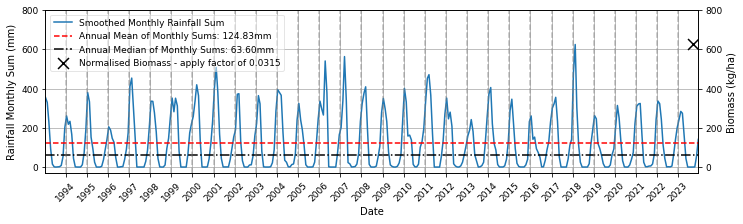

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\site20_2023_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site21.2023_1ha_mth_msum_zonal_stats.csv
site21 2023
Event dates: ['2023-09-16T00:00:00.000000000']


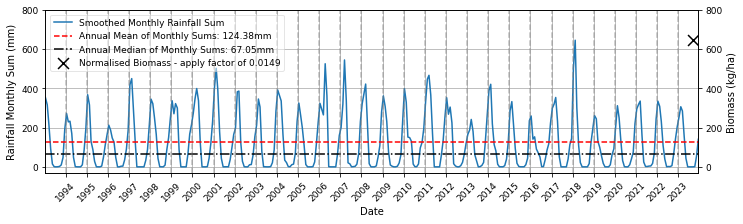

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\site21_2023_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site22.2023_1ha_mth_msum_zonal_stats.csv
site22 2023
Event dates: ['2023-09-16T00:00:00.000000000']


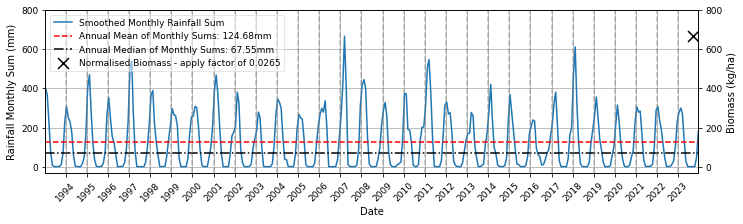

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\site22_2023_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\site23.2023_1ha_mth_msum_zonal_stats.csv
site23 2023
Event dates: ['2023-09-16T00:00:00.000000000']


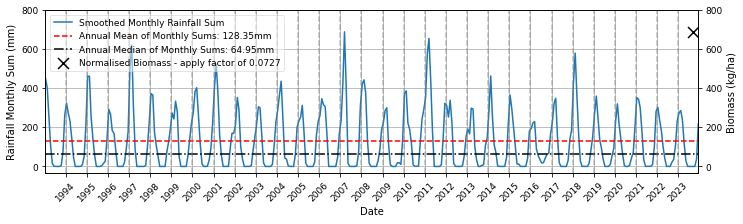

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\site23_2023_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\umb07.2013_1ha_mth_msum_zonal_stats.csv
umb07 2013
Event dates: ['2013-06-03T00:00:00.000000000']


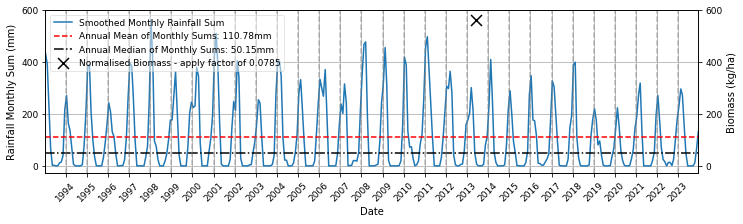

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\umb07_2013_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd16.2012_1ha_mth_msum_zonal_stats.csv
vrd16 2012
Event dates: ['2012-07-27T00:00:00.000000000']


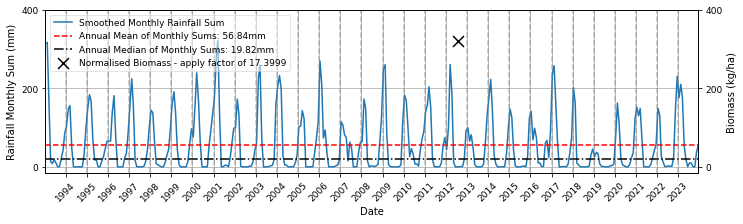

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\vrd16_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd17.2012_1ha_mth_msum_zonal_stats.csv
vrd17 2012
Event dates: ['2012-07-27T00:00:00.000000000']


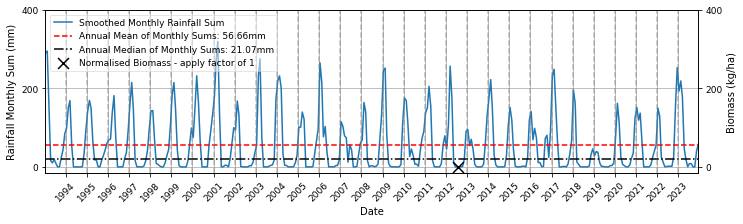

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\vrd17_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd20.2012_1ha_mth_msum_zonal_stats.csv
vrd20 2012
Event dates: ['2012-07-28T00:00:00.000000000']


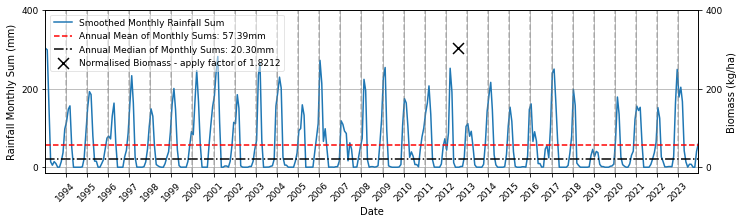

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\vrd20_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd22.2012_1ha_mth_msum_zonal_stats.csv
vrd22 2012
Event dates: ['2012-07-28T00:00:00.000000000']


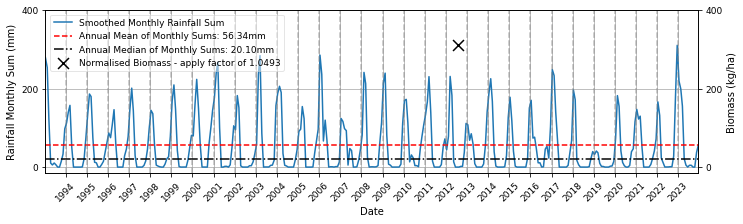

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\vrd22_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd23.2012_1ha_mth_msum_zonal_stats.csv
vrd23 2012
Event dates: ['2012-07-29T00:00:00.000000000']


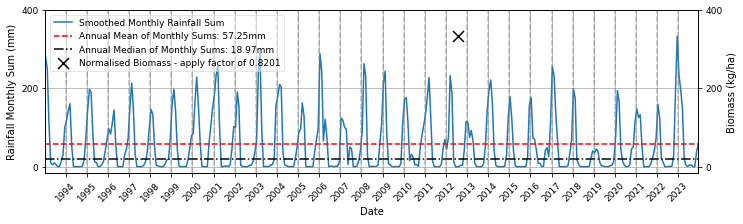

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\vrd23_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd24.2012_1ha_mth_msum_zonal_stats.csv
vrd24 2012
Event dates: ['2012-07-29T00:00:00.000000000']


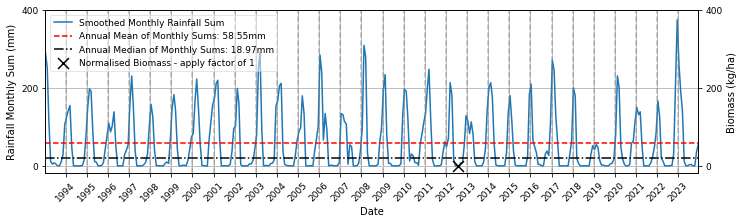

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\vrd24_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd25.2012_1ha_mth_msum_zonal_stats.csv
vrd25 2012
Event dates: ['2012-07-30T00:00:00.000000000']


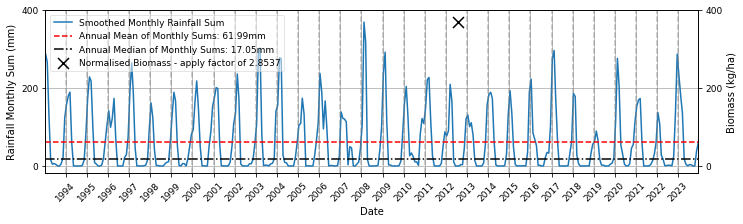

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\vrd25_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd26.2012_1ha_mth_msum_zonal_stats.csv
vrd26 2012
Event dates: ['2012-07-30T00:00:00.000000000']


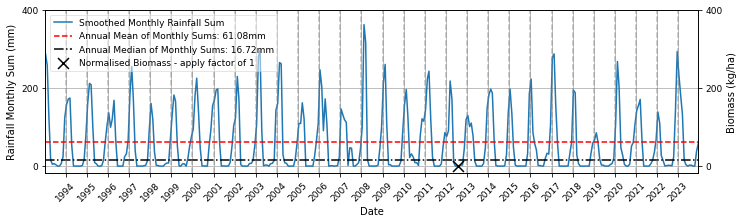

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\vrd26_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd29.2012_1ha_mth_msum_zonal_stats.csv
vrd29 2012
Event dates: ['2012-07-31T00:00:00.000000000']


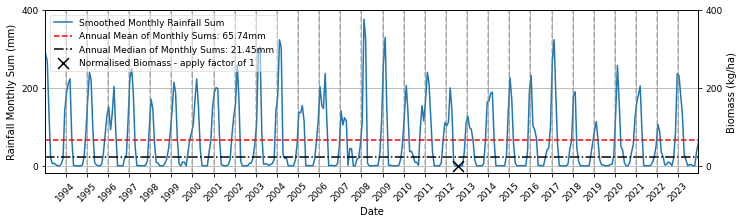

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\vrd29_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd30.2012_1ha_mth_msum_zonal_stats.csv
vrd30 2012
Event dates: ['2012-07-31T00:00:00.000000000']


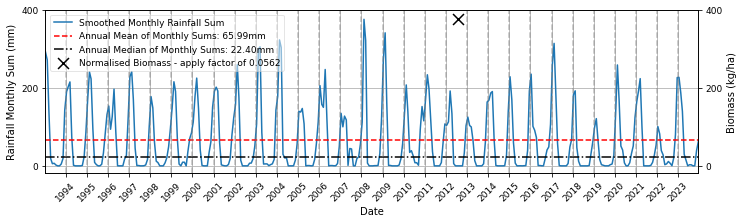

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\vrd30_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd31.2012_1ha_mth_msum_zonal_stats.csv
vrd31 2012
Event dates: ['2012-08-01T00:00:00.000000000']


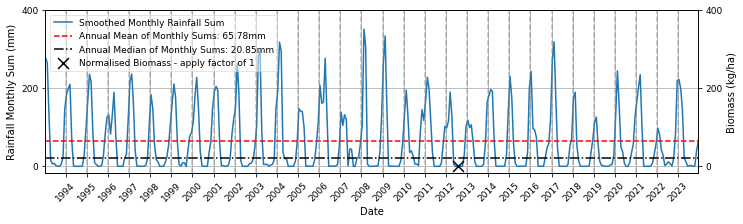

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\vrd31_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd32.2012_1ha_mth_msum_zonal_stats.csv
vrd32 2012
Event dates: ['2012-08-01T00:00:00.000000000']


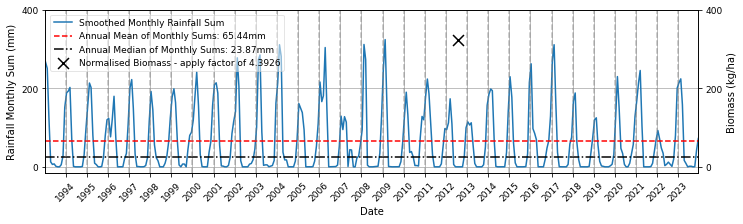

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\vrd32_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd33.2012_1ha_mth_msum_zonal_stats.csv
vrd33 2012
Event dates: ['2012-08-01T00:00:00.000000000']


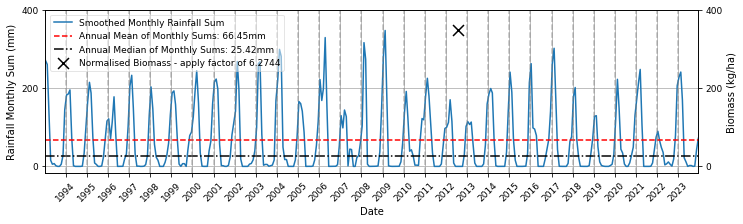

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\vrd33_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd34.2012_1ha_mth_msum_zonal_stats.csv
vrd34 2012
Event dates: ['2012-08-01T00:00:00.000000000']


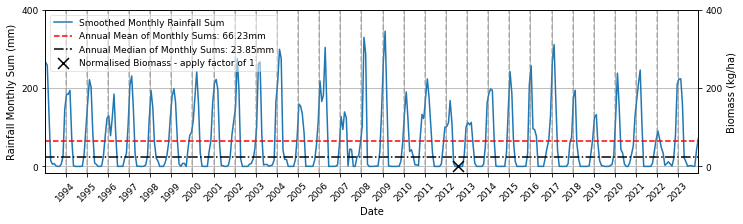

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\vrd34_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd35.2012_1ha_mth_msum_zonal_stats.csv
vrd35 2012
Event dates: ['2012-08-02T00:00:00.000000000']


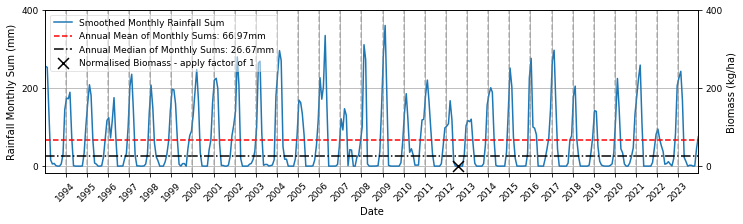

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\vrd35_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd36.2012_1ha_mth_msum_zonal_stats.csv
vrd36 2012
Event dates: ['2012-08-02T00:00:00.000000000']


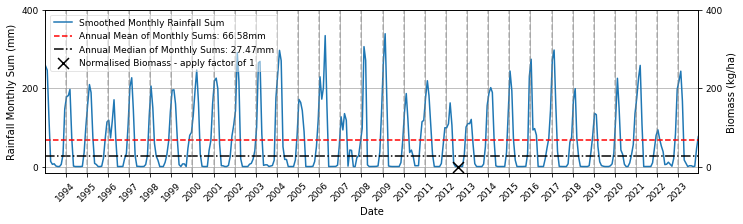

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\vrd36_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\vrd37.2012_1ha_mth_msum_zonal_stats.csv
vrd37 2012
Event dates: ['2012-08-02T00:00:00.000000000']


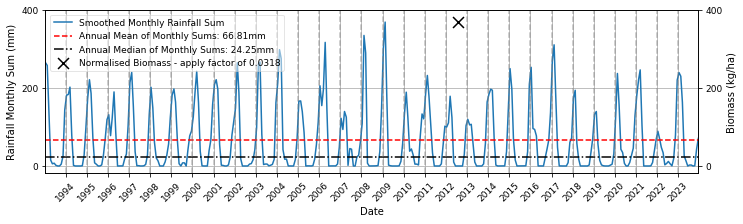

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\vrd37_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\wedo01.2012_1ha_mth_msum_zonal_stats.csv
wedo01 2012
Event dates: ['2012-06-06T00:00:00.000000000']


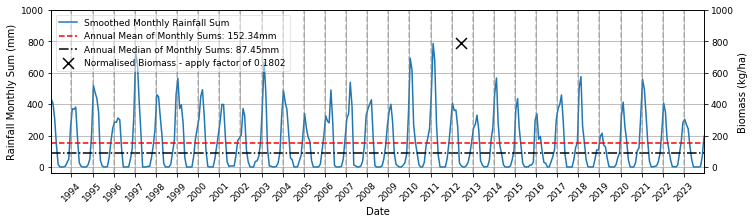

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\wedo01_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\wedo03.2012_1ha_mth_msum_zonal_stats.csv
wedo03 2012
Event dates: ['2012-07-10T00:00:00.000000000']


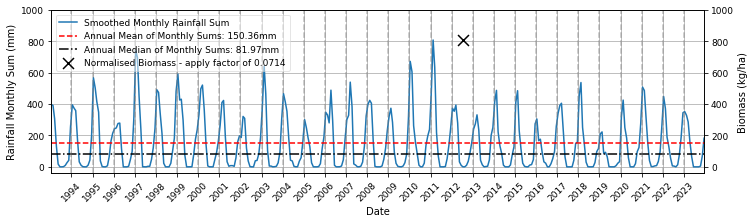

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\wedo03_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\wh02.2012_1ha_mth_msum_zonal_stats.csv
wh02 2012
Event dates: ['2012-07-24T00:00:00.000000000']


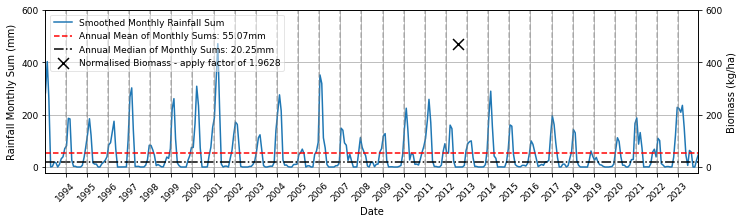

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\wh02_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\wh03.2012_1ha_mth_msum_zonal_stats.csv
wh03 2012
Event dates: ['2012-07-24T00:00:00.000000000']


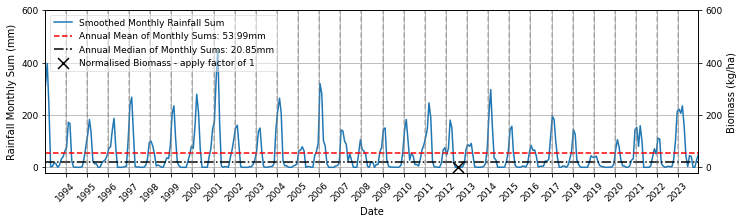

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\wh03_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\wh04.2012_1ha_mth_msum_zonal_stats.csv
wh04 2012
Event dates: ['2012-07-24T00:00:00.000000000']


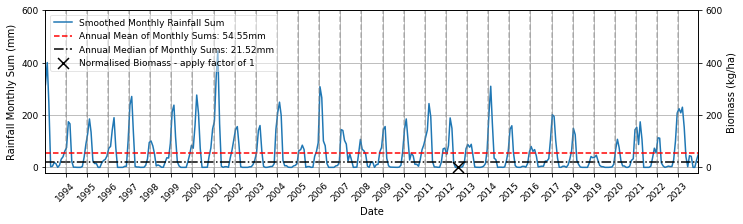

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\wh04_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\wh05.2012_1ha_mth_msum_zonal_stats.csv
wh05 2012
Event dates: ['2012-07-25T00:00:00.000000000']


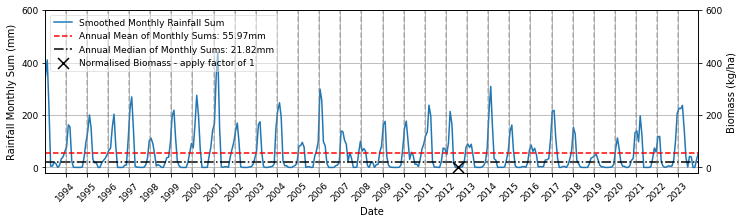

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\wh05_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\wh06.2012_1ha_mth_msum_zonal_stats.csv
wh06 2012
Event dates: ['2012-07-25T00:00:00.000000000']


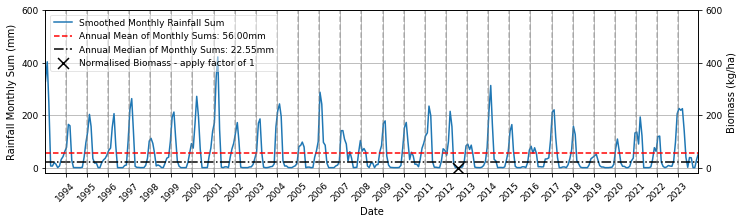

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\wh06_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\wh07.2012_1ha_mth_msum_zonal_stats.csv
wh07 2012
Event dates: ['2012-07-25T00:00:00.000000000']


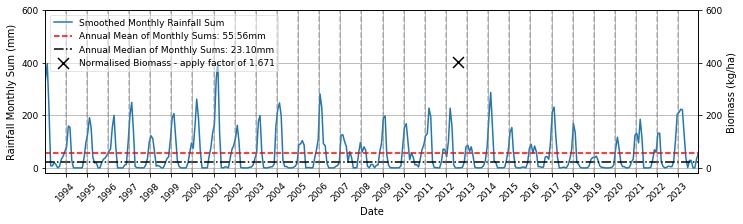

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\wh07_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\wh08.2012_1ha_mth_msum_zonal_stats.csv
wh08 2012
Event dates: ['2012-07-25T00:00:00.000000000']


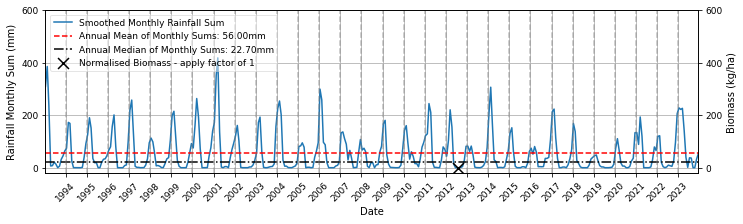

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\wh08_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\wh09.2012_1ha_mth_msum_zonal_stats.csv
wh09 2012
Event dates: ['2012-07-25T00:00:00.000000000']


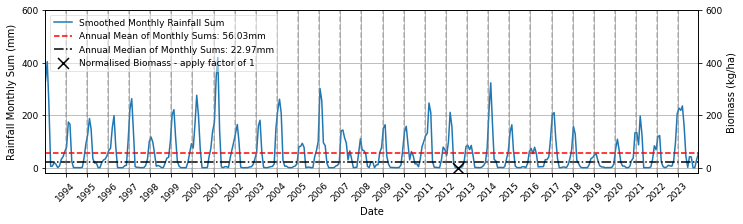

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\wh09_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\wh13.2012_1ha_mth_msum_zonal_stats.csv
wh13 2012
Event dates: ['2012-07-26T00:00:00.000000000']


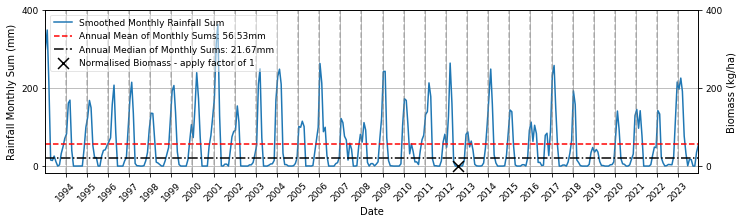

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\wh13_2012_daily_rain_total_line.jpg
----------------------------------------------------------------------------------------------------
Working on: C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\wh15.2012_1ha_mth_msum_zonal_stats.csv
wh15 2012
Event dates: ['2012-07-27T00:00:00.000000000']


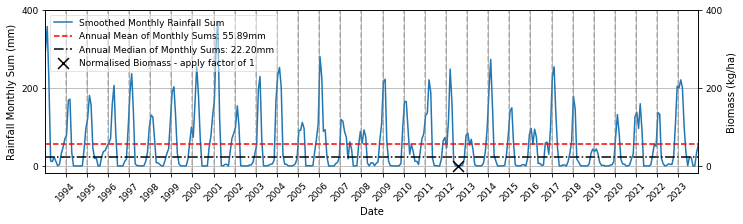

Exported to: C:\Users\robot\projects\biomass\plots\daily_rain\timeseries\total\wh15_2012_daily_rain_total_line.jpg


In [41]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
from glob import glob
from matplotlib.dates import DateFormatter


# Load biomass data
biomass = pd.read_csv(r"C:\Users\robot\projects\biomass\collated_agb\20240707\slats_tern_biomass.csv")
biomass['event_date'] = pd.to_datetime(biomass['date'], format='%Y%m%d')

# Function to change the day of the date
def change_day(date, new_day):
    return date.replace(day=new_day)

# Directory containing the CSV files
#dir_ = r"C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum"

# Process each CSV file in the directory
for f in glob(os.path.join(dir_, "*.csv")):
    print("-" * 100)
    print("Working on:", f)
    
    df = pd.read_csv(f)
    df.dropna(inplace=True)

    # Extract site name and year from the filename
    _, filename = os.path.split(f)
    site_name, field_year = filename.split("_")[0].split(".")
    print(site_name, field_year)
    # capitalize names
    cap_site_name = site_name.upper()
    capitalized_str_type = str_type.capitalize()
    
    # Convert date and add new day
    df['date'] = pd.to_datetime(df['im_date'], format='%Y%m')
    df['day'] = 15
    df['new_date'] = df.apply(lambda row: change_day(row['date'], row['day']), axis=1)
    df['month'] = df['new_date'].dt.month
    df['year'] = df['new_date'].dt.year
    
    # Filter biomass data for the site
    site_biomass = biomass[biomass["site_name"] == site_name]
    event_dates = site_biomass['event_date'].unique()
    bio_agb_kg1ha = site_biomass['bio_agb_kg1ha'].unique()
    
    print("Event dates:", event_dates)
    
    # Filter data to include at most 30 years
    start_year = df['year'].min()
    df = df[df['year'] <= start_year + 30]
    
    # Calculate rolling mean to smooth the data
    df['smoothed_value'] = df['mean'].rolling(window=2, min_periods=1).mean()
    mean_annual_value = df.groupby('year')['smoothed_value'].mean().mean()
    median_annual_value = df.groupby('year')['smoothed_value'].median().median()

    # Determine maximum values for normalization
    max_rainfall = df['smoothed_value'].max()
    max_biomass = max(bio_agb_kg1ha) if len(bio_agb_kg1ha) > 0 else 1
    biomass_factor = max_rainfall / max_biomass if max_biomass != 0 else 1

    # Create time trace plot with smoothed data
    fig, ax1 = plt.subplots(figsize=(11.7, 3))

    lowercase_str_type = str_type.lower()
    sns.lineplot(x='new_date', y='smoothed_value', data=df, ax=ax1, label=f'Smoothed Monthly {str_type.title()} Sum')
    #ax1.set_title(f'{cap_site_name} Total Monthly {capitalized_str_type} Time Trace Plot with Smoothed Line (Data from {df["year"].nunique()-1} Year{"s" if df["year"].nunique() > 1 else ""})')
    ax1.set_xlabel('Date')
    #ax1.set_ylabel(f'{capitalized_str_type} {unit}')
    # Adjust y-axis label to reflect monthly sums
    ax1.set_ylabel(f'{capitalized_str_type} Monthly Sum ({unit})')
    ax1.grid(True)
    
    # Adding horizontal lines for mean and median annual values
#     ax1.axhline(y=mean_annual_value, color='red', linestyle='--', label=f'Annual Daily Mean: {mean_annual_value:.2f}')
#     ax1.axhline(y=median_annual_value, color='black', linestyle='-.', label=f'Annual Daily Median: {median_annual_value:.2f}')
    
    ax1.axhline(y=mean_annual_value, color='red', linestyle='--', label=f'Annual Mean of Monthly Sums: {mean_annual_value:.2f}{unit}')
    ax1.axhline(y=median_annual_value, color='black', linestyle='-.', label=f'Annual Median of Monthly Sums: {median_annual_value:.2f}{unit}')

    # Adding vertical lines and annotations for each year
    for year in df['year'].unique():
        ax1.axvline(pd.Timestamp(year=year, month=1, day=1), color='gray', linestyle='--', alpha=0.5)
#         ax1.text(pd.Timestamp(year=year, month=6, day=15), df['smoothed_value'].max(), str(year), 
#                  horizontalalignment='center', verticalalignment='center', color='gray', alpha=0.7, fontsize=10)
    
    # Create a secondary y-axis to plot biomass data
    ax2 = ax1.twinx()
    ax2.set_ylabel('Biomass (kg/ha)')

    # Adding biomass data points on the secondary y-axis with scaling
    for bio_date, bio_value in zip(event_dates, bio_agb_kg1ha):
        scaled_bio_value = bio_value * biomass_factor
        round_factor = round(biomass_factor, 4)
        ax2.scatter(bio_date, scaled_bio_value, color='black', zorder=5, marker = 'x',
                    label=f'Normalised Biomass - apply factor of {round_factor}', s=120)
#         ax2.text(bio_date, scaled_bio_value, 'Normalised Biomass', 
#                  horizontalalignment='left', verticalalignment='bottom', color='black', zorder=5)

    
    # Ensuring only unique labels in the legend
    handles1, labels1 = ax1.get_legend_handles_labels()
    handles2, labels2 = ax2.get_legend_handles_labels()
    by_label = dict(zip(labels1 + labels2, handles1 + handles2))
    ax1.legend(by_label.values(), by_label.keys(), loc='upper left', framealpha=0.5)

    # Aligning x-axis ticks and limits
    ax1.set_xlim(df['new_date'].min(), df['new_date'].max())
    ax1.set_xticks(pd.date_range(start=df['new_date'].min(), end=df['new_date'].max(), freq='YS'))
    ax1.set_xticklabels(pd.date_range(start=df['new_date'].min(), end=df['new_date'].max(), freq='YS').strftime('%Y-%m-%d'), rotation=45)
    ax1.xaxis.set_major_formatter(DateFormatter('%Y'))
    
    # Setting y-axis ticks to start at 0 for both axes with an interval of 200
    max_y = max(ax1.get_ylim()[1], ax2.get_ylim()[1])
    min_y = min(ax1.get_ylim()[0], ax2.get_ylim()[0])
    ax1.set_ylim(min_y, max_y)
    ax2.set_ylim(min_y, max_y)
    
    y_ticks = np.arange(0, max_y + 200, 200)
    ax1.set_yticks(y_ticks)
    ax2.set_yticks(y_ticks)

    line_out = os.path.join(export_line, f"{site_name}_{field_year}_{d_type}_total_line.jpg")
    plt.savefig(line_out, bbox_inches='tight', dpi=300,)
    plt.show()
    print(f"Exported to: {line_out}")

In [48]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
from glob import glob
from matplotlib.dates import DateFormatter

# Load the main dataset
df = pd.read_csv(r"C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\min_temp\cor\agb02.2012_1ha_cor_zonal_stats.csv")
df.dropna(inplace=True)

# Convert the date column to datetime format (adjust the column name if necessary)
df['date'] = pd.to_datetime(df['date'], format='%Y-%m-%d')

# Create new columns for month and year if they don't already exist
df['month'] = df['date'].dt.month
df['year'] = df['date'].dt.year

# Filter the data to include at most 30 years
start_year = df['year'].min()
df = df[df['year'] <= start_year + 30]

# Calculate rolling mean to smooth the data (for example, using a 12-month window)
df['smoothed_max_temp'] = df['max_temp'].rolling(window=12, min_periods=1).mean()

# Calculate annual mean and median values
mean_annual_value = df.groupby('year')['smoothed_max_temp'].mean().mean()
median_annual_value = df.groupby('year')['smoothed_max_temp'].median().median()

# Plotting the time series
fig, ax1 = plt.subplots(figsize=(11.7, 3))

# Line plot for the smoothed maximum temperature
sns.lineplot(x='date', y='smoothed_max_temp', data=df, ax=ax1, label='Smoothed Monthly Maximum Temperature')
ax1.set_xlabel('Date')
ax1.set_ylabel('Maximum Temperature (°C)')
ax1.grid(True)

# Adding horizontal lines for mean and median annual values
ax1.axhline(y=mean_annual_value, color='red', linestyle='--', label=f'Annual Mean of Monthly Averages: {mean_annual_value:.2f}°C')
ax1.axhline(y=median_annual_value, color='black', linestyle='-.', label=f'Annual Median of Monthly Averages: {median_annual_value:.2f}°C')

# Aligning x-axis ticks and limits
ax1.set_xlim(df['date'].min(), df['date'].max())
ax1.set_xticks(pd.date_range(start=df['date'].min(), end=df['date'].max(), freq='YS'))
ax1.set_xticklabels(pd.date_range(start=df['date'].min(), end=df['date'].max(), freq='YS').strftime('%Y-%m-%d'), rotation=45)
ax1.xaxis.set_major_formatter(DateFormatter('%Y'))

# Setting y-axis ticks
y_ticks = np.arange(0, df['smoothed_max_temp'].max() + 2, 2)  # Adjust tick intervals if needed
ax1.set_yticks(y_ticks)

# Finalize and show the plot
plt.legend(loc='upper left', framealpha=0.5)
plt.tight_layout()
plt.show()

# Save the plot (adjust the path and filename as needed)
output_path = r"/mnt/data/agb02_2012_max_temp_mean_line_updated.jpg"
plt.savefig(output_path, bbox_inches='tight', dpi=300)
print(f"Plot saved to: {output_path}")

KeyError: 'date'

# END

annual total = sum of the mean rainfall across all months in a year

month_avg = the sum of the mean monthly rainfall for each month across all years

# Plot all met variables

In [8]:
# type of data
d_type = "daily_rain"
#d_type = "et_morton_actual"
#d_type = "max_temp"
#d_type = "min_temp"
#d_type = "rh_tmax"
#d_type = "rh_tmin"
# d_type = "vp"


if d_type == "daily_rain":
    str_type = "precipitation"
    y_lim = [-5, 25]
    
elif d_type == "et_morton_actual":
    str_type = "Morton's evapotranspiration"
    y_lim = [0, 10]

elif d_type == "max_temp":
    str_type = "maximum temperature"
    y_lim = [20, 45]

elif d_type == "min_temp":
    str_type = "minimum temperature"
    y_lim = [0, 40]

elif d_type == "rh_tmax":
    str_type = "maximum relative humidity"
    y_lim = [3200, 3400]
    
elif d_type == "rh_tmin":
    str_type = "minimum relative humidity"
    y_lim = [3200, 3400]

elif d_type == "vp":
    str_type = "vapour pressure"
    
elif d_type == "all":
    str_type = "meterological variables"
    
else:
    pass

# met data
#dir_ = r"X:\PGB\RSU\biomass\raw_zonal_stats\met\collation\slats_tern\{0}".format(d_type)
rain_dir_ = r"X:\PGB\RSU\biomass\zonal_stats_raw\met_clean\daily_rain"
et_dir_ = r"X:\PGB\RSU\biomass\zonal_stats_raw\met_clean\et_morton_actual"
max_tem_dir_ = r"X:\PGB\RSU\biomass\zonal_stats_raw\met_clean\max_temp"
rain_dir_ = r"X:\PGB\RSU\biomass\zonal_stats_raw\met_clean\daily_rain"
rain_dir_ = r"X:\PGB\RSU\biomass\zonal_stats_raw\met_clean\daily_rain"
rain_dir_ = r"X:\PGB\RSU\biomass\zonal_stats_raw\met_clean\daily_rain"

# plot directories
export_dir = r"X:\PGB\RSU\biomass\plots\slats_tern\{0}".format(d_type)
mk_dir_fn(export_dir)

export_box = os.path.join(export_dir, "box_plots")
mk_dir_fn(export_box)
export_line = os.path.join(export_dir, "line_plots")
mk_dir_fn(export_line)


csv_export = r"X:\PGB\RSU\biomass\met_zonal_stats_per_site\slats_tern\{0}".format(d_type)
mk_dir_fn(csv_export)

monthly_dir = os.path.join(csv_export, "mean_monthly_{0}".format(d_type))
mk_dir_fn(monthly_dir)

mean_monthly_dir = os.path.join(csv_export, "monthly_{0}".format(d_type))
mk_dir_fn(mean_monthly_dir)

seasonal_dir = os.path.join(csv_export, "seasonal_{0}".format(d_type))
mk_dir_fn(seasonal_dir)

si_dir = os.path.join(csv_export, "si_{0}".format(d_type))
mk_dir_fn(si_dir)

FileNotFoundError: [WinError 3] The system cannot find the path specified: 'X:\\PGB\\RSU\\biomass\\plots\\slats_tern\\daily_rain'

In [53]:
for f in glob(os.path.join(dir_, "*.csv")):
    csv_file = f
    print("-"*100)
    print("working for: ", f)
    
    df = pd.read_csv(csv_file)
    df.dropna(inplace=True)
    df1 = pd.read_csv(csv_file)
    df1.dropna(inplace=True)
    
    # extract name and site year
    _, f = os.path.split(csv_file)
    flist = f.split("_")
    site_name, field_year = flist[0].split(".")
    print(site_name, field_year)
    
    # splitting date time to year month and day
    year = []
    month = []
    day = []

    for index, row in df.iterrows():
        #print(row["im_date"])
        date = str(row["im_date"])
        year.append(date[:4])
        month.append(date[4:6])
        day.append(date[6:])

    df["year"] = year
    df["month"] = month
    df["day"] = day
    
    # collate df
    year_list = []
    month_list = []

    mean_list = []
    
    #print(list(df.columns))

#     # ---------------- calulate montly mean met value across all data ---------------------------
    
    for y in df["year"].unique():
        #year_list.append(y)
        y_df = df[df["year"]== y]

        for m in y_df["month"].unique():
            my_df = y_df[y_df["month"]== m]
            
            col_list = my_df.columns.tolist()
            #print(col_list)
            matches = [match for match in col_list if "mean" in match]
            #print(matches[0])
            ym = my_df[matches[0]].tolist()
            year_list.append(y)
            month_list.append(m)
            mean_list.append(mean(ym))
            
            
    monthly_df = pd.DataFrame({"year": year_list,
                     "month": month_list,
                    "mean": mean_list})
    
    monthly_df.insert(0, "site", site_name)
    monthly_df.insert(1, "site_year", field_year)
    monthly_df.insert(2, "met", d_type)
    
    monthly_out = os.path.join(monthly_dir, f"{site_name}_monthly_{d_type}.csv")
    monthly_df.to_csv(monthly_out, index = False)
    
#     # ------------------------------------------------------------------------------------------
    
    
    month_list2 = []
    mean_month_list = []
    month_list3 = []

    for m in monthly_df["month"].unique():
        #print("month: ", m)
        #month_list3.append(m)

        my_df = monthly_df[monthly_df["month"]== m]
        month_var = my_df["mean"].tolist()
        
        mean_month_list.append(mean(month_var))
        month_list3.append(month_var)
        month_list2.append(m)
    
    #print("month_list2: ", month_list2)
    #print("mean_month_list: ", mean_month_list)
    #print("="*50)
    mean_monthly_df = pd.DataFrame({
                             "month": month_list2,
                            "var": mean_month_list})
    
    mean_monthly_df.insert(0, "site", site_name)
    mean_monthly_df.insert(1, "site_year", field_year)
    mean_monthly_df.insert(2, "met", d_type)
    
    mean_monthly_out = os.path.join(mean_monthly_dir, f"{site_name}_mean_monthly_{d_type}.csv")
    mean_monthly_df.to_csv(mean_monthly_out, index = False)
    
    print("export: ", mean_monthly_out)

    
    # ------------------------------------------ Box Plot -----------------------------------------------
        
    data = month_list3
    #print(data)

    fig = plt.figure(figsize =(10, 7))
    plt.ylim(y_lim[0], y_lim[1])

    plt.xticks([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], 
               ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'June', 'July', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], 
               #rotation=90,  fontsize='12',
              )
    plt.title(f'Mean monthly {str_type} variation between 1988 and 2023 at site: {site_name}.',  fontsize='12', horizontalalignment='center')
    # Custom Axis title
    plt.xlabel('Months',  fontsize='12', horizontalalignment='center')
    # Custom Axis title
    plt.ylabel('Monthly mean {0} (mm)'.format(str_type),  fontsize='12', horizontalalignment='center')
    # Creating plot
    plt.boxplot(data, showfliers = False)

    box_out = os.path.join(export_box, f"{site_name}_{field_year}_{d_type}_box.jpg")
    plt.savefig(box_out)
    
    #show plot
    plt.show()
    
    print("box plot output: ", box_out)
    
    # ---------------------- Time Trace --------------------------

    # Time trace 
    y_list = monthly_df["year"].tolist()
    m_list = monthly_df["month"].tolist()
    val_list = monthly_df["mean"].tolist()
    dt_list2 = []
    year__ = monthly_df["year"].unique().tolist()
    for y, m, v  in zip(y_list, m_list, val_list):
        i = f"{str(y)}{str(m)}15"

        dt_list2.append(pd.to_datetime(i, format='%Y%m%d'))

    df3 = pd.DataFrame(val_list, index=dt_list2, columns=["met"])

    fig, axs = plt.subplots(1,1, figsize=(18,5))
    x = df3.index
    y = df3.met
    axs.plot(x, y, label='Rainfall')
    fig.show() 
    
    plt.title('Time trace mean {0} between 1988 and 2023, site: {1} .'.format(str_type, site_name),  fontsize='14', horizontalalignment='center')
    # Custom Axis title
    plt.xlabel('Years',  fontsize='14', horizontalalignment='center')
    # Custom Axis title
    plt.ylabel('Mean monthly {0} (mm)'.format(str_type),  fontsize='14', horizontalalignment='center')

    axs.set_xticklabels(year__)
    axs.xaxis.set_ticks(year__)
    plt.xticks(rotation=45, ha='right', fontsize='12')
    # limit data time
    plt.xlim(['1993', '2023'])
    
    median_value = np.median(y)
    axs.axhline(median_value, color='grey', linestyle='--', label=f'Median: {median_value:.2f}')
    axs.legend()
    
    mean_value = np.mean(y)
    axs.axhline(mean_value, color='black', linestyle='--', label=f'Mean: {mean_value:.2f}')
    axs.legend()

    #plt.ylim([0, :]) not sure if this will work
    line_out = os.path.join(export_line, f"{site_name}_{field_year}_{d_type}_line.jpg")
    plt.savefig(line_out)
    fig.show()     
    print("Timetrace plot output: ", line_out)
    
    # ---------------- calulate montly mean met value across all data ---------------------------

    dict_ = {"year": [],
            "month": [],
             "ym_total": [],
            "annual_total": [],
            }

    djf = []
    mam = []
    jja = []
    son = []
    dry = []
    wet = []
    df.dropna(inplace=True)
    
    # seperate per year
    for y in df["year"].unique():
        #year_list.append(y)
        y_df = df[df["year"]== y]
        
        col_list = y_df.columns.tolist()
        #print(col_list)
        matches = [match for match in col_list if "mean" in match]
        #print(matches[0])
        mean_values = y_df[matches[0]].tolist()
        #print("mean_heading: ", mean_heading)

#         y_sum = y_df[mean_heading].tolist()
#         print("y_sum values: ", y_sum)
        annual_totals = sum(mean_values)

        #seperate per month per year
        for m in y_df["month"].unique():
            my_df = y_df[y_df["month"]== m]

            dict_["year"].append(y)
            dict_["month"].append(m)

            #print(my_df)

            col_list = my_df.columns.tolist()
            #print(col_list)
            matches = [match for match in col_list if "mean" in match]
            #print(matches[0])
            ym_values = my_df[matches[0]].tolist()

            #ym_values = my_df[mean_heading].tolist()
            #print("ym_sum values: ", ym_sum)
            month_year_totals = sum(ym_values)
            #print("annual_totals: ", annual_totals)

            dict_["annual_total"].append(annual_totals)
            dict_["ym_total"].append(month_year_totals)


    new_df = pd.DataFrame(dict_)

    new_df
    # new_df["month_avg"] = 0
    month_avg = []

    # Calculate the monthly average
    for m in new_df["month"].unique():
        #year_list.append(y)
        m_df = new_df[new_df["month"]== m]

        m_sum = m_df["ym_total"].tolist()
        #print("m_sum values: ", m_sum)
        month_average = sum(m_sum)
        m_df["month_avg"] = month_average 
        month_avg.append(m_df)

    out_df = pd.concat(month_avg)


    year = []

    djf_list = []
    mam_list = []

    dict_ = {"site": [],
            "year": [],
            "djf": [],
            "mam": [],
            "jja": [],
            "son": [],
            "dry": [],
            "wet": [],
             "annual" : [],
             #"si": [],
            }
    # seperate per year
    for y in out_df["year"].unique():
        #year_list.append(y)
        int_lst_y = int(y)-1
        str_l_year = str(int_lst_y)
        y_df = out_df[out_df["year"]== y]
        prev_y_df  = out_df[out_df["year"]== str_l_year]
        dict_["year"].append(y)

        tot_list = y_df["annual_total"].unique().tolist()
        dict_["annual"].append(tot_list[0])

        dict_["site"].append(site_name)

        #seperate into seasons
        djf_df1 = y_df[(y_df["month"]== "01") | (y_df["month"]== "02")]
        djf_df2 = prev_y_df[prev_y_df["month"]== "12"]
        djf_df = pd.concat([djf_df1, djf_df2])
        djf = djf_df["ym_total"].tolist()
        djf_df["djf_tot"] = sum(djf)
        dict_["djf"].append(sum(djf))


        #seperate into seasons
        mam_df = y_df[(y_df["month"]== "03") | (y_df["month"]== "04") | (y_df["month"]== "05")]
        mam = mam_df["ym_total"].tolist()
        mam_df["mam_tot"] = sum(mam)
        dict_["mam"].append(sum(mam))

        #seperate into seasons
        jja_df = y_df[(y_df["month"]== "06") | (y_df["month"]== "07") | (y_df["month"]== "08")]
        jja = jja_df["ym_total"].tolist()
        jja_df["jja_tot"] = sum(jja)
        dict_["jja"].append(sum(jja))

        #seperate into seasons
        son_df = y_df[(y_df["month"]== "09") | (y_df["month"]== "10") | (y_df["month"]== "11")]
        son = son_df["ym_total"].tolist()
        son_df["son_tot"] = sum(son)
        dict_["son"].append(sum(son))

        #seperate into seasons
        dry_df = y_df[(y_df["month"]== "05") | (y_df["month"]== "06") | (y_df["month"]== "07") | (y_df["month"]== "08") | (y_df["month"]== "09")]
        dry = dry_df["ym_total"].tolist()
        dry_df["dry_tot"] = sum(dry)
        dict_["dry"].append(sum(dry))

        #seperate into seasons
        wet_df = y_df[(y_df["month"]== "01") | (y_df["month"]== "02") | (y_df["month"]== "03") | (y_df["month"]== "04") | (y_df["month"]== "10") | (y_df["month"]== "11") | (y_df["month"]== "12")]
        wet = wet_df["ym_total"].tolist()
        wet_df["wet_tot"] = sum(wet)
        dict_["wet"].append(sum(wet))

    seasonal_df = pd.DataFrame(dict_)
    csv_out = os.path.join(seasonal_dir, f"seasonal_{site_name}_{field_year}_{d_type}.csv")
    print("export: ", csv_out)
    seasonal_df.to_csv(csv_out, index=False)
    
    # --------------------------------------------------- seasonal index -------------------------------------
    print("="*50)
    dict2 = {"site": [],
             "year": [],
         "month": [],
         "month_total": [],
         "month_average": [],
        "annual_total": [],
        "annual_average_R": [],
        "annual_si": []
        }
    # seperate per year
    for y in df["year"].unique():
        y_df = df[df["year"]== y]
        
        col_list = y_df.columns.tolist()
        #print(col_list)
        matches = [match for match in col_list if "mean" in match]
        print(matches[0])
        
        y_sum = y_df[matches[0]].tolist()
        #calucalue annual rainfall totals
        annual_total = sum(y_sum)
        #print("annual_total: ", annual_total)

        # calculate the annual rainfall mean
        R = mean(y_sum)
        #print("annual average R: ", R)
        #print(y_sum)

        month_avg = []
        #seperate per month per year
        month_list = y_df["month"].unique()
        for m in month_list:
            my_df = y_df[y_df["month"]== m]
            ym_sum = my_df[matches[0]].tolist()
            # Calculate monthly rainfall totals per year
            month_year_totals = sum(ym_sum)

            # Calculate monthly ranfall per year averages
            month_year_avg = mean(ym_sum)
            month_avg.append(month_year_avg)

            # append values to dictonary
            dict2["site"].append(site_name)
            dict2["year"].append(y)
            dict2["month"].append(m)
            dict2["annual_total"].append(annual_total)
            dict2["annual_average_R"].append(R)
            dict2["month_total"].append(month_year_totals)
            dict2["month_average"].append(month_year_avg)
            

        # append si values
        for i in month_list:
            # call si funcution
            #print("month_avg: ", month_avg)
            si = si_fn(R, month_avg)
            print(f"si for {site_name} and {year} form month = {1}: ", si)
            dict2["annual_si"].append(si)
            
    si_df = pd.DataFrame(dict2)
    si_out = os.path.join(si_dir, f"seasonal_{site_name}_{field_year}_{d_type}.csv")
    print("export: ", si_out)
    si_df.to_csv(si_out, index=False)

----------------------------------------------------------------------------------------------------
working for:  C:\Users\robot\projects\biomass\zonal_stats_raw\met_clean\daily_rain\mth_msum\agb02.2012_1ha_mth_msum_zonal_stats.csv
agb02 2012


NameError: name 'monthly_dir' is not defined